In [ ]:
# Работа с массивами данных
import numpy as np 

# Работа с таблицами
import pandas as pd

# Отрисовка графиков
import matplotlib.pyplot as plt

# Функции-утилиты для работы с категориальными данными
from tensorflow.keras import utils

# Класс для конструирования последовательной модели нейронной сети
from tensorflow.keras.models import Sequential

# Основные слои
from tensorflow.keras.layers import Dense, Dropout, Conv1D, SpatialDropout1D, BatchNormalization, Embedding, Flatten, Activation,MaxPooling1D

# Токенизатор для преобразование текстов в последовательности
from tensorflow.keras.preprocessing.text import Tokenizer

# Заполнение последовательностей до определенной длины
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Матрица ошибок классификатора
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.preprocessing import OneHotEncoder

# Кодирование тестовых меток
from sklearn.preprocessing import LabelEncoder

# Разбиение на тренировочную и тестовую выборки
from sklearn.model_selection import train_test_split

from tensorflow.keras.optimizers import Adam

# Загрузка датасетов из облака google
import gdown

# Отрисовка графиков
import matplotlib.pyplot as plt

%matplotlib inline

# Для отрисовки графиков
import seaborn as sns
import warnings

## **anvil**

In [ ]:
!pip install anvil-uplink

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 87 kB 5.7 MB/s 
     |████████████████████████████████| 51 kB 180 kB/s 
  Created wheel for ws4py: filename=ws4py-0.5.1-py3-none-any.whl size=45229 sha256=f67c2231895e3f5a310c62da064fdb4de43cf91dbb3d9da542be06b63b3d9152
  Stored in directory: /root/.cache/pip/wheels/29/ea/7d/3410aa0aa0e4402ead9a7a97ab2214804887e0f5c2b76f0c96
Successfully built ws4py


In [ ]:
import anvil.server
anvil.server.connect("4JRGT4YFRHXVKN2E6DCZ236W-BMK4WG3FUTLLY6FJ")

Connecting to wss://anvil.works/uplink
Anvil websocket open
Connected to "Default environment" as SERVER


## **Загрузка датасетов**

In [ ]:
!unzip -q "SFO.zip" -d /content/ # подгрузим базу в ноутбук в директорию 'content/'


In [ ]:
ls

'1. Компании.xlsx'       sample_data/
'2. Продукты_new.xlsx'   SFO.zip
'3. Отрасли.xlsx'       'Пояснение к датасету.docx'
'4. Технологии.xlsx'    'Справочник. Отрасли и подотрасли.xlsx'
 Merged.csv             'Справочник. Технологии.xlsx'


In [ ]:
xlcom = pd.ExcelFile('1. Компании.xlsx')

In [ ]:
print(xlcom.sheet_names)

['Sheet0']


In [ ]:
dfcom = xlcom.parse('Sheet0')

In [ ]:
dfcom.columns = dfcom.columns.str.replace(" ", "_")
dfcom

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
0,784577,"ООО ""АГРОПЛАЗМА""",СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Растениеводство,Синтез материальных объектов,Синтез живых организмов и систем,Технологии селекции растений,http://www.agroplazma.com,ООО «Агроплазма» является оригинатором и патен...
1,810784,"ООО ""ЛАБОРАТОРИЯ НАНОСЕМАНТИКА""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Синтез информации,Искусственный интеллект,"Обработка естественных языков (перевод, класси...",https://nanosemantics.ai/,"""Лаборатория Наносемантика"" — ведущий российск..."
2,810785,"ООО ""РОМЕТ""",ПРОМЫШЛЕННОСТЬ,"Металлургия, металлопродукция, производство го...",Синтез материальных объектов,Новые производственные процессы,Технологии сварки и пайки,http://ro-met.com,"Компания ""ROMeT"" специализируется на производс..."
3,810786,"АО ""СМАРТФИН""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Обработка и хранение больших данных,Интерфейсы обмена большими данными,https://www.2can.ru,Компания 2can решает проблему приема денежных ...
4,810787,"ООО ""УЧИ.РУ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Синтез контента,Синтез образовательного контента,http://www.uchi.ru,"""Учи.ру"" — крупнейшая отечественная образовате..."
...,...,...,...,...,...,...,...,...,...
3712,1064098,"ООО ""ПРОКОНСАЛТ""",ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРО...,"Заказные исследования и разработки, государств...",Синтез материальных объектов,Инженерные комплексы,Робототехнические решения,Не указано,"ООО ""Проконсалт"" инновационная, динамично разв..."
3713,1064163,"ООО ""ШЕРПА РОБОТИКС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Искусственный интеллект,Экспертные системы на базе искусственного инте...,https://sherparpa.ru/,Компания Шерпа Роботикс - разработчик Платформ...
3714,1064380,"ООО ""ИСТИННЫЙ МЕТОД""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления жизненным циклом сложных ин...,https://projectpoint.ru/,"Частная и прибыльная Российская компания, разр..."
3715,1064405,"ООО ""ГБЦ""",ПРОМЫШЛЕННОСТЬ,Производство новых материалов,Синтез материальных объектов,Материалы с новыми свойствами,Изменение объемных свойств,http://gbc-ural.ru/ ; https://gbc-russia.ru/,Разработка и производство прокладок для двигат...


# **анализ аномалий**

In [ ]:
dfcom.describe(include=[object])  

,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
count,3717,3717,3717,3717,3717,3717,3717,3717
unique,3362,21,124,6,32,205,2406,3514
top,"ООО ""БАЗИС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез материальных объектов,Искусственный интеллект,Компьютерное зрение и обработка изображений,Не указано,н/д
freq,4,1237,402,1342,527,173,950,11


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "БАЗИС"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
280,811078,"ООО ""БАЗИС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Технологии цифровой безопасности,Контроль вторжений в информационные системы,https://navigator.sk.ru/orn/1121463,«ТИОНИКС» – разработчик программных продуктов ...
1217,1023566,"ООО ""БАЗИС""",ПРОМЫШЛЕННОСТЬ,Производство электронного и электрического обо...,Синтез материальных объектов,Новые производственные процессы,Технологии сварки и пайки,http://www.bazis.vrn.ru,"Компания ""БАЗИС"" является отечественным произв..."
1698,1030265,"ООО ""БАЗИС""",ПРОМЫШЛЕННОСТЬ,Производство электронного и электрического обо...,Синтез материальных объектов,Новые производственные процессы,Технологии сварки и пайки,http://www.bazis.vrn.ru,"Компания ""БАЗИС"" является отечественным произв..."
1712,1030505,"ООО ""БАЗИС""",БЕЗОПАСНОСТЬ И КОНТРОЛЬНО-НАДЗОРНАЯ ДЕЯТЕЛЬНОСТЬ,Охрана труда,Синтез информации,Формирование электромагнитных управляющих сигн...,"Управление устройствами (свет, двигатели и дру...",Не указано,Общество с ограниченной ответственностью «БАЗИ...


In [ ]:
dfcom[(dfcom.Подотрасль=="н/д")]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
944,940986,ООО«АЛИБАБА.КОМ(РУ)»,н/д,н/д,н/д,н/д,н/д,-,Cоздание крупнейшего совместного предприятия в...
945,941064,ООО «Производственная компания «Борец»,н/д,н/д,н/д,н/д,н/д,-,Поддержка Компании в масштабных научных исслед...


In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfcom['Наименование_поддержанной_компании'].value_counts().head(50)

ООО "БАЗИС"                                4
ООО "СПУТНИКС"                             4
ООО "АВ СОФТ"                              4
ООО "МЕС-ТЕХНОЛОГИИ"                       4
ООО "ТЕРЕБРА"                              4
ООО "БАЗОВЫЕ ТЕХНОЛОГИИ"                   4
ООО "НПО "АТОМ"                            3
АО "ГРУППА Т-1"                            3
ООО "УМНЫЙ ГОРОД"                          3
ООО "АРМАТЕХ"                              3
ООО "БИОЭНЕРДЖИ"                           3
ООО "СПЛАВ-АРМ"                            3
ООО "ТЕКСЕЛ"                               3
ООО "ПЕТР ТЕЛЕГИН"                         3
ООО "ГЕОСПЛИТ"                             3
ООО "АЛГОРИТМ"                             3
ООО "КОЛЕТЕКС"                             3
ООО "НПП НАНОСКАН"                         3
ООО "ПРОМОБОТ"                             3
ООО "ЭКСПОНЕНТА"                           3
ООО "ИПРО"                                 3
ООО "БИЭЙР СИСТЕМЫ"                        3
ООО "НИЖЕГ

In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "СПУТНИКС"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1401,1025632,"ООО ""СПУТНИКС""",ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРО...,Инженерно-техническое проектирование,Обработка и преобразование информации,Передача данных,Технологии оптимизации передачи данных,www.sputnix.ru,Российская частная компания-производитель высо...
1629,1029073,"ООО ""СПУТНИКС""",ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРО...,Инженерно-техническое проектирование,Обработка и преобразование информации,Обработка и хранение больших данных,Геоданные и геоинформационные технологии,www.sputnix.ru,Российская частная компания-производитель высо...
2048,1036519,"ООО ""СПУТНИКС""",ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРО...,Инженерно-техническое проектирование,Обработка и преобразование информации,Обработка и хранение больших данных,Геоданные и геоинформационные технологии,www.sputnix.ru,Российская частная компания-производитель высо...
3076,1053716,"ООО ""СПУТНИКС""",ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРО...,Инженерно-техническое проектирование,Обработка и преобразование информации,Обработка и хранение больших данных,Геоданные и геоинформационные технологии,www.sputnix.ru,Российская частная компания-производитель высо...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "НПО "АТОМ"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1371,1025314,"ООО ""НПО ""АТОМ""",ПРОМЫШЛЕННОСТЬ,Производство новых материалов,Синтез материальных объектов,Материалы с новыми свойствами,Создание новых структур,http://innovation-tech.ru/npo-atom,Основной вид деятельности (код и наименование ...
1627,1029043,"ООО ""НПО ""АТОМ""",ПРОМЫШЛЕННОСТЬ,Производство новых материалов,Синтез материальных объектов,Материалы с новыми свойствами,Создание новых структур,http://innovation-tech.ru/npo-atom,Основной вид деятельности (код и наименование ...
2734,1048074,"ООО ""НПО ""АТОМ""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Новые производственные процессы,Технологии сварки и пайки,http://innovation-tech.ru/npo-atom,Основной вид деятельности (код и наименование ...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'АО "ГРУППА Т-1"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
485,811304,"АО ""ГРУППА Т-1""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,Предсказательная аналитика,https://www.t1-group.ru,Группа Т-1 решает проблему объективного контро...
1950,1034697,"АО ""ГРУППА Т-1""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...,www.t1-group.ru,Группа Т-1 решает проблему объективного контро...
3016,1052785,"АО ""ГРУППА Т-1""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,Геоданные и геоинформационные технологии,www.t1-group.ru,Компания присутствует на рынке с 2015 года и и...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "УМНЫЙ ГОРОД"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
206,810997,"ООО ""УМНЫЙ ГОРОД""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,"Рекомендательные системы, персональные помощни...",Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...,https://beyondviolet.com,«Хороший Выбор Онлайн» - CDP платформа в секто...
1438,1026051,"ООО ""УМНЫЙ ГОРОД""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Интеллектуальные системы управления,Системы планирования ресурсов предприятий (ERP),http://smartbimcity.ru/,Разработка системы управления эксплуатацией го...
3659,1062947,"ООО ""УМНЫЙ ГОРОД""",ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги,Синтез информации,Искусственный интеллект,Экспертные системы на базе искусственного инте...,https://partner.wellchoice.ru,«Хороший Выбор» - онлайн-платформа на базе ана...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "ТЕКСЕЛ"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1423,1025857,"ООО ""ТЕКСЕЛ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,"Методы и способы визуализации, представления и...",www.texel.graphics,"ООО ""Тексел"" является разработчиком программно..."
1757,1031303,"ООО ""ТЕКСЕЛ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Искусственный интеллект,Перспективные методы искусственного интеллекта,www.texel.graphics,"ООО ""Тексел"" является разработчиком программно..."
3106,1054167,"ООО ""ТЕКСЕЛ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...,www.texel.graphics,"ООО ""Тексел"" является разработчиком программно..."


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "ПЕТР ТЕЛЕГИН"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1313,1024640,"ООО ""ПЕТР ТЕЛЕГИН""",ЗДРАВООХРАНЕНИЕ,Производство медицинских изделий для диагности...,Обработка и преобразование информации,Интеллектуальные системы управления,Медицинские и лабораторные информационные системы,http://www.bplab.ru/,ООО “Петр Телегин” - производитель амбулаторны...
1640,1029279,"ООО ""ПЕТР ТЕЛЕГИН""",ЗДРАВООХРАНЕНИЕ,Производство медицинских изделий для диагности...,Обработка и преобразование информации,Интеллектуальные системы управления,Медицинские и лабораторные информационные системы,www.bplab.ru,ООО “Петр Телегин” - производитель амбулаторны...
3220,1056000,"ООО ""ПЕТР ТЕЛЕГИН""",ЗДРАВООХРАНЕНИЕ,Производство медицинских изделий для диагности...,Обработка и преобразование информации,Интеллектуальные системы управления,Медицинские и лабораторные информационные системы,www.bplab.ru,ООО “Петр Телегин” - производитель амбулаторны...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "УМНЫЙ ГОРОД"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
206,810997,"ООО ""УМНЫЙ ГОРОД""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,"Рекомендательные системы, персональные помощни...",Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...,https://beyondviolet.com,«Хороший Выбор Онлайн» - CDP платформа в секто...
1438,1026051,"ООО ""УМНЫЙ ГОРОД""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Интеллектуальные системы управления,Системы планирования ресурсов предприятий (ERP),http://smartbimcity.ru/,Разработка системы управления эксплуатацией го...
3659,1062947,"ООО ""УМНЫЙ ГОРОД""",ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги,Синтез информации,Искусственный интеллект,Экспертные системы на базе искусственного инте...,https://partner.wellchoice.ru,«Хороший Выбор» - онлайн-платформа на базе ана...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "УМНЫЙ ГОРОД"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
206,810997,"ООО ""УМНЫЙ ГОРОД""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,"Рекомендательные системы, персональные помощни...",Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...,https://beyondviolet.com,«Хороший Выбор Онлайн» - CDP платформа в секто...
1438,1026051,"ООО ""УМНЫЙ ГОРОД""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Интеллектуальные системы управления,Системы планирования ресурсов предприятий (ERP),http://smartbimcity.ru/,Разработка системы управления эксплуатацией го...
3659,1062947,"ООО ""УМНЫЙ ГОРОД""",ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги,Синтез информации,Искусственный интеллект,Экспертные системы на базе искусственного инте...,https://partner.wellchoice.ru,«Хороший Выбор» - онлайн-платформа на базе ана...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "АРМАТЕХ"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1189,1023278,"ООО ""АРМАТЕХ""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Инженерные комплексы,"Гидравлические машины, гидропневмоагрегаты",Не указано,"ООО ""Арматурные технологии"", начиная с 2016 го..."
1561,1027931,"ООО ""АРМАТЕХ""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Инженерные комплексы,"Гидравлические машины, гидропневмоагрегаты",Не указано,"ООО ""Арматурные технологии"", начиная с 2016 го..."
2387,1042234,"ООО ""АРМАТЕХ""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Инженерные комплексы,"Гидравлические машины, гидропневмоагрегаты",http://armatech2016.ru/,"ООО ""Арматурные технологии"", начиная с 2016 го..."


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "БИОЭНЕРДЖИ"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1318,1024688,"ООО ""БИОЭНЕРДЖИ""",ЭНЕРГЕТИКА,Альтернативная энергетика,Преобразование и хранение энергии,Технологии генерации электроэнергии,Технологии получения энергии из биомассы,Не указано,"ООО ""БиоЭнерджи"" создана в 2018 году и специал..."
1528,1027379,"ООО ""БИОЭНЕРДЖИ""",ЭНЕРГЕТИКА,Альтернативная энергетика,Преобразование и хранение энергии,Технологии генерации электроэнергии,Технологии получения энергии из биомассы,Не указано,"ООО ""БиоЭнерджи"" создана в 2018 году и специал..."
2233,1039755,"ООО ""БИОЭНЕРДЖИ""",ЭНЕРГЕТИКА,Альтернативная энергетика,Преобразование и хранение энергии,Технологии генерации электроэнергии,Технологии получения энергии из биомассы,Не указано,"ООО ""БиоЭнерджи"" создана в 2018 году и специал..."


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "СПЛАВ-АРМ"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1192,1023305,"ООО ""СПЛАВ-АРМ""",ПРОМЫШЛЕННОСТЬ,"Металлургия, металлопродукция, производство го...",Синтез материальных объектов,Инженерные комплексы,Оборудование для электрохимической и электрофи...,Не указано,"1.Поставка трубопроводной арматуры, насосного ..."
1637,1029232,"ООО ""СПЛАВ-АРМ""",ПРОМЫШЛЕННОСТЬ,"Металлургия, металлопродукция, производство го...",Синтез материальных объектов,Новые производственные процессы,Процессы металлургии,http://innovation-tech.ru/splav-arm,"1.Поставка трубопроводной арматуры, насосного ..."
3135,1054651,"ООО ""СПЛАВ-АРМ""",ПРОМЫШЛЕННОСТЬ,"Металлургия, металлопродукция, производство го...",Синтез материальных объектов,Новые производственные процессы,Процессы металлургии,http://innovation-tech.ru/splav-arm,"1.Поставка трубопроводной арматуры, насосного ..."


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "ТЕРЕБРА"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
385,811198,"ООО ""ТЕРЕБРА""",ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРО...,Инженерно-техническое проектирование,Синтез материальных объектов,Промышленный дизайн,Эргономика,http://terebra.ru/,"Terebra - инжиниринговая компания, владеющая т..."
1741,1031055,"ООО ""ТЕРЕБРА""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Инженерные комплексы,Сельскохозяйственный инжиниринг,Не указано,Основная область деятельности предприятия – на...
1938,1034379,"ООО ""ТЕРЕБРА""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Инженерные комплексы,Сельскохозяйственный инжиниринг,Не указано,Основная область деятельности предприятия – на...
3393,1058825,"ООО ""ТЕРЕБРА""",ПРОМЫШЛЕННОСТЬ,Пищевая промышленность,Синтез материальных объектов,Инженерные комплексы,Сельскохозяйственный инжиниринг,https://terebra.ru/,Основная область деятельности предприятия – на...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "МЕС-ТЕХНОЛОГИИ"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1302,1024496,"ООО ""МЕС-ТЕХНОЛОГИИ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления производственными процессам...,Не указано,Компания «МЕС-Технологии» внедряет информацион...
1439,1026066,"ООО ""МЕС-ТЕХНОЛОГИИ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Синтез информации,Искусственный интеллект,Технологии поиска и оптимизации,http://mestech.ru/,Компания «МЕС-Технологии» внедряет информацион...
3115,1054311,"ООО ""МЕС-ТЕХНОЛОГИИ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления производственными процессам...,http://mestech.ru/,Система обеспечивает реализацию функции планир...
3186,1055455,"ООО ""МЕС-ТЕХНОЛОГИИ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления производственными процессам...,http://mestech.ru/,омпания «МЕС-Технологии» внедряет информационн...


In [ ]:
dfcom[(dfcom.Наименование_поддержанной_компании	== 'ООО "БАЗОВЫЕ ТЕХНОЛОГИИ"')]

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1215,1023548,"ООО ""БАЗОВЫЕ ТЕХНОЛОГИИ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Синтез информации,Искусственный интеллект,Компьютерное зрение и обработка изображений,www.btlabs.ru,"ООО ""Базовые технологии"" занимается исследован..."
1539,1027570,"ООО ""БАЗОВЫЕ ТЕХНОЛОГИИ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...,www.btlabs.ru,"ООО ""Базовые технологии"" занимается исследован..."
2182,1038828,"ООО ""БАЗОВЫЕ ТЕХНОЛОГИИ""",ПРОМЫШЛЕННОСТЬ,Робототехника,Сбор информации об объекте,Физико-химические методы,Регистрация и преобразование СВЧ и терагерцово...,www.btlabs.ru,"ООО ""Базовые технологии"" занимается исследован..."
3544,1061069,"ООО ""БАЗОВЫЕ ТЕХНОЛОГИИ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Синтез информации,Искусственный интеллект,Компьютерное зрение и обработка изображений,www.btlabs.ru,"ООО ""Базовые технологии"" занимается исследован..."


In [ ]:
bt2 = dfcom['Наименование_поддержанной_компании'].value_counts()
dfcom[dfcom['Наименование_поддержанной_компании'].isin(bt2[bt2 >= 2].index)].sort_values(['Наименование_поддержанной_компании']).head(50)


,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1434,1025975,"АО ""АНТИПЛАГИАТ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Искусственный интеллект,"Обработка естественных языков (перевод, класси...",www.antiplagiat.ru,Антиплагиат — это лидер рынка России и стран С...
52,810837,"АО ""АНТИПЛАГИАТ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,Распределенные базы данных и файловые системы,https://www.antiplagiat.ru,«Антиплагиат» специализируется на решении проб...
3053,1053344,"АО ""ВНИТЭП""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления производственными процессам...,www.vnitep.ru,"АО ""ВНИТЭП"" более 20-ти лет занимается разрабо..."
1616,1028849,"АО ""ВНИТЭП""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления производственными процессам...,www.vnitep.ru,"АО ""ВНИТЭП"" более 20-ти лет занимается разрабо..."
485,811304,"АО ""ГРУППА Т-1""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,Предсказательная аналитика,https://www.t1-group.ru,Группа Т-1 решает проблему объективного контро...
1950,1034697,"АО ""ГРУППА Т-1""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...,www.t1-group.ru,Группа Т-1 решает проблему объективного контро...
3016,1052785,"АО ""ГРУППА Т-1""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,Геоданные и геоинформационные технологии,www.t1-group.ru,Компания присутствует на рынке с 2015 года и и...
2717,1047806,"АО ""ДИАКОН-ДС""",ЗДРАВООХРАНЕНИЕ,Производство медицинских изделий для диагности...,Сбор информации об объекте,Физико-химические методы,Электрохимические методы диагностики,http://diakon-ds.ru,АО «ДИАКОН-ДС» — признанный лидер в сфере прои...
1932,1034285,"АО ""ДИАКОН-ДС""",ЗДРАВООХРАНЕНИЕ,Производство медицинских изделий для диагности...,Сбор информации об объекте,Физико-химические методы,Регистрация и преобразование оптических сигналов,http://diakon-ds.ru,АО «ДИАКОН-ДС» — признанный лидер в сфере прои...
1785,1031851,"АО ""ЗНТЦ""",ПРОМЫШЛЕННОСТЬ,Производство электронного и электрического обо...,Обработка и преобразование информации,Обработка и хранение больших данных,Интегральные схемы микро- и нано- электроники,http://zntc.ru/,Зеленоградский нантехнологический центр обеспе...


In [ ]:
bt2 = dfcom['Наименование_поддержанной_компании'].value_counts()
dfcom[dfcom['Наименование_поддержанной_компании'].isin(bt2[bt2 >= 2].index)].sort_values(['Наименование_поддержанной_компании'])

,global_id,Наименование_поддержанной_компании,Отрасль,Подотрасль,Технология_(1_уровень),Технология_(2_уровень),Технология_(3_уровень),Сайт,Описание_компании
1434,1025975,"АО ""АНТИПЛАГИАТ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Синтез информации,Искусственный интеллект,"Обработка естественных языков (перевод, класси...",www.antiplagiat.ru,Антиплагиат — это лидер рынка России и стран С...
52,810837,"АО ""АНТИПЛАГИАТ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,Распределенные базы данных и файловые системы,https://www.antiplagiat.ru,«Антиплагиат» специализируется на решении проб...
3053,1053344,"АО ""ВНИТЭП""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления производственными процессам...,www.vnitep.ru,"АО ""ВНИТЭП"" более 20-ти лет занимается разрабо..."
1616,1028849,"АО ""ВНИТЭП""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Обработка и преобразование информации,Интеллектуальные системы управления,Системы управления производственными процессам...,www.vnitep.ru,"АО ""ВНИТЭП"" более 20-ти лет занимается разрабо..."
485,811304,"АО ""ГРУППА Т-1""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Специализированные информационные системы,Обработка и преобразование информации,Обработка и хранение больших данных,Предсказательная аналитика,https://www.t1-group.ru,Группа Т-1 решает проблему объективного контро...
...,...,...,...,...,...,...,...,...,...
634,811468,"ООО НТЦ ""РУСЬ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Синтез информации,Искусственный интеллект,Экспертные системы на базе искусственного инте...,http://www.rfsaw.ru,В настоящее время проект вырос в компанию техн...
2158,1038391,"ООО ТПК ""МАКСИМУМ""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Инженерные комплексы,Компоненты робототехники и мехатроники,https://tpk36.ru/,ООО ТПК «Максимум» является машиностроительным...
3433,1059450,"ООО ТПК ""МАКСИМУМ""",ПРОМЫШЛЕННОСТЬ,Машиностроение,Синтез материальных объектов,Инженерные комплексы,Компоненты робототехники и мехатроники,https://tpk36.ru/,ООО ТПК «Максимум» является машиностроительным...
2225,1039624,"СИБИРСКИЙ УНИВЕРСИТЕТ НАУКИ И ТЕХНОЛОГИЙ, СИБИ...",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Синтез материальных объектов,Инженерные комплексы,Платформенные решения малых космических аппара...,www.sibsau.ru,"Лаборатория ""Малых космических аппаратов"" Сиби..."


In [ ]:
bt2 = dfcom['Наименование_поддержанной_компании'].value_counts()
ancom=dfcom[dfcom['Наименование_поддержанной_компании'].isin(bt2[bt2 >= 2].index)].sort_values(['Наименование_поддержанной_компании'])

In [ ]:
ancom.to_csv('аномалии компании')

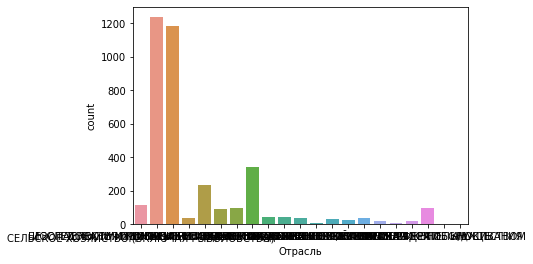

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Отрасль" , data  = dfcom)

In [ ]:
len(dfcom['Подотрасль'].unique())

124

In [ ]:
dfcom['Технология_(1_уровень)'].unique()


array(['Синтез материальных объектов', 'Синтез информации',
       'Обработка и преобразование информации',
       'Сбор информации об объекте', 'Преобразование и хранение энергии',
       'н/д'], dtype=object)

In [ ]:
dfcom['Технология_(2_уровень)'].unique()

array(['Синтез живых организмов и систем', 'Искусственный интеллект',
       'Новые производственные процессы',
       'Обработка и хранение больших данных', 'Синтез контента',
       'Инженерные комплексы', 'Физико-химические методы',
       'Моделирование процессов реального мира (цифровые двойники)',
       'Технологии переработки сырья и отходов включая комплексные экологические проекты',
       'Материалы с новыми свойствами', 'Передача данных',
       'Средства проектирования', 'Ядерные технологии',
       'Интеллектуальные системы управления',
       'Технологии цифровой безопасности', 'Средства разработки',
       'Исследования на живых моделях', 'Методы биоорганической химии',
       'Нейроинтерфейсы',
       'Технологии передачи, распределения и преобразования электроэнергии',
       'Технологии накопления и системы хранения энергии',
       'Технологии распределенного реестра',
       'Технологии генерации электроэнергии',
       'Технологии синтеза графической информации, в

In [ ]:
dfcom['Технология_(3_уровень)'].unique()

array(['Технологии селекции растений',
       'Обработка естественных языков (перевод, классификация, кластеризация и другое)',
       'Технологии сварки и пайки', 'Интерфейсы обмена большими данными',
       'Синтез образовательного контента',
       'Статистическая обработка данных',
       'Системы промышленной безопасности',
       'Регистрация и преобразование акустических сигналов',
       'Моделирование химических процессов',
       'Системы медицинской диагностики, лечения и реабилитации, включая телемедицинские системы',
       'Технологии переработки неорганического сырья и отходов',
       'Процессы органического синтеза',
       'Новые технологии сепарации веществ и фракций, включая газо- и водоочистку',
       'Интегральные фотонные схемы',
       'Совершенствование каталитических процессов',
       'Создание новых структур',
       'Регистрация и преобразование оптических сигналов',
       'Создание новых веществ',
       'Машинное обучение включая глубокое обучение и пре

In [ ]:
len(dfcom['Технология_(3_уровень)'].unique())

205

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfcom.Отрасль.value_counts()

ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ                            1237
ПРОМЫШЛЕННОСТЬ                                         1182
ЗДРАВООХРАНЕНИЕ                                         345
ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРОВАНИЕ     237
СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО)                117
ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ                                      99
ЭНЕРГЕТИКА                                               96
ДОБЫЧА ПОЛЕЗНЫХ ИСКОПАЕМЫХ                               90
ПРОФЕССИОНАЛЬНАЯ ДЕЯТЕЛЬНОСТЬ ПРОЧАЯ                     46
ОБРАЗОВАНИЕ                                              42
БЕЗОПАСНОСТЬ И КОНТРОЛЬНО-НАДЗОРНАЯ ДЕЯТЕЛЬНОСТЬ         39
ТРАНСПОРТ, ХРАНЕНИЕ И ЛОГИСТИКА                          38
СТРОИТЕЛЬСТВО                                            35
ФИНАНСОВЫЙ СЕКТОР                                        32
ЖКХ                                                      23
ТОРГОВЛЯ                                                 21
СПОРТ, ТУРИЗМ И СФЕРА ОБСЛУЖИВАНИЯ      

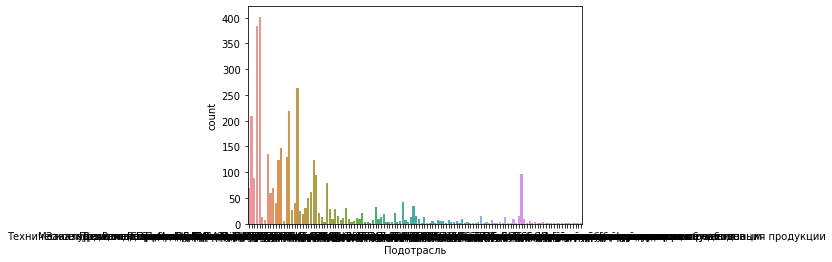

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Подотрасль" , data  = dfcom)

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfcom.Подотрасль.value_counts().head(59)

Специализированные информационные системы                                                   402
Разработка аппаратно-программных комплексов                                                 384
Производство электронного и электрического оборудования                                     264
Машиностроение                                                                              219
Деятельность по созданию новых информационных технологий                                    209
Производство новых материалов                                                               148
Инженерно-техническое проектирование                                                        136
Рекомендательные системы, персональные помощники и агрегаторы                               129
Химическая промышленность                                                                   124
Производство медицинских инструментов и оборудования для терапии и реабилитации             124
Прочие услуги                           

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfcom.Подотрасль.value_counts().tail(59)

Инженерные изыскания и картография                                                              6
Инфраструктура для воздушных перевозок                                                          5
Атомная энергетика                                                                              5
Строительство автомобильных и железных дорог                                                    5
Предоставление услуг в сфере культурно-развлекательного досуга                                  5
Перемещение и экспедирование грузов, другие логистические услуги                                4
Деятельность в области спорта                                                                   4
Гидрометеорология                                                                               4
Курьерская доставка                                                                             4
Производство кокса и нефтепродуктов                                                             4
Торговля розничная в

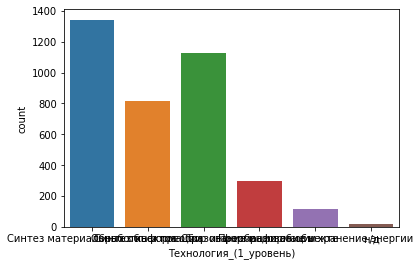

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Технология_(1_уровень)" , data  = dfcom)

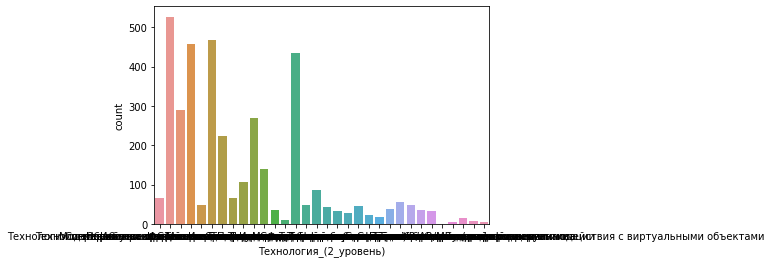

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Технология_(2_уровень)" , data  = dfcom)

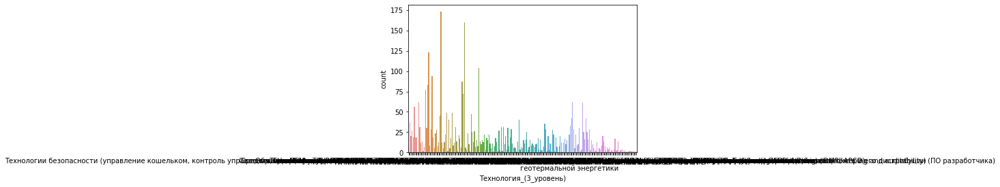

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Технология_(3_уровень)" , data  = dfcom)

In [ ]:
xlprod = pd.ExcelFile('2. Продукты_new.xlsx')

In [ ]:
print(xlprod.sheet_names)

['Sheet0']


In [ ]:
dfprod = xlprod.parse('Sheet0')

In [ ]:
dfprod.columns = dfprod.iloc[0]
dfprod = dfprod.iloc[1:]


In [ ]:
dfprod.columns = dfprod.columns.str.replace(" ", "_")
dfprod

,global_id_(продукта),Компания,Рыночное_наименование_продукта_,Раздел_(ОКПД_2),Класс_(ОКПД_2),Подкласс_(ОКПД_2),Группа_(ОКПД_2),Подгруппа_(ОКПД_2),Вид_(ОКПД_2),Категория_(ОКПД_2),Подкатегория_(ОКПД_2),Описание_продукта_(с_указанием_конкретных_характеристик)
1,812463,811059,-,Раздел B. Продукция горнодобывающих производств,09. Услуги в области добычи полезных ископаемых,09.9. Услуги в горнодобывающем производстве пр...,09.90. Услуги в горнодобывающем производстве п...,09.90.1. Услуги в горнодобывающем производстве...,09.90.19. Услуги в горнодобывающем производств...,09.90.19.100. Услуги по добыче и первичному об...,Отсутствует,Конечным продуктом проекта является роторная у...
2,812474,811423,-,"Раздел M. Услуги, связанные с научной, инженер...","72. Услуги и работы, связанные с научными иссл...","72.1. Услуги, связанные с научными исследовани...","72.19. Услуги, связанные с научными исследован...","72.19.2. Услуги, связанные с научными исследов...","72.19.21. Услуги, связанные с научными исследо...","72.19.21.000. Услуги, связанные с научными исс...",Отсутствует,Проект предполагает создание методик и фреймво...
3,812477,811310,StreamMyData,"Раздел M. Услуги, связанные с научной, инженер...",73. Услуги рекламные и услуги по исследованию ...,73.1. Услуги рекламные,"73.11. Услуги, предоставляемые рекламными аген...","73.11.1. Услуги, предоставляемые рекламными аг...",73.11.11. Набор рекламных услуг полный,73.11.11.000. Набор рекламных услуг полный,Отсутствует,"Цифровая онлайн-платформа «StreamMyData», кото..."
4,812480,811499,-,"Раздел M. Услуги, связанные с научной, инженер...","72. Услуги и работы, связанные с научными иссл...","72.1. Услуги, связанные с научными исследовани...","72.19. Услуги, связанные с научными исследован...","72.19.1. Услуги, связанные с научными исследов...","72.19.12. Услуги, связанные с научными исследо...","72.19.12.000. Услуги, связанные с научными исс...",Отсутствует,"Решение, разработанное в рамках концепции един..."
5,812481,811524,eDPROStUdy,"Раздел M. Услуги, связанные с научной, инженер...","72. Услуги и работы, связанные с научными иссл...","72.1. Услуги, связанные с научными исследовани...","72.19. Услуги, связанные с научными исследован...","72.19.1. Услуги, связанные с научными исследов...","72.19.11. Услуги, связанные с научными исследо...","72.19.11.000. Услуги, связанные с научными исс...",Отсутствует,Технология для глубокой профориентации и опред...
...,...,...,...,...,...,...,...,...,...,...,...,...
6890,1130155,1126818,"Комплекс суточного мониторивания ""Медиком-комб...",Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...","26.6. Оборудование для облучения, электрическо...","26.60. Оборудование для облучения, электрическ...","26.60.1. Оборудование и приборы для облучения,...","26.60.12. Аппараты электродиагностические, при...",26.60.12.120. Аппараты для функциональных диаг...,26.60.12.129. Приборы и аппараты для функциона...,«Комплекс суточного мониторирования ЭКГ и АД «...
6891,1130156,1126827,Программное обеспечение для проектирования и и...,"Раздел M. Услуги, связанные с научной, инженер...","72. Услуги и работы, связанные с научными иссл...","72.1. Услуги, связанные с научными исследовани...","72.19. Услуги, связанные с научными исследован...",72.19.5. Работы оригинальные научных исследова...,72.19.50. Работы оригинальные научных исследов...,72.19.50.000. Работы оригинальные научных иссл...,Отсутствует,Программная составляющая комплекса предназначе...
6892,1130157,1126836,Комплекс средств дистанционной диагностики эле...,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,"63.1. Услуги по обработке данных, размещению и...","63.11. Услуги по обработке данных, размещению ...",63.11.2. Услуги по передаче потокового видео и...,63.11.21. Услуги по передаче потокового видео,63.11.21.000. Услуги по передаче потокового видео,Отсутствует,Инновационный продукт предназначен для монитор...
6893,1130158,112684

In [ ]:
dfprod.describe(include=[object])  

,global_id_(продукта),Компания,Рыночное_наименование_продукта_,Раздел_(ОКПД_2),Класс_(ОКПД_2),Подкласс_(ОКПД_2),Группа_(ОКПД_2),Подгруппа_(ОКПД_2),Вид_(ОКПД_2),Категория_(ОКПД_2),Подкатегория_(ОКПД_2),Описание_продукта_(с_указанием_конкретных_характеристик)
count,6894,6894,6894,6894,6894,6894,6894,6894,6893,6784,6633,6894
unique,6894,3744,3608,20,80,200,309,510,721,899,188,3655
top,812463,1064163,-,Раздел C. Продукция обрабатывающих производств,62. Продукты программные и услуги по разработк...,62.0. Продукты программные и услуги по разрабо...,62.01. Продукты программные и услуги по разраб...,62.01.2. Оригиналы программного обеспечения,62.01.29. Оригиналы программного обеспечения п...,62.01.29.000. Оригиналы программного обеспечен...,Отсутствует,Предлагаемый продукт представляет из себя прог...
freq,1,12,140,2735,1383,1383,1266,645,639,639,5997,20


In [ ]:
bt3 = dfprod['Компания'].value_counts()
dfprod[dfprod['Компания'].isin(bt3[bt3 >= 2].index)].sort_values(['Компания'])

,global_id_(продукта),Компания,Рыночное_наименование_продукта_,Раздел_(ОКПД_2),Класс_(ОКПД_2),Подкласс_(ОКПД_2),Группа_(ОКПД_2),Подгруппа_(ОКПД_2),Вид_(ОКПД_2),Категория_(ОКПД_2),Подкатегория_(ОКПД_2),Описание_продукта_(с_указанием_конкретных_характеристик)
3698,1106269,1011430,К5201ТК015,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.1. Компоненты электронные и платы,26.11. Компоненты электронные,26.11.3. Схемы интегральные электронные,26.11.30. Схемы интегральные электронные,26.11.30.000. Схемы интегральные электронные,Отсутствует,К5201ТК015 - микросхема предназначена для созд...
3719,1106293,1011430,Корпусирование микросхем и микромодулей на за...,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.1. Компоненты электронные и платы,26.11. Компоненты электронные,"26.11.9. Услуги, связанные с производством эле...","26.11.91. Услуги, связанные с производством эл...",NaN,NaN,Корпусирование микросхем и микромодулей (3D сб...
3730,1106305,1011430,Контрактное производство изделий микроэлектроники,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.1. Компоненты электронные и платы,26.11. Компоненты электронные,"26.11.9. Услуги, связанные с производством эле...","26.11.91. Услуги, связанные с производством эл...",NaN,NaN,Производство изделий микроэлектроники на заказ...
3734,1106309,1011430,HEMT–транзисторы по технологии GaN,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.1. Компоненты электронные и платы,26.11. Компоненты электронные,26.11.2. Диоды и транзисторы,"26.11.21. Диоды; транзисторы; тиристоры, диаки...",26.11.21.120. Транзисторы,Отсутствует,Перспективное направление Технология GaN(Si)\n...
3755,1106332,1011430,Контрактная сборка РЭА,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.1. Компоненты электронные и платы,26.11. Компоненты электронные,"26.11.9. Услуги, связанные с производством эле...","26.11.91. Услуги, связанные с производством эл...",NaN,NaN,Контрактная сборка электронных модулей и радио...
...,...,...,...,...,...,...,...,...,...,...,...,...
3820,1126839,1126836,Комплекс средств дистанционной диагностики эле...,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,"63.1. Услуги по обработке данных, размещению и...","63.11. Услуги по обработке данных, размещению ...",63.11.2. Услуги по передаче потокового видео и...,63.11.21. Услуги по передаче потокового видео,63.11.21.000. Услуги по передаче потокового видео,Отсутствует,Инновационный продукт предназначен для монитор...
6893,1130158,1126846,"Фарватер-К3Х, Фарватер-K3X-mini, Фарватер КЗМ","Раздел M. Услуги, связанные с научной, инженер...","72. Услуги и работы, связанные с научными иссл...","72.1. Услуги, связанные с научными исследовани...","72.19. Услуги, связанные с научными исследован...","72.19.2. Услуги, связанные с научными исследов...","72.19.29. Услуги, связанные с научными исследо...","72.19.29.190. Услуги (работы), связанные с нау...",Отсутствует,Система высокоточного позиционирования и ориен...
3821,1126849,1126846,"Фарватер-К3Х, Фарватер-K3X-mini, Фарватер КЗМ","Раздел M. Услуги, связанные с научной, инженер...","72. Услуги и работы, связанные с научными иссл...","72.1. Услуги, связанные с научными исследовани...","72.19. Услуги, связанные с научными исследован...","72.19.2. Услуги, связанные с научными исследов...","72.19.29. Услуги, связанные с научными исследо...","72.19.29.190. Услуги (работы), связанные с нау...",Отсутствует,Система высокоточного позиционирования и ориен...
3822,1126859,1126856,?,Раздел C. Продукция обрабатывающих производств,20. Вещества химические и продукты химические,20.5. Продукты химические прочие,"20.59. Продукты химические прочие, не включенн...",20.59.5. Продукты химические прочие,"20.59.52. Пасты для лепки, зуботехническ

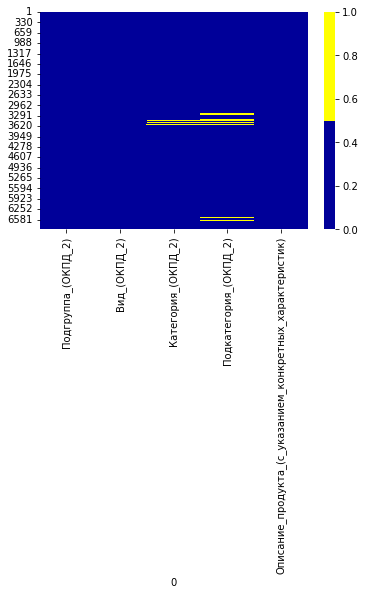

In [ ]:
cols = dfprod.columns[7:12] # первые 
# определяем цвета 
# желтый - пропущенные данные, синий - не пропущенные
colours = ['#000099', '#ffff00'] 
sns.heatmap(dfprod[cols].isnull(), cmap=sns.color_palette(colours))

In [ ]:
dfprod[dfprod['Вид_(ОКПД_2)'].isna()]

,global_id_(продукта),Компания,Рыночное_наименование_продукта_,Раздел_(ОКПД_2),Класс_(ОКПД_2),Подкласс_(ОКПД_2),Группа_(ОКПД_2),Подгруппа_(ОКПД_2),Вид_(ОКПД_2),Категория_(ОКПД_2),Подкатегория_(ОКПД_2),Описание_продукта_(с_указанием_конкретных_характеристик)
3508,1106062,1011589,Услуги по проведению ПЦР-исследований,Раздел Q. Услуги в области здравоохранения и с...,86. Услуги в области здравоохранения,86.2. Услуги в области медицинской и стоматоло...,86.22. Услуги в области специализированной вра...,86.22.1. Услуги в области специализированной в...,NaN,86.22.11.000. Услуги по проведению и расшифров...,NaN,Услуги по проведению ПЦР-исследований.


In [ ]:
dfprod[dfprod['Категория_(ОКПД_2)'].isna()]

,global_id_(продукта),Компания,Рыночное_наименование_продукта_,Раздел_(ОКПД_2),Класс_(ОКПД_2),Подкласс_(ОКПД_2),Группа_(ОКПД_2),Подгруппа_(ОКПД_2),Вид_(ОКПД_2),Категория_(ОКПД_2),Подкатегория_(ОКПД_2),Описание_продукта_(с_указанием_конкретных_характеристик)
3457,1063508,1063505,Электронный детектор для терагерцового диапазона,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.1. Компоненты электронные и платы,26.11. Компоненты электронные,26.11.2. Диоды и транзисторы,"26.11.21. Диоды; транзисторы; тиристоры, диаки...",NaN,NaN,Электронные детекторы сигналов со сверхвысокой...
3458,1063528,1063525,Установка для измерения объёмной активности ра...,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...","26.5. Оборудование для измерения, испытаний и ...","26.51. Оборудование для измерения, испытаний и...",26.51.4. Приборы для измерения электрических в...,26.51.41. Приборы и аппаратура для измерения и...,NaN,NaN,Установка для измерения объёмной активности ра...
3464,1063622,1063619,Поршень ДВС,Раздел G. Услуги по оптовой и розничной торгов...,45. Услуги по оптовой и розничной торговле и у...,45.1. Услуги по торговле автотранспортными сре...,45.11. Услуги по торговле легковыми автомобиля...,45.11.2. Услуги по розничной торговле легковым...,45.11.23. Услуги по розничной торговле новыми ...,NaN,NaN,Разработка поршней ДВС из высокопрочного алюми...
3465,1063637,1063634,"Подводный робототехнический комплекс ""ПРОМЕТЕЙ""",Раздел F. Сооружения и строительные работы,42. Сооружения и строительные работы в области...,42.9. Сооружения и строительные работы по стро...,42.91. Сооружения водные; работы строительные ...,42.91.2. Работы строительные по строительству ...,42.91.20. Работы строительные по строительству...,NaN,NaN,Решение представляет собой телеуправляемый нео...
3466,1063655,1063652,Uma,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,63.9. Услуги информационные прочие,"63.99. Услуги информационные прочие, не включе...","63.99.1. Услуги информационные прочие, не вклю...","63.99.10. Услуги информационные прочие, не вкл...",NaN,NaN,"Проект направлен на внедрение, развитие и масш..."
...,...,...,...,...,...,...,...,...,...,...,...,...
6782,1130047,1063619,Поршень ДВС,Раздел G. Услуги по оптовой и розничной торгов...,45. Услуги по оптовой и розничной торговле и у...,45.1. Услуги по торговле автотранспортными сре...,45.11. Услуги по торговле легковыми автомобиля...,45.11.2. Услуги по розничной торговле легковым...,45.11.23. Услуги по розничной торговле новыми ...,NaN,NaN,Разработка поршней ДВС из высокопрочного алюми...
6783,1130048,1063634,"Подводный робототехнический комплекс ""ПРОМЕТЕЙ""",Раздел F. Сооружения и строительные работы,42. Сооружения и строительные работы в области...,42.9. Сооружения и строительные работы по стро...,42.91. Сооружения водные; работы строительные ...,42.91.2. Работы строительные по строительству ...,42.91.20. Работы строительные по строительству...,NaN,NaN,Решение представляет собой телеуправляемый нео...
6784,1130049,1063652,Uma,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,63.9. Услуги информационные прочие,"63.99. Услуги информационные прочие, не включе...","63.99.1. Услуги информационные прочие, не вклю...","63.99.10. Услуги информационные прочие, не вкл...",NaN,NaN,"Проект направлен на внедрение, развитие и масш..."
6827,1130092,1064409,Прокладки ГБЦ,Раздел C. Продукция обрабатывающих производств,"29. Средства автотранспортные, прицепы и полуп...",29.3. Части и принадлежности для автотранспорт...,29.32. Комплектующие и принадлежности для авто...,29.32.3. Комплектующие и принадлежности для ав...,29.32.30. Комплектующие и принадлежности для а...,NaN,NaN,"Прокладки ГБЦ, изготовленные из отечественного..."


In [ ]:
dfprod[dfprod['Подкатегория_(ОКПД_2)'].isna()]

,global_id_(продукта),Компания,Рыночное_наименование_продукта_,Раздел_(ОКПД_2),Класс_(ОКПД_2),Подкласс_(ОКПД_2),Группа_(ОКПД_2),Подгруппа_(ОКПД_2),Вид_(ОКПД_2),Категория_(ОКПД_2),Подкатегория_(ОКПД_2),Описание_продукта_(с_указанием_конкретных_характеристик)
3174,1059091,1059088,Pampadu 2.0,Раздел K. Услуги финансовые и страховые,"66. Услуги вспомогательные, связанные с услуга...",66.2. Услуги вспомогательные в сфере страхован...,66.22. Услуги страховых агентов и брокеров,66.22.1. Услуги страховых агентов и брокеров,66.22.10. Услуги страховых агентов и брокеров,66.22.10.000. Услуги страховых агентов и брокеров,NaN,Pampadu 2.0 - инновационнsq InsurTech сервис д...
3179,1059159,1059156,Газогидрат,Раздел I. Услуги гостиничного хозяйства и обще...,56. Услуги общественного питания,56.3. Услуги по подаче напитков,56.30. Услуги по подаче напитков,56.30.1. Услуги по подаче напитков,56.30.10. Услуги по подаче напитков,56.30.10.190. Услуги прочих заведений по прода...,NaN,Газовый гидрат – это особое соединение воды и ...
3181,1059188,1059185,Разработка отечественной комплексной автоматиз...,Раздел J. Услуги в области информации и связи,58. Услуги издательские,58.2. Услуги по изданию программного обеспечения,58.29. Услуги по изданию прочего программного ...,58.29.5. Услуги по предоставлению лицензий на ...,58.29.50. Услуги по предоставлению лицензий на...,58.29.50.000. Услуги по предоставлению лицензи...,NaN,В рамках проекта разрабатывается автоматизиров...
3188,1059298,1059295,робототехнический комплекс автоматизированное ...,Раздел C. Продукция обрабатывающих производств,"28. Машины и оборудование, не включенные в дру...",28.9. Оборудование специального назначения прочее,28.92. Оборудование для добычи полезных ископа...,28.92.3. Машины для выемки грунта и строительс...,28.92.30. Машины для выемки грунта и строитель...,28.92.30.140. Машины несамоходные для перемеще...,NaN,"Максимальная глубина погружения, не менее 100 ..."
3189,1059311,1059308,Satelliter™,"Раздел A. Продукция сельского, лесного и рыбно...",01. Продукция и услуги сельского хозяйства и о...,01.6. Услуги в области растениеводства и живот...,"01.61. Услуги, связанные с выращиванием сельск...","01.61.1. Услуги, связанные с выращиванием сель...","01.61.10. Услуги, связанные с выращиванием сел...",01.61.10.130. Услуги по опрыскиванию сельскохо...,NaN,Программа Satelliter™ является программным ком...
...,...,...,...,...,...,...,...,...,...,...,...,...
6827,1130092,1064409,Прокладки ГБЦ,Раздел C. Продукция обрабатывающих производств,"29. Средства автотранспортные, прицепы и полуп...",29.3. Части и принадлежности для автотранспорт...,29.32. Комплектующие и принадлежности для авто...,29.32.3. Комплектующие и принадлежности для ав...,29.32.30. Комплектующие и принадлежности для а...,NaN,NaN,"Прокладки ГБЦ, изготовленные из отечественного..."
6836,1130101,1126241,Satelliter™,"Раздел A. Продукция сельского, лесного и рыбно...",01. Продукция и услуги сельского хозяйства и о...,01.6. Услуги в области растениеводства и живот...,"01.61. Услуги, связанные с выращиванием сельск...","01.61.1. Услуги, связанные с выращиванием сель...","01.61.10. Услуги, связанные с выращиванием сел...",01.61.10.130. Услуги по опрыскиванию сельскохо...,NaN,Растениеводство
6859,1130124,1126482,Спринклерные оросители с управляемым пуском и ...,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.3. Оборудование коммуникационное,26.30. Оборудование коммуникационное,26.30.5. Устройства охранной или пожарной сигн...,26.30.50. Устройства охранной или пожарной сиг...,26.30.50.120. Приборы и аппаратура для систем ...,NaN,"Строительство зданий,Строительство инженерных ..."
6860,1130125,1126482,Инновационная система пожаротушения тонкораспы...,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.3. Оборудование коммуникационное,26.30. Оборудование коммуникационное,26.30.5. Устройства охранной или пожарной сигн...,26.30.50. 

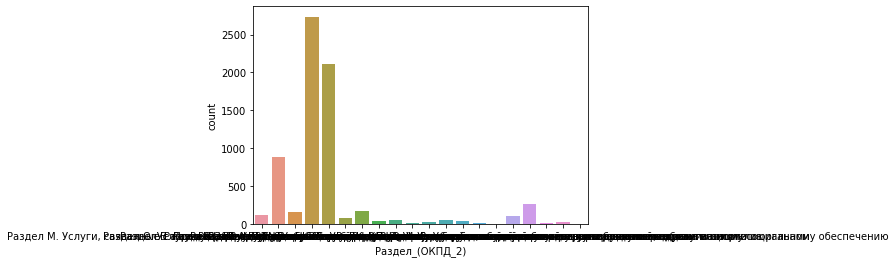

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Раздел_(ОКПД_2)" , data  = dfprod)

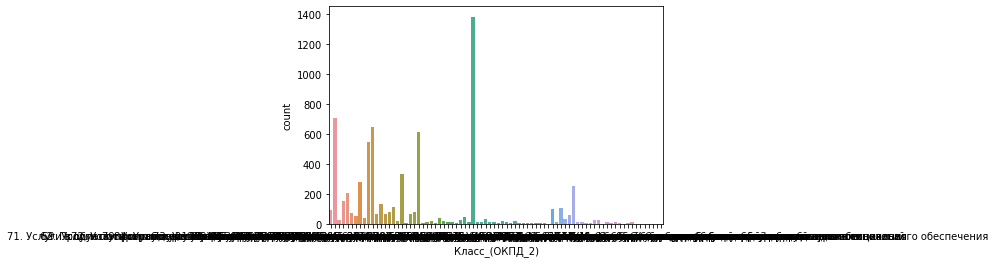

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Класс_(ОКПД_2)" , data  = dfprod)

In [ ]:
dfprod[dfprod['Подкатегория_(ОКПД_2)'].isna()]

,global_id_(продукта),Компания,Рыночное_наименование_продукта_,Раздел_(ОКПД_2),Класс_(ОКПД_2),Подкласс_(ОКПД_2),Группа_(ОКПД_2),Подгруппа_(ОКПД_2),Вид_(ОКПД_2),Категория_(ОКПД_2),Подкатегория_(ОКПД_2),Описание_продукта_(с_указанием_конкретных_характеристик)
3174,1059091,1059088,Pampadu 2.0,Раздел K. Услуги финансовые и страховые,"66. Услуги вспомогательные, связанные с услуга...",66.2. Услуги вспомогательные в сфере страхован...,66.22. Услуги страховых агентов и брокеров,66.22.1. Услуги страховых агентов и брокеров,66.22.10. Услуги страховых агентов и брокеров,66.22.10.000. Услуги страховых агентов и брокеров,NaN,Pampadu 2.0 - инновационнsq InsurTech сервис д...
3179,1059159,1059156,Газогидрат,Раздел I. Услуги гостиничного хозяйства и обще...,56. Услуги общественного питания,56.3. Услуги по подаче напитков,56.30. Услуги по подаче напитков,56.30.1. Услуги по подаче напитков,56.30.10. Услуги по подаче напитков,56.30.10.190. Услуги прочих заведений по прода...,NaN,Газовый гидрат – это особое соединение воды и ...
3181,1059188,1059185,Разработка отечественной комплексной автоматиз...,Раздел J. Услуги в области информации и связи,58. Услуги издательские,58.2. Услуги по изданию программного обеспечения,58.29. Услуги по изданию прочего программного ...,58.29.5. Услуги по предоставлению лицензий на ...,58.29.50. Услуги по предоставлению лицензий на...,58.29.50.000. Услуги по предоставлению лицензи...,NaN,В рамках проекта разрабатывается автоматизиров...
3188,1059298,1059295,робототехнический комплекс автоматизированное ...,Раздел C. Продукция обрабатывающих производств,"28. Машины и оборудование, не включенные в дру...",28.9. Оборудование специального назначения прочее,28.92. Оборудование для добычи полезных ископа...,28.92.3. Машины для выемки грунта и строительс...,28.92.30. Машины для выемки грунта и строитель...,28.92.30.140. Машины несамоходные для перемеще...,NaN,"Максимальная глубина погружения, не менее 100 ..."
3189,1059311,1059308,Satelliter™,"Раздел A. Продукция сельского, лесного и рыбно...",01. Продукция и услуги сельского хозяйства и о...,01.6. Услуги в области растениеводства и живот...,"01.61. Услуги, связанные с выращиванием сельск...","01.61.1. Услуги, связанные с выращиванием сель...","01.61.10. Услуги, связанные с выращиванием сел...",01.61.10.130. Услуги по опрыскиванию сельскохо...,NaN,Программа Satelliter™ является программным ком...
...,...,...,...,...,...,...,...,...,...,...,...,...
6827,1130092,1064409,Прокладки ГБЦ,Раздел C. Продукция обрабатывающих производств,"29. Средства автотранспортные, прицепы и полуп...",29.3. Части и принадлежности для автотранспорт...,29.32. Комплектующие и принадлежности для авто...,29.32.3. Комплектующие и принадлежности для ав...,29.32.30. Комплектующие и принадлежности для а...,NaN,NaN,"Прокладки ГБЦ, изготовленные из отечественного..."
6836,1130101,1126241,Satelliter™,"Раздел A. Продукция сельского, лесного и рыбно...",01. Продукция и услуги сельского хозяйства и о...,01.6. Услуги в области растениеводства и живот...,"01.61. Услуги, связанные с выращиванием сельск...","01.61.1. Услуги, связанные с выращиванием сель...","01.61.10. Услуги, связанные с выращиванием сел...",01.61.10.130. Услуги по опрыскиванию сельскохо...,NaN,Растениеводство
6859,1130124,1126482,Спринклерные оросители с управляемым пуском и ...,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.3. Оборудование коммуникационное,26.30. Оборудование коммуникационное,26.30.5. Устройства охранной или пожарной сигн...,26.30.50. Устройства охранной или пожарной сиг...,26.30.50.120. Приборы и аппаратура для систем ...,NaN,"Строительство зданий,Строительство инженерных ..."
6860,1130125,1126482,Инновационная система пожаротушения тонкораспы...,Раздел C. Продукция обрабатывающих производств,"26. Оборудование компьютерное, электронное и о...",26.3. Оборудование коммуникационное,26.30. Оборудование коммуникационное,26.30.5. Устройства охранной или пожарной сигн...,26.30.50. 

In [ ]:
xlotr = pd.ExcelFile('3. Отрасли.xlsx')

In [ ]:
print(xlprod.sheet_names)

['Sheet0']


In [ ]:
dfotr = xlotr.parse('Sheet0')

In [ ]:
dfotr

,global_id,Создаваемые продукты,Отрасль,Подотрасль
0,830782,830283,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Животноводство
1,830783,830728,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Растениеводство
2,830784,812492,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Растениеводство
3,830785,830618,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Растениеводство
4,830786,830560,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Животноводство
...,...,...,...,...
10581,1114226,1106327,ПРОФЕССИОНАЛЬНАЯ ДЕЯТЕЛЬНОСТЬ ПРОЧАЯ,Прочие профессиональные услуги
10582,1114227,1106329,ПРОМЫШЛЕННОСТЬ,Производство новых материалов
10583,1114228,1106330,ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРО...,Прототипирование
10584,1114229,1106331,ЗДРАВООХРАНЕНИЕ,Производство медицинских изделий для диагности...


In [ ]:
dfotr.describe(include=[object])  

,Отрасль,Подотрасль
count,10586,10586
unique,20,147
top,ПРОМЫШЛЕННОСТЬ,Прочие услуги
freq,3133,653


In [ ]:
dfotr[(dfotr.Подотрасль=="Прочие услуги")]

,global_id,Создаваемые продукты,Отрасль,Подотрасль
589,831569,813131,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
1002,832179,830553,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
1003,832181,830485,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
1191,832436,830655,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
1193,832439,813206,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
...,...,...,...,...
10082,1064332,1064273,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
10087,1064337,1064273,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
10112,1064362,1064273,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги
10113,1064363,1064273,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги


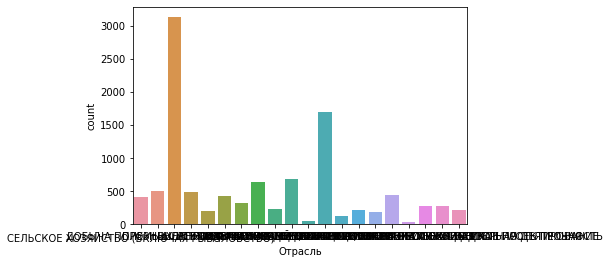

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Отрасль" , data  = dfotr)

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfotr.Отрасль.value_counts()

ПРОМЫШЛЕННОСТЬ                                         3133
ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ                            1701
ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ                                     678
ЗДРАВООХРАНЕНИЕ                                         647
ДОБЫЧА ПОЛЕЗНЫХ ИСКОПАЕМЫХ                              503
ЭНЕРГЕТИКА                                              486
ТРАНСПОРТ, ХРАНЕНИЕ И ЛОГИСТИКА                         449
СТРОИТЕЛЬСТВО                                           432
СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО)                418
ОБРАЗОВАНИЕ                                             329
ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРОВАНИЕ     278
БЕЗОПАСНОСТЬ И КОНТРОЛЬНО-НАДЗОРНАЯ ДЕЯТЕЛЬНОСТЬ        270
ФИНАНСОВЫЙ СЕКТОР                                       231
ТОРГОВЛЯ                                                214
ПРОФЕССИОНАЛЬНАЯ ДЕЯТЕЛЬНОСТЬ ПРОЧАЯ                    211
ЖКХ                                                     208
СПОРТ, ТУРИЗМ И СФЕРА ОБСЛУЖИВАНИЯ      

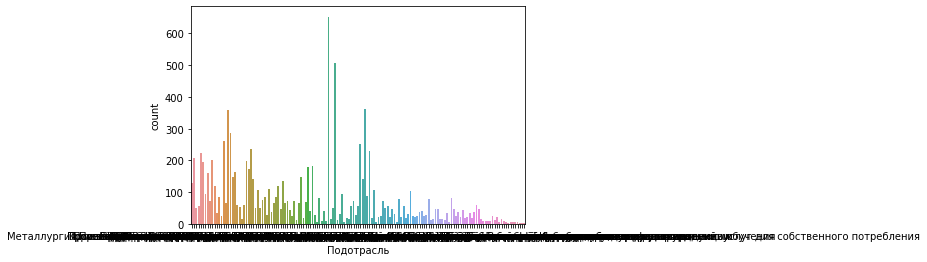

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Подотрасль" , data  = dfotr)

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfotr.Подотрасль.value_counts().head(50)

Прочие услуги                                                                      653
Специализированные информационные системы                                          506
Разработка аппаратно-программных комплексов                                        361
Машиностроение                                                                     358
Производство электронного и электрического оборудования                            287
Металлургия, металлопродукция, производство готовых металлических изделий          260
Рекомендательные системы, персональные помощники и агрегаторы                      252
Химическая промышленность                                                          237
Деятельность по созданию новых информационных технологий                           230
Добыча нефти и природного газа                                                     224
Растениеводство                                                                    206
Автомобильная промышленность               

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfotr.Подотрасль.value_counts().tail(50)

Обеспечение безопасности в чрезвычайных ситуациях                                                                                          24
Создание социальных сетей                                                                                                                  23
Аудит, бухгалтерский учет, налоговое консультирование                                                                                      22
Предоставление услуг в сфере культурно-развлекательного досуга                                                                             21
Разработка и развитие компьютерных и мобильных игр                                                                                         21
Инфраструктура для водного транспорта                                                                                                      21
Техническое регулирование, стандартизация, метрология, аккредитация, каталогизация продукции                                               20
Курьер

In [ ]:
xltech = pd.ExcelFile('4. Технологии.xlsx')

In [ ]:
print(xltech.sheet_names)

['Sheet0']


In [ ]:
dftech = xltech.parse('Sheet0')

In [ ]:
dftech

,global_id,Создаваемые продукты,Технология (1 уровень),Технология (2 уровень),Технология (3 уровень)
0,832680,830397,Сбор информации об объекте,Методы биоорганической химии,Иммунологические методы
1,832682,812554,Сбор информации об объекте,Методы биоорганической химии,Технологии секвенирования ДНК и РНК
2,832684,813256,Сбор информации об объекте,Методы биоорганической химии,Технологии секвенирования ДНК и РНК
3,832687,830563,Сбор информации об объекте,Методы биоорганической химии,Технологии секвенирования ДНК и РНК
4,832688,830560,Сбор информации об объекте,Исследования на живых моделях,Исследования на живых организмах при экстремал...
...,...,...,...,...,...
4756,1065426,838945,Синтез информации,Искусственный интеллект,Технологии поиска и оптимизации
4757,1065427,838948,Синтез материальных объектов,Инженерные комплексы,Робототехнические решения
4758,1065428,838948,Синтез информации,Искусственный интеллект,Машинное обучение включая глубокое обучение и ...
4759,1065429,838949,Синтез информации,Синтез контента,Синтез образовательного контента


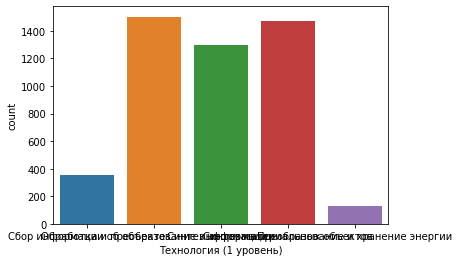

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Технология (1 уровень)" , data  = dftech)

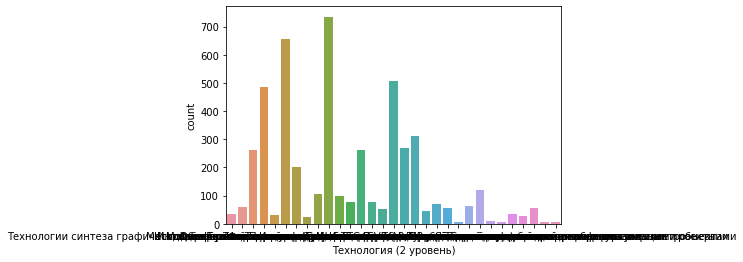

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Технология (2 уровень)" , data  = dftech)

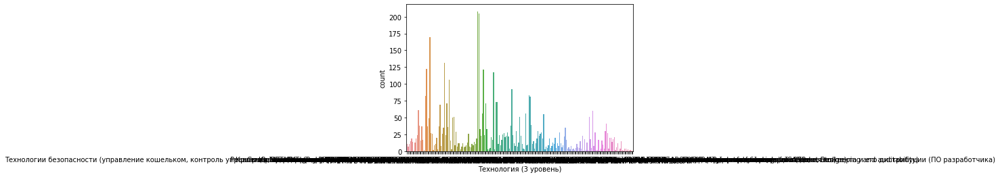

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Технология (3 уровень)" , data  = dftech)

In [ ]:
xlsprotr = pd.ExcelFile('Справочник. Отрасли и подотрасли.xlsx')

In [ ]:
print(xlsprotr.sheet_names)


['2022.04.19. Справочник отраслей']


In [ ]:
dfsprotr = xlsprotr.parse('2022.04.19. Справочник отраслей')

In [ ]:
dfsprotr.columns = dfsprotr.iloc[0]
dfsprotr = dfsprotr.iloc[1:]
dfsprotr

,Отрасль,Наименование подотрасли
1,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Животноводство
2,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Растениеводство
3,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Рыболовство и рыбоводство
4,СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Лесоводство и лесозаготовка
5,ДОБЫЧА ПОЛЕЗНЫХ ИСКОПАЕМЫХ,Добыча угля
...,...,...
145,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Деятельность домашних хозяйств с наемными рабо...
146,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,"Предоставление прочих персональных услуг, не в..."
147,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Деятельность недифференцированная частных дома...
148,ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ,Прочие услуги


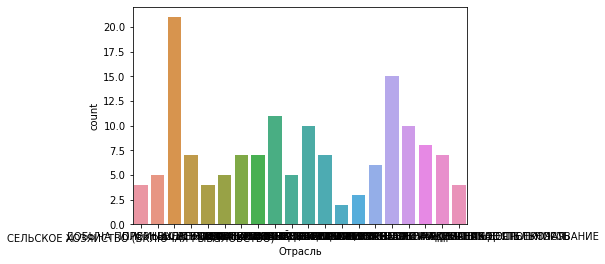

In [ ]:
# Сводка по распределению данных графическое(визуальное)
warnings.simplefilter('ignore')
sns.countplot(x = "Отрасль" , data  = dfsprotr)

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfcom.Отрасль.value_counts().head(50)

ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ                            1237
ПРОМЫШЛЕННОСТЬ                                         1182
ЗДРАВООХРАНЕНИЕ                                         345
ИССЛЕДОВАНИЯ И ИНЖЕНЕРНО-ТЕХНИЧЕСКОЕ ПРОЕКТИРОВАНИЕ     237
СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО)                117
ПРОЧАЯ ДЕЯТЕЛЬНОСТЬ                                      99
ЭНЕРГЕТИКА                                               96
ДОБЫЧА ПОЛЕЗНЫХ ИСКОПАЕМЫХ                               90
ПРОФЕССИОНАЛЬНАЯ ДЕЯТЕЛЬНОСТЬ ПРОЧАЯ                     46
ОБРАЗОВАНИЕ                                              42
БЕЗОПАСНОСТЬ И КОНТРОЛЬНО-НАДЗОРНАЯ ДЕЯТЕЛЬНОСТЬ         39
ТРАНСПОРТ, ХРАНЕНИЕ И ЛОГИСТИКА                          38
СТРОИТЕЛЬСТВО                                            35
ФИНАНСОВЫЙ СЕКТОР                                        32
ЖКХ                                                      23
ТОРГОВЛЯ                                                 21
СПОРТ, ТУРИЗМ И СФЕРА ОБСЛУЖИВАНИЯ      

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfcom.Подотрасль.value_counts().head(50)

Специализированные информационные системы                                                   402
Разработка аппаратно-программных комплексов                                                 384
Производство электронного и электрического оборудования                                     264
Машиностроение                                                                              219
Деятельность по созданию новых информационных технологий                                    209
Производство новых материалов                                                               148
Инженерно-техническое проектирование                                                        136
Рекомендательные системы, персональные помощники и агрегаторы                               129
Химическая промышленность                                                                   124
Производство медицинских инструментов и оборудования для терапии и реабилитации             124
Прочие услуги                           

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
dfcom.Подотрасль.value_counts().tail(50)

Производство кокса и нефтепродуктов                                                             4
Торговля розничная в торговых объектах                                                          4
Разработка и развитие компьютерных и мобильных игр                                              4
Инженерно-техническое обслуживание и эксплуатация зданий                                        4
Проведение расследований и экспертиза                                                           3
Лесоводство и лесозаготовка                                                                     3
Страхование, перестрахование                                                                    3
Борьба с пожарами                                                                               3
Создание социальных сетей                                                                       3
Туризм                                                                                          3
Добыча металлических

In [ ]:
xlsprtech = pd.ExcelFile('Справочник. Технологии.xlsx')

In [ ]:
print(xlsprtech.sheet_names)

['Технологии']


In [ ]:
dfsprtech = xlsprtech.parse('Технологии')

In [ ]:
dfsprtech.columns = dfsprtech.iloc[0]
dfsprtech = dfsprtech.iloc[1:]
dfsprtech

,№,1 уровень,№,2 уровень,№,3 уровень (уровень тегирования участников),4 уровень (Подсказки),NaN,NaN
1,1,Сбор информации об объекте,1.01,Методы биоорганической химии,1.01.01,Иммунологические методы,NaN,NaN,NaN
2,1,Сбор информации об объекте,1.01,Методы биоорганической химии,1.01.02,Полимеразная цепная реакция,NaN,NaN,NaN
3,1,Сбор информации об объекте,1.01,Методы биоорганической химии,1.01.03,Технологии протеомики и метаболомики,NaN,NaN,NaN
4,1,Сбор информации об объекте,1.01,Методы биоорганической химии,1.01.04,Технологии секвенирования ДНК и РНК,NaN,NaN,NaN
5,1,Сбор информации об объекте,1.01,Методы биоорганической химии,1.01.05,Технологии создания биочипов,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
204,5,Преобразование и хранение энергии,5.04,"Технологии передачи, распределения и преобразо...",5.04.03,Технологии беспроводной передачи электроэнергии,Технология магнито-резонансной передачи электр...,NaN,NaN
205,5,Преобразование и хранение энергии,5.04,"Технологии передачи, распределения и преобразо...",5.04.04,Технологии коммутации и распределения электроэ...,"С применением силовых выключателей (масляные, ...",NaN,NaN
206,5,Преобразование и хранение энергии,5.04,"Технологии передачи, распределения и преобразо...",5.04.05,Технологии передачи электроэнергии на постоянн...,NaN,NaN,NaN
207,5,Преобразование и хранение энергии,5.04,"Технологии передачи, распределения и преобразо...",5.04.06,Технологии релейной защиты и автоматики при пе...,"Устройства релейной защиты и автоматики, в том...",NaN,NaN


In [ ]:
dfsprtech['3 уровень (уровень тегирования участников)'].unique()

array(['Иммунологические методы', 'Полимеразная цепная реакция',
       'Технологии протеомики и метаболомики',
       'Технологии секвенирования ДНК и РНК',
       'Технологии создания биочипов',
       'Исследования на живых организмах при экстремальных условиях',
       'Исследования на клеточных культурах',
       'Исследования на модельных животных', 'Микробиологические методы',
       'Инерционные методы регистрации', 'Квантовые сенсоры',
       'Комплексные методы измерения',
       'Методы регистрации ионизирующих и высокоэнергетических излучений',
       'Метрология (калибровка, поверка)',
       'Регистрация и преобразование акустических сигналов',
       'Регистрация и преобразование оптических сигналов',
       'Регистрация и преобразование СВЧ и терагерцового излучения',
       'Технологии диагностики, использующие электрические и магнитные поля',
       'Хемилюминесцентные методы регистрации', 'Фотоника',
       'Электрохимические методы диагностики', 'Сенсорика',
       

In [ ]:
len(dfsprtech['3 уровень (уровень тегирования участников)'].unique())

207

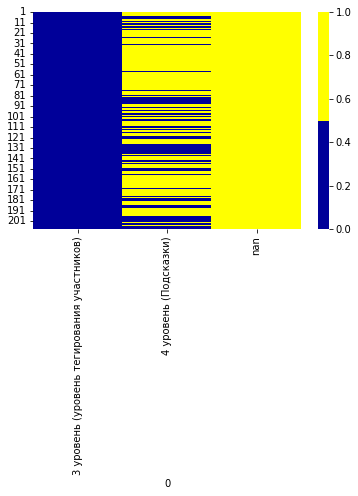

In [ ]:
cols = dfsprtech.columns[5:8] # первые 30 колонок
# определяем цвета 
# желтый - пропущенные данные, синий - не пропущенные
colours = ['#000099', '#ffff00'] 
sns.heatmap(dfsprtech[cols].isnull(), cmap=sns.color_palette(colours))

## Загрузка сводной таблицы

In [ ]:
# comps = pd.read_excel('1. Компании.xlsx')
# prods = pd.read_excel('2. Продукты_new.xlsx')
# indus = pd.read_excel('3. Отрасли.xlsx')
# techs = pd.read_excel('4. Технологии.xlsx')
# prods.columns = prods.iloc[0]
# prods = prods.iloc[1:]
# prods['Компания'] = prods['Компания'].values.astype(int)
# prods['global_id (продукта)'] = prods['global_id (продукта)'].values.astype(int)

# mergedProdsTechsIndus = pd.DataFrame.merge(\
#                         pd.DataFrame.merge(prods, techs, left_on='global_id (продукта)', right_on='Создаваемые продукты'),\
#                         indus, left_on='global_id (продукта)', right_on='Создаваемые продукты')

# mergedAll = pd.DataFrame.merge(comps, mergedProdsTechsIndus, left_on='global_id', right_on='Компания')

# mergedAll = mergedAll.drop(['Технология (1 уровень)_y',
#                 'Технология (2 уровень)_y', 'Технология (3 уровень)_y', 'global_id_y',
#                 'Создаваемые продукты_y', 'Отрасль_y', 'Подотрасль_y', 'global_id'], axis=1)
# mergedAll = mergedAll.rename(columns={'Отрасль_x': 'Отрасль', 'Подотрасль_x': 'Подотрасль', 'Технология (1 уровень)_x': 'Технология (1 уровень)', 'Технология (2 уровень)_x': 'Технология (2 уровень)',
#                 'Технология (3 уровень)_x': 'Технология (3 уровень)', 'global_id_x': 'global_id', 'Создаваемые продукты_x': 'Создаваемые продукты'})

# mergedAll.to_csv('Merged.csv', index=False)

In [ ]:
df = pd.read_csv("Merged.csv", encoding='utf8')

In [ ]:
df

,Наименование поддержанной компании,Отрасль,Подотрасль,Технология (1 уровень),Технология (2 уровень),Технология (3 уровень),Сайт,Описание компании,global_id (продукта),Компания,...,Раздел (ОКПД 2),Класс (ОКПД 2),Подкласс (ОКПД 2),Группа (ОКПД 2),Подгруппа (ОКПД 2),Вид (ОКПД 2),Категория (ОКПД 2),Подкатегория (ОКПД 2),Описание продукта (с указанием конкретных характеристик),Создаваемые продукты
0,"ООО ""АГРОПЛАЗМА""",СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО),Растениеводство,Синтез материальных объектов,Синтез живых организмов и систем,Технологии селекции растений,http://www.agroplazma.com,ООО «Агроплазма» является оригинатором и патен...,812529.0,784577.0,...,"Раздел A. Продукция сельского, лесного и рыбно...",01. Продукция и услуги сельского хозяйства и о...,01.1 Культуры однолетние,"01.11. Культуры зерновые (кроме риса), зернобо...","01.11.9 Семена льна, горчицы, рапса, сурепицы,...",01.11.95. Семена подсолнечника,01.11.95.110. Семена подсолнечника для посева,Отсутствует,"Высокопродуктивные семена подсолнечника, с уко...",812529.0
1,"ООО ""ЛАБОРАТОРИЯ НАНОСЕМАНТИКА""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Синтез информации,Искусственный интеллект,"Обработка естественных языков (перевод, класси...",https://nanosemantics.ai/,"""Лаборатория Наносемантика"" — ведущий российск...",830358.0,810784.0,...,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,"63.1. Услуги по обработке данных, размещению и...","63.11. Услуги по обработке данных, размещению ...","63.11.1. Услуги по обработке данных, размещени...",63.11.19. Услуги прочие по размещению и предос...,63.11.19.000. Услуги прочие по размещению и пр...,Отсутствует,Наносемантика - технология искусственного инте...,830358.0
2,"ООО ""ЛАБОРАТОРИЯ НАНОСЕМАНТИКА""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Синтез информации,Искусственный интеллект,"Обработка естественных языков (перевод, класси...",https://nanosemantics.ai/,"""Лаборатория Наносемантика"" — ведущий российск...",830358.0,810784.0,...,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,"63.1. Услуги по обработке данных, размещению и...","63.11. Услуги по обработке данных, размещению ...","63.11.1. Услуги по обработке данных, размещени...",63.11.19. Услуги прочие по размещению и предос...,63.11.19.000. Услуги прочие по размещению и пр...,Отсутствует,Наносемантика - технология искусственного инте...,830358.0
3,"ООО ""ЛАБОРАТОРИЯ НАНОСЕМАНТИКА""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Синтез информации,Искусственный интеллект,"Обработка естественных языков (перевод, класси...",https://nanosemantics.ai/,"""Лаборатория Наносемантика"" — ведущий российск...",830358.0,810784.0,...,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,"63.1. Услуги по обработке данных, размещению и...","63.11. Услуги по обработке данных, размещению ...","63.11.1. Услуги по обработке данных, размещени...",63.11.19. Услуги прочие по размещению и предос...,63.11.19.000. Услуги прочие по размещению и пр...,Отсутствует,Наносемантика - технология искусственного инте...,830358.0
4,"ООО ""ЛАБОРАТОРИЯ НАНОСЕМАНТИКА""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Деятельность по созданию новых информационных ...,Синтез информации,Искусственный интеллект,"Обработка естественных языков (перевод, класси...",https://nanosemantics.ai/,"""Лаборатория Наносемантика"" — ведущий российск...",830358.0,810784.0,...,Раздел J. Услуги в области информации и связи,63. Услуги в области информационных технологий,"63.1. Услуги по обработке данных, размещению и...","63.11. Услуги по обработке данных, размещению ...","63.11.1. Услуги по обработке данных, размещени...",63.11.19. Услуги прочие по размещению и предос...,63.11.19.000. Услуги прочие по размещению и пр...,Отсутствует,Наносемантика - технология искусственного инте...,830358.0
...,...,...,...,...,...,.

In [ ]:
df = df.rename(columns={'Технология (3 уровень)': 'Технология3'})

In [ ]:
df = df.rename(columns={'Раздел (ОКПД 2)': 'РазделОКПД2', 'Класс (ОКПД 2)': 'КлассОКПД2', 'Подкласс (ОКПД 2)': 'ПодклассОКПД2',
       'Группа (ОКПД 2)': 'ГруппаОКПД2', 'Подгруппа (ОКПД 2)': 'ПодгруппаОКПД2', 'Вид (ОКПД 2)': 'ВидОКПД2', 'Категория (ОКПД 2)': 'КатегорияОКПД2', 
       'Подкатегория (ОКПД 2)': 'ПодкатегорияОКПД2'})

In [ ]:
df[(df['Наименование поддержанной компании']	== 'ООО "БАЗИС"')]

,Наименование поддержанной компании,Отрасль,Подотрасль,Технология (1 уровень),Технология (2 уровень),Технология3,Сайт,Описание компании,global_id (продукта),Компания,...,РазделОКПД2,КлассОКПД2,ПодклассОКПД2,ГруппаОКПД2,ПодгруппаОКПД2,ВидОКПД2,КатегорияОКПД2,ПодкатегорияОКПД2,Описание продукта (с указанием конкретных характеристик),Создаваемые продукты
1744,"ООО ""БАЗИС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Технологии цифровой безопасности,Контроль вторжений в информационные системы,https://navigator.sk.ru/orn/1121463,«ТИОНИКС» – разработчик программных продуктов ...,830533.0,811078.0,...,Раздел J. Услуги в области информации и связи,62. Продукты программные и услуги по разработк...,62.0. Продукты программные и услуги по разрабо...,62.01. Продукты программные и услуги по разраб...,"62.01.1. Услуги по проектированию, разработке ...","62.01.11. Услуги по проектированию, разработке...",62.01.11.000. Услуги по проектированию и разра...,Отсутствует,Облачная платформа ТИОНИКС – программный проду...,830533.0
1745,"ООО ""БАЗИС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Технологии цифровой безопасности,Контроль вторжений в информационные системы,https://navigator.sk.ru/orn/1121463,«ТИОНИКС» – разработчик программных продуктов ...,830533.0,811078.0,...,Раздел J. Услуги в области информации и связи,62. Продукты программные и услуги по разработк...,62.0. Продукты программные и услуги по разрабо...,62.01. Продукты программные и услуги по разраб...,"62.01.1. Услуги по проектированию, разработке ...","62.01.11. Услуги по проектированию, разработке...",62.01.11.000. Услуги по проектированию и разра...,Отсутствует,Облачная платформа ТИОНИКС – программный проду...,830533.0
1746,"ООО ""БАЗИС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Технологии цифровой безопасности,Контроль вторжений в информационные системы,https://navigator.sk.ru/orn/1121463,«ТИОНИКС» – разработчик программных продуктов ...,830533.0,811078.0,...,Раздел J. Услуги в области информации и связи,62. Продукты программные и услуги по разработк...,62.0. Продукты программные и услуги по разрабо...,62.01. Продукты программные и услуги по разраб...,"62.01.1. Услуги по проектированию, разработке ...","62.01.11. Услуги по проектированию, разработке...",62.01.11.000. Услуги по проектированию и разра...,Отсутствует,Облачная платформа ТИОНИКС – программный проду...,830533.0
1747,"ООО ""БАЗИС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Технологии цифровой безопасности,Контроль вторжений в информационные системы,https://navigator.sk.ru/orn/1121463,«ТИОНИКС» – разработчик программных продуктов ...,830533.0,811078.0,...,Раздел J. Услуги в области информации и связи,62. Продукты программные и услуги по разработк...,62.0. Продукты программные и услуги по разрабо...,62.01. Продукты программные и услуги по разраб...,"62.01.1. Услуги по проектированию, разработке ...","62.01.11. Услуги по проектированию, разработке...",62.01.11.000. Услуги по проектированию и разра...,Отсутствует,Облачная платформа ТИОНИКС – программный проду...,830533.0
1748,"ООО ""БАЗИС""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Технологии цифровой безопасности,Контроль вторжений в информационные системы,https://navigator.sk.ru/orn/1121463,«ТИОНИКС» – разработчик программных продуктов ...,830533.0,811078.0,...,Раздел J. Услуги в области информации и связи,62. Продукты программные и услуги по разработк...,62.0. Продукты программные и услуги по разрабо...,62.01. Продукты программные и услуги по разраб...,"62.01.1. Услуги по проектированию, разработке ...","62.01.11. Услуги по проектированию, разработке...",62.01.11.000. Услуги по проектированию и разра...,Отсутствует,Облачная платформа Т

In [ ]:
df.describe(include=[object])  

,Наименование поддержанной компании,Отрасль,Подотрасль,Технология (1 уровень),Технология (2 уровень),Технология3,Сайт,Описание компании,Рыночное наименование продукта,РазделОКПД2,КлассОКПД2,ПодклассОКПД2,ГруппаОКПД2,ПодгруппаОКПД2,ВидОКПД2,КатегорияОКПД2,ПодкатегорияОКПД2,Описание продукта (с указанием конкретных характеристик)
count,2899,2899,2899,2899,2899,2899,2898,2898,2898,2898,2898,2898,2898,2898,2898,2898,2898,2898
unique,450,18,67,5,28,127,448,450,363,15,44,90,116,162,196,216,39,451
top,"ООО ""БЭТТЕРИЛАБ""",ТЕЛЕКОММУНИКАЦИИ И ИНТЕРНЕТ,Разработка аппаратно-программных комплексов,Обработка и преобразование информации,Обработка и хранение больших данных,Машинное обучение включая глубокое обучение и ...,https://navigator.sk.ru/orn/1122730,Компания\nСоздание высокомощного модульного ли...,-,Раздел C. Продукция обрабатывающих производств,62. Продукты программные и услуги по разработк...,62.0. Продукты программные и услуги по разрабо...,"63.11. Услуги по обработке данных, размещению ...","63.11.1. Услуги по обработке данных, размещени...","62.01.11. Услуги по проектированию, разработке...",62.01.11.000. Услуги по проектированию и разра...,Отсутствует,Система пожаротушения для литий ионных аккумул...
freq,110,1349,432,1115,701,195,110,110,590,1126,449,449,397,379,222,222,2611,110


In [ ]:
df[(df['Наименование поддержанной компании']	== 'ООО "ШЕРПА РОБОТИКС"')]

,Наименование поддержанной компании,Отрасль,Подотрасль,Технология (1 уровень),Технология (2 уровень),Технология3,Сайт,Описание компании,global_id (продукта),Компания,...,РазделОКПД2,КлассОКПД2,ПодклассОКПД2,ГруппаОКПД2,ПодгруппаОКПД2,ВидОКПД2,КатегорияОКПД2,ПодкатегорияОКПД2,Описание продукта (с указанием конкретных характеристик),Создаваемые продукты


In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
df['Наименование поддержанной компании'].value_counts().head(50)

ООО "БЭТТЕРИЛАБ"                          110
ООО "ЯЗЫКОВЫЕ ИННОВАЦИИ"                   24
ООО "РЕОКАТ"                               20
ООО "БИОТЕХ-ИННОВАЦИИ"                     20
ООО "СИКМО"                                18
ООО "МОБИТРАК"                             16
ООО "АГИМА ИНТЕРАКТИВ"                     16
ООО "КРОНОС"                               14
ООО "ВДК"                                  12
ООО "ИЦ АЙ-ТЕКО"                           12
ООО "ДЕВЕЛОПМЕНТ БЮРО"                     12
ООО "БЕСТДОКТОР"                           12
ООО "НП МОНОКРИСТАЛЛ ПАСТЫ"                10
ООО "ГТ"                                   10
ООО "ДМС"                                  10
ООО "АРМ"                                  10
ООО "БАНКИ.РУ ИСКУССТВЕННЫЙ ИНТЕЛЛЕКТ"      9
ООО "НПО"ЗАЩИТНЫЕ ПОКРЫТИЯ"                 9
ООО "ЛЕД-ИННОВАЦИИ"                         9
ООО "РИТМ"                                  9
ООО "ЭЛЬФИН"                                9
АО "НЕЙРОТРЕНД"                   

In [ ]:
# Сводка по распределению данных по каждой категории, здесь видим почти  кратное превышение среднего 
df['Наименование поддержанной компании'].value_counts().head(50)

ООО "БЭТТЕРИЛАБ"                          110
ООО "ЯЗЫКОВЫЕ ИННОВАЦИИ"                   24
ООО "РЕОКАТ"                               20
ООО "БИОТЕХ-ИННОВАЦИИ"                     20
ООО "СИКМО"                                18
ООО "МОБИТРАК"                             16
ООО "АГИМА ИНТЕРАКТИВ"                     16
ООО "КРОНОС"                               14
ООО "ВДК"                                  12
ООО "ИЦ АЙ-ТЕКО"                           12
ООО "ДЕВЕЛОПМЕНТ БЮРО"                     12
ООО "БЕСТДОКТОР"                           12
ООО "НП МОНОКРИСТАЛЛ ПАСТЫ"                10
ООО "ГТ"                                   10
ООО "ДМС"                                  10
ООО "АРМ"                                  10
ООО "БАНКИ.РУ ИСКУССТВЕННЫЙ ИНТЕЛЛЕКТ"      9
ООО "НПО"ЗАЩИТНЫЕ ПОКРЫТИЯ"                 9
ООО "ЛЕД-ИННОВАЦИИ"                         9
ООО "РИТМ"                                  9
ООО "ЭЛЬФИН"                                9
АО "НЕЙРОТРЕНД"                   

In [ ]:
# Пример данных из таблицы
print(df.values[0])

['ООО "АГРОПЛАЗМА"' 'СЕЛЬСКОЕ ХОЗЯЙСТВО (ВКЛЮЧАЯ РЫБОЛОВСТВО)'
 'Растениеводство' 'Синтез материальных объектов'
 'Синтез живых организмов и систем' 'Технологии селекции растений'
 'http://www.agroplazma.com'
 'ООО «Агроплазма» является оригинатором и патентообладателем, занимается производством и продажей семянсобственных сортов сельскохозяйственных культур. Компания «Агроплазма» – первая российская компания, которая на практике осуществляет селекцию сельскохозяйственных растений, связывая полезные признаки (скорость созревания, устойчивость к заболеваниям и др.) с кодирующими генами, комбинируя и отслеживая эти гены в ряду поколений методами молекулярного маркирования (MAS, маркер-опосредованная селе'
 812529.0 784577.0 'Семена подсолнечника'
 'Раздел A. Продукция сельского, лесного и рыбного хозяйства'
 '01. Продукция и услуги сельского хозяйства и охоты'
 '01.1 Культуры однолетние'
 '01.11.\xa0Культуры зерновые (кроме риса), зернобобовые, семена масличных культур'
 '01.11.9 Семена 

## ** Модель Описание продукта - подотрасль



In [ ]:
# Функция вывода сводки по распределению данных
def data_summary(df, Подотрасль):
    for cls in Подотрасль:
        print(f'Количество записей класса {cls}: {df[df.Подотрасль == cls].shape[0]}')    

In [ ]:
# Сводка по распределению данных
data_summary(df, df.Подотрасль.unique())

Количество записей класса Растениеводство: 92
Количество записей класса Деятельность по созданию новых информационных технологий: 1103
Количество записей класса Металлургия, металлопродукция, производство готовых металлических изделий: 213
Количество записей класса Разработка аппаратно-программных комплексов: 1690
Количество записей класса Специализированные информационные системы: 2037
Количество записей класса Системы охраны и обеспечения безопасности: 39
Количество записей класса Техническое создание и предоставление доступа к базам данных, в том числе распределенным : 45
Количество записей класса Инженерно-техническое проектирование: 512
Количество записей класса Добыча нефти и природного газа: 132
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 228
Количество записей класса Альтернативная энергетика: 57
Количество записей класса Химическая промышленность: 405
Количество записей класса Производство новых материалов: 320
Колич

In [ ]:
# Задание параметров преобразования
VOCAB_SIZE       = 30000                  # Объем словаря для токенизатора
TRAIN_TEST_RATIO = 0.2                    # Доля проверочной выборки в основном наборе

In [ ]:
# Назначение интервала допустимого количества текстов по классу
text_count_interval = [30, 400]

# Фильтрация данных - отбрасываются все данные без категории
# и все классы объемом менее нижней границы разрешенного интервала
class_to_drop = ['нет данных']
for cls in df.Подотрасль.unique():
    if df[df.Подотрасль == cls].shape[0] < text_count_interval[0]:
        class_to_drop.append(cls)

print(f'Удаляются классы: {class_to_drop}')

del_mask = df.Подотрасль.isin(class_to_drop)
df = df[~del_mask]

# По всем оставшимся классам количество примеров ограничивается не более
# верхней границы разрешенного интервала
for cls in df.Подотрасль.unique():
    df = df.drop(df[df.Подотрасль == cls].index[text_count_interval[1]:])

Удаляются классы: ['нет данных']


In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание продукта (с указанием конкретных характеристик)'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 36278
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Альтернативная энергетика' 'Банковская деятельность'
 'Безопасность дорожного движения' 'Беспроводная связь'
 'Высшее и послевузовское образование' 'Геологоразведочные работы'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа' 'Животноводство'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование'
 'Инфраструктура для автотранспорта'
 'Лёгкая промышленность. Товары народного потребления.' 'Машиностроение'
 'Металлургия, металлопродукция, производство готовых металлических изделий'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Передача, распределение и торговля электроэнергией'
 'Пищевая промышленность' 'Проводная связь'
 'Производство биомедицинских клеточных продуктов'
 'Производство лекарственных средств'
 'Производство медицинс

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(6903,)
[26990, 4316, 18748, 6, 26991, 2974, 18749, 2, 12214, 26992, 12, 1968, 200, 182, 26993, 6608, 3, 18, 34, 751]
(6903, 50000)
[0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
(6903, 53)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0.]


In [ ]:
# Функция компиляции и обучения модели нейронной сети
def compile_train_model(model, 
                        x_train,
                        y_train,
                        x_val,
                        y_val,
                        optimizer='adam',
                        epochs=50,
                        batch_size=128,
                        figsize=(20, 5)):

    # Компиляция модели
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

    # Вывод сводки
    model.summary()

    # Обучение модели с заданными параметрами
    history = model.fit(x_train,
                        y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(x_val, y_val))

    # Вывод графиков точности и ошибки
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle('График процесса обучения модели')
    ax1.plot(history.history['accuracy'], 
               label='Доля верных ответов на обучающем наборе')
    ax1.plot(history.history['val_accuracy'], 
               label='Доля верных ответов на проверочном наборе')
    ax1.xaxis.get_major_locator().set_params(integer=True)
    ax1.set_xlabel('Эпоха обучения')
    ax1.set_ylabel('Доля верных ответов')
    ax1.legend()

    ax2.plot(history.history['loss'], 
               label='Ошибка на обучающем наборе')
    ax2.plot(history.history['val_loss'], 
               label='Ошибка на проверочном наборе')
    ax2.xaxis.get_major_locator().set_params(integer=True)
    ax2.set_xlabel('Эпоха обучения')
    ax2.set_ylabel('Ошибка')
    ax2.legend()
    plt.show()


# Функция вывода результатов оценки модели на заданных данных
def eval_model(model, x, y_true,
               class_labels=[],
               cm_round=3,
               title='',
               figsize=(10, 10)):
    # Вычисление предсказания сети
    y_pred = model.predict(x)
    # Построение матрицы ошибок
    cm = confusion_matrix(np.argmax(y_true, axis=1),
                          np.argmax(y_pred, axis=1),
                          normalize='true')
    # Округление значений матрицы ошибок
    cm = np.around(cm, cm_round)

    # Отрисовка матрицы ошибок
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(f'Нейросеть {title}: матрица ошибок нормализованная', fontsize=18)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax)
    plt.gca().images[-1].colorbar.remove()  # Стирание ненужной цветовой шкалы
    plt.xlabel('Предсказанные классы', fontsize=16)
    plt.ylabel('Верные классы', fontsize=16)
    fig.autofmt_xdate(rotation=45)          # Наклон меток горизонтальной оси при необходимости
    plt.show()    

    print('-'*100)
    print(f'Нейросеть: {title}')

    # Для каждого класса:
    for cls in range(len(class_labels)):
        # Определяется индекс класса с максимальным значением предсказания (уверенности)
        cls_pred = np.argmax(cm[cls])
        # Формируется сообщение о верности или неверности предсказания
        msg = 'ВЕРНО :-)' if cls_pred == cls else 'НЕВЕРНО :-('
        # Выводится текстовая информация о предсказанном классе и значении уверенности
        print('Класс: {:<20} {:3.0f}% сеть отнесла к классу {:<20} - {}'.format(class_labels[cls],
                                                                               100. * cm[cls, cls_pred],
                                                                               class_labels[cls_pred],
                                                                               msg))

    # Средняя точность распознавания определяется как среднее диагональных элементов матрицы ошибок
    print('\nСредняя точность распознавания: {:3.0f}%'.format(100. * cm.diagonal().mean()))


# Совместная функция обучения и оценки модели нейронной сети
def compile_train_eval_model(model, 
                             x_train,
                             y_train,
                             x_test,
                             y_test,
                             class_labels=CLASS_LIST,
                             title='',
                             optimizer='adam',
                             epochs=50,
                             batch_size=128,
                             graph_size=(20, 5),
                             cm_size=(10, 10)):

    # Компиляция и обучение модели на заданных параметрах
    # В качестве проверочных используются тестовые данные
    compile_train_model(model, 
                        x_train, y_train,
                        x_test, y_test,
                        optimizer=optimizer,
                        epochs=epochs,
                        batch_size=batch_size,
                        figsize=graph_size)

    # Вывод результатов оценки работы модели на тестовых данных
    eval_model(model, x_test, y_test, 
               class_labels=class_labels, 
               title=title,
               figsize=cm_size)

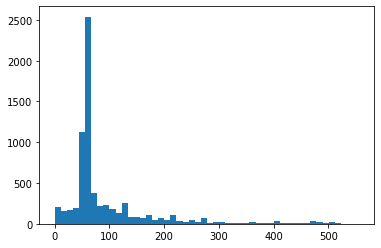

In [ ]:
# Построение гистограммы распределения длин текстов основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
data_summary(df, df.Подотрасль.unique())

Количество записей класса Растениеводство: 92
Количество записей класса Деятельность по созданию новых информационных технологий: 300
Количество записей класса Металлургия, металлопродукция, производство готовых металлических изделий: 213
Количество записей класса Разработка аппаратно-программных комплексов: 300
Количество записей класса Специализированные информационные системы: 300
Количество записей класса Системы охраны и обеспечения безопасности: 39
Количество записей класса Техническое создание и предоставление доступа к базам данных, в том числе распределенным : 45
Количество записей класса Инженерно-техническое проектирование: 300
Количество записей класса Добыча нефти и природного газа: 132
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 228
Количество записей класса Альтернативная энергетика: 57
Количество записей класса Химическая промышленность: 300
Количество записей класса Производство новых материалов: 300
Количест

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание продукта (с указанием конкретных характеристик)'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 36278
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Альтернативная энергетика' 'Банковская деятельность'
 'Безопасность дорожного движения' 'Беспроводная связь'
 'Высшее и послевузовское образование' 'Геологоразведочные работы'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа' 'Животноводство'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование'
 'Инфраструктура для автотранспорта'
 'Лёгкая промышленность. Товары народного потребления.' 'Машиностроение'
 'Металлургия, металлопродукция, производство готовых металлических изделий'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Передача, распределение и торговля электроэнергией'
 'Пищевая промышленность' 'Проводная связь'
 'Производство биомедицинских клеточных продуктов'
 'Производство лекарственных средств'
 'Производство медицинс

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(6903,)
[26990, 4316, 18748, 6, 26991, 2974, 18749, 2, 12214, 26992, 12, 1968, 200, 182, 26993, 6608, 3, 18, 34, 751]
(6903, 50000)
[0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
(6903, 53)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0.]


In [ ]:
# Получение индексов разделения основного набора на обучающую и тестовую выборки
idx_train, idx_test = train_test_split(list(range(len(x_data))),
                                       stratify=y_data,
                                       test_size=TRAIN_TEST_RATIO)

# Разделение в соответствии с полученными индексами
x_train, x_test = x_data[idx_train], x_data[idx_test]
x_train_01, x_test_01 = x_data_01[idx_train], x_data_01[idx_test]
y_train, y_test = y_data[idx_train], y_data[idx_test]

# Проверка результата
print(x_train.shape, x_test.shape)
print(x_train_01.shape, x_test_01.shape)
print(y_train.shape, y_test.shape)

(4141,) (2762,)
(4141, 50000) (2762, 50000)
(4141, 53) (2762, 53)


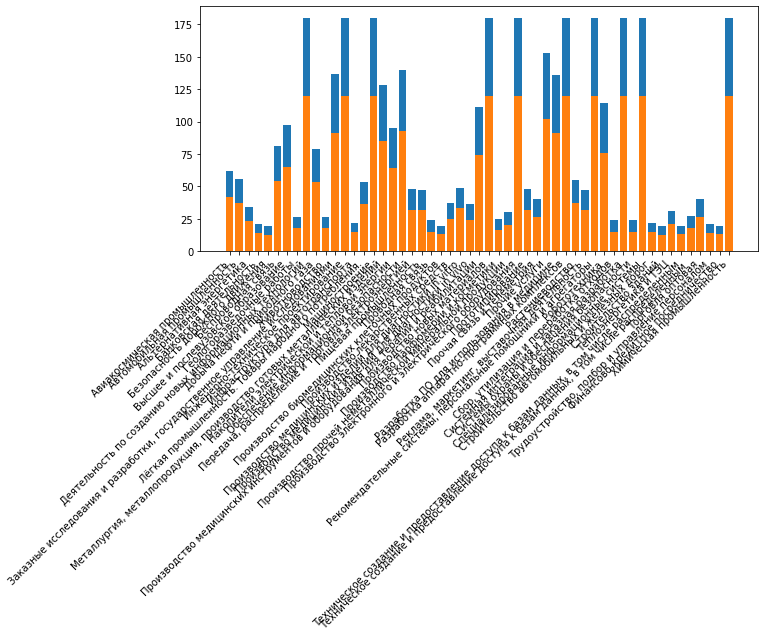

In [ ]:
# Проверка сбалансированности выборок по классам
fig = plt.figure(figsize=(10, 5))
c_train = np.bincount(np.argmax(y_train, axis=1))
c_test = np.bincount(np.argmax(y_test, axis=1))
plt.bar(CLASS_LIST, c_train)
plt.bar(CLASS_LIST, c_test)
fig.autofmt_xdate(rotation=45)
plt.show()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 256)               12800256  
                                                                 
 dropout_7 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 128)               32896     
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_12 (Dense)            (None, 64)                8256      
                                                                 
 dropout_9 (Dropout)         (None, 64)                0         
                                                                 
 dense_13 (Dense)            (None, 53)               

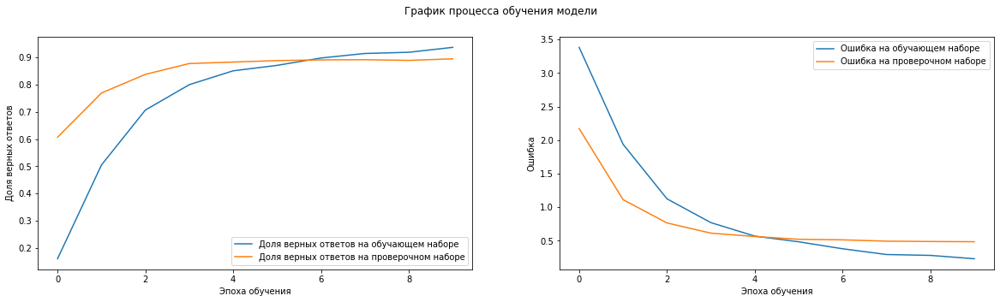

87/87 [==============================] - 0s 3ms/step


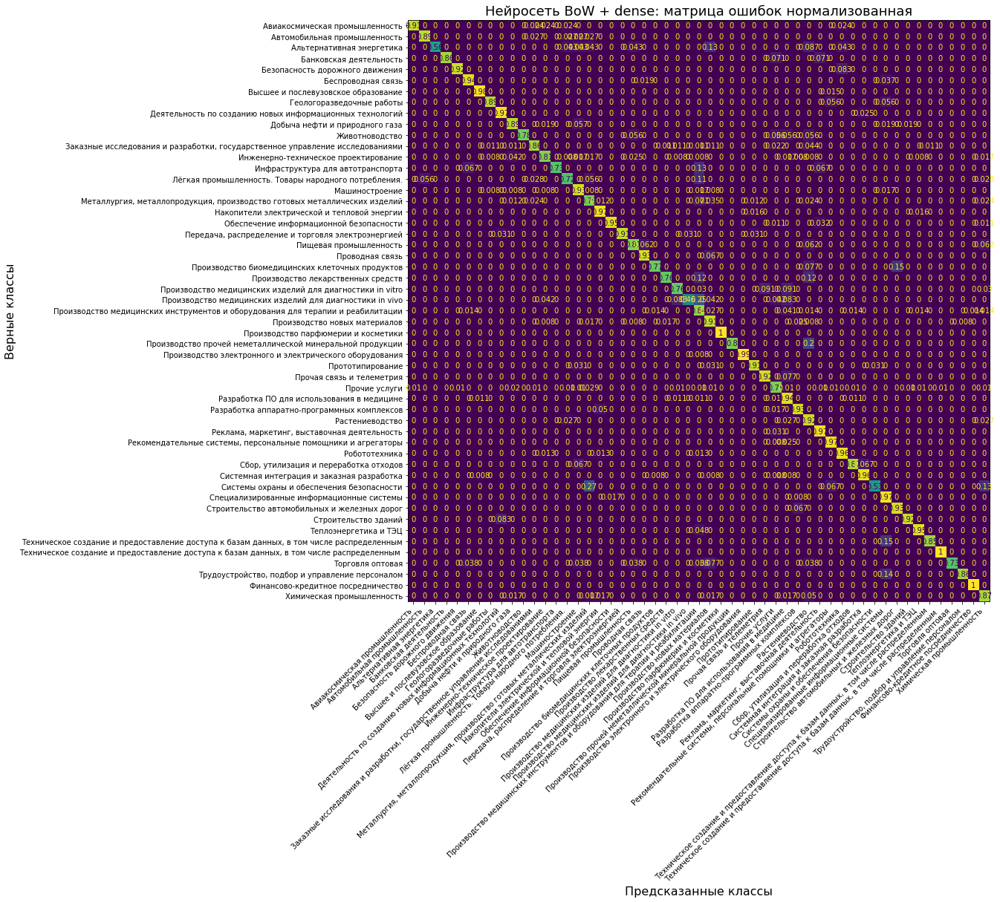

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность  90% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  89% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Альтернативная энергетика  56% сеть отнесла к классу Альтернативная энергетика - ВЕРНО :-)
Класс: Банковская деятельность  86% сеть отнесла к классу Банковская деятельность - ВЕРНО :-)
Класс: Безопасность дорожного движения  92% сеть отнесла к классу Безопасность дорожного движения - ВЕРНО :-)
Класс: Беспроводная связь    94% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование  98% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Геологоразведочные работы  89% сеть отнесла к классу Геологоразведочные работы - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных техно

In [ ]:
# Последовательная модель
model_prod_otr_text_bow_dense = Sequential()
# Входной полносвязный слой
model_prod_otr_text_bow_dense.add(Dense(256, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_prod_otr_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_prod_otr_text_bow_dense.add(Dense(128, activation='relu'))
# Слой регуляризации Dropout
model_prod_otr_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_prod_otr_text_bow_dense.add(Dense(64, activation='relu'))
# Слой регуляризации Dropout
model_prod_otr_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_prod_otr_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_prod_otr_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=10,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_94 (Dense)            (None, 1280)              38401280  
                                                                 
 dropout_68 (Dropout)        (None, 1280)              0         
                                                                 
 dense_95 (Dense)            (None, 128)               163968    
                                                                 
 dropout_69 (Dropout)        (None, 128)               0         
                                                                 
 dense_96 (Dense)            (None, 64)                8256      
                                                                 
 dropout_70 (Dropout)        (None, 64)                0         
                                                                 
 dense_97 (Dense)            (None, 30)              

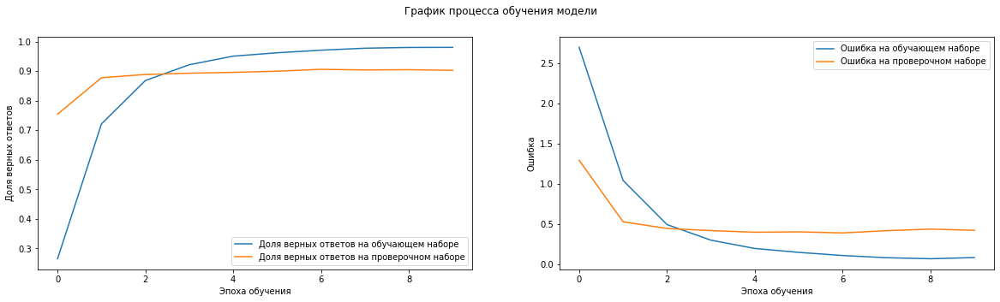

74/74 [==============================] - 0s 3ms/step


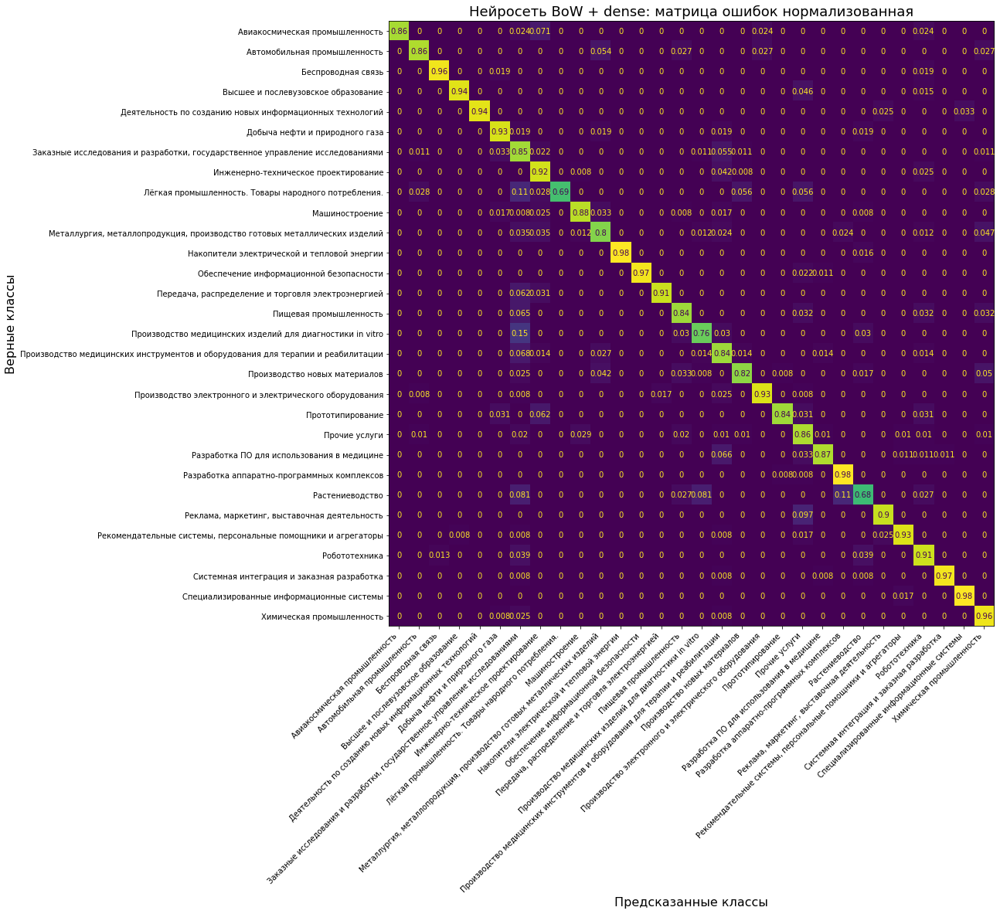

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность  86% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  86% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь    96% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование  94% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  94% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  92% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  85% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_text_bow_dense = Sequential()
# Входной полносвязный слой
model_text_bow_dense.add(Dense(256, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_text_bow_dense.add(Dense(128, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_text_bow_dense.add(Dense(64, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=10,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_38 (Dense)            (None, 100)               3000100   
                                                                 
 dropout_27 (Dropout)        (None, 100)               0         
                                                                 
 dense_39 (Dense)            (None, 100)               10100     
                                                                 
 dropout_28 (Dropout)        (None, 100)               0         
                                                                 
 dense_40 (Dense)            (None, 100)               10100     
                                                                 
 dropout_29 (Dropout)        (None, 100)               0         
                                                                 
 dense_41 (Dense)            (None, 30)              

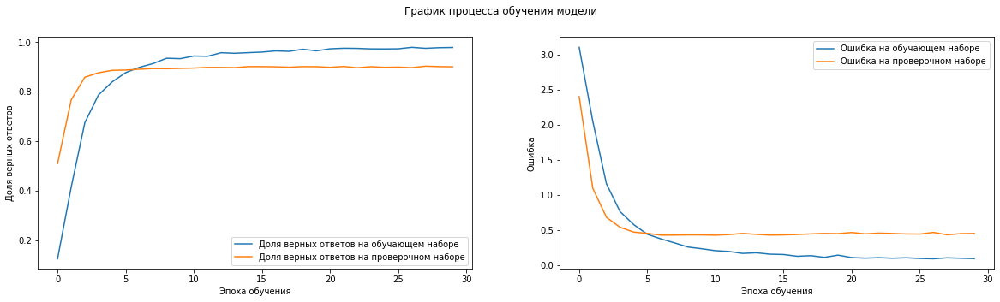

74/74 [==============================] - 0s 3ms/step


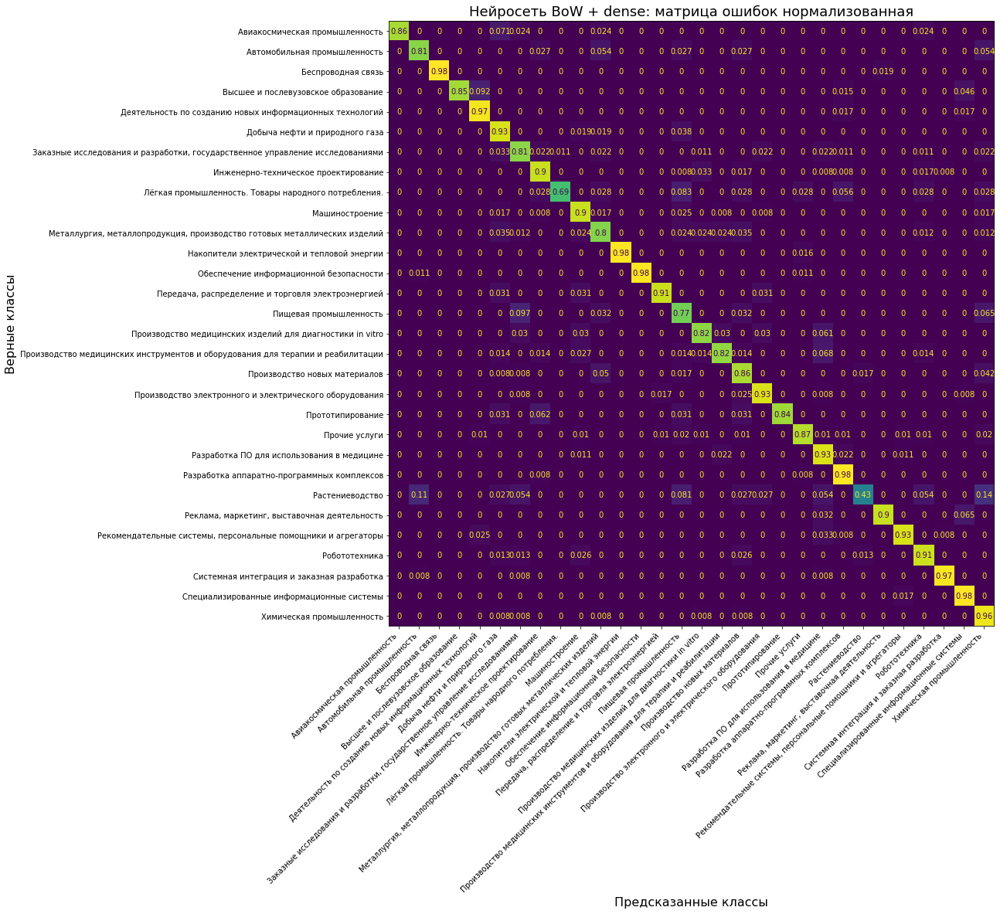

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность  86% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  81% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь    98% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование  85% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  97% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  92% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  81% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_text_bow_dense = Sequential()
# Входной полносвязный слой
model_text_bow_dense.add(Dense(1000, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_text_bow_dense.add(Dense(500, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_text_bow_dense.add(Dense(250, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 100)               3000100   
                                                                 
 dropout_20 (Dropout)        (None, 100)               0         
                                                                 
 dense_29 (Dense)            (None, 100)               10100     
                                                                 
 dropout_21 (Dropout)        (None, 100)               0         
                                                                 
 dense_30 (Dense)            (None, 100)               10100     
                                                                 
 dropout_22 (Dropout)        (None, 100)               0         
                                                                 
 dense_31 (Dense)            (None, 30)               

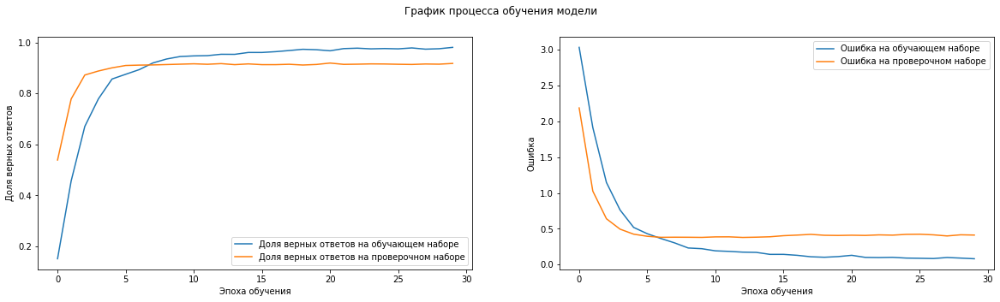

86/86 [==============================] - 0s 3ms/step


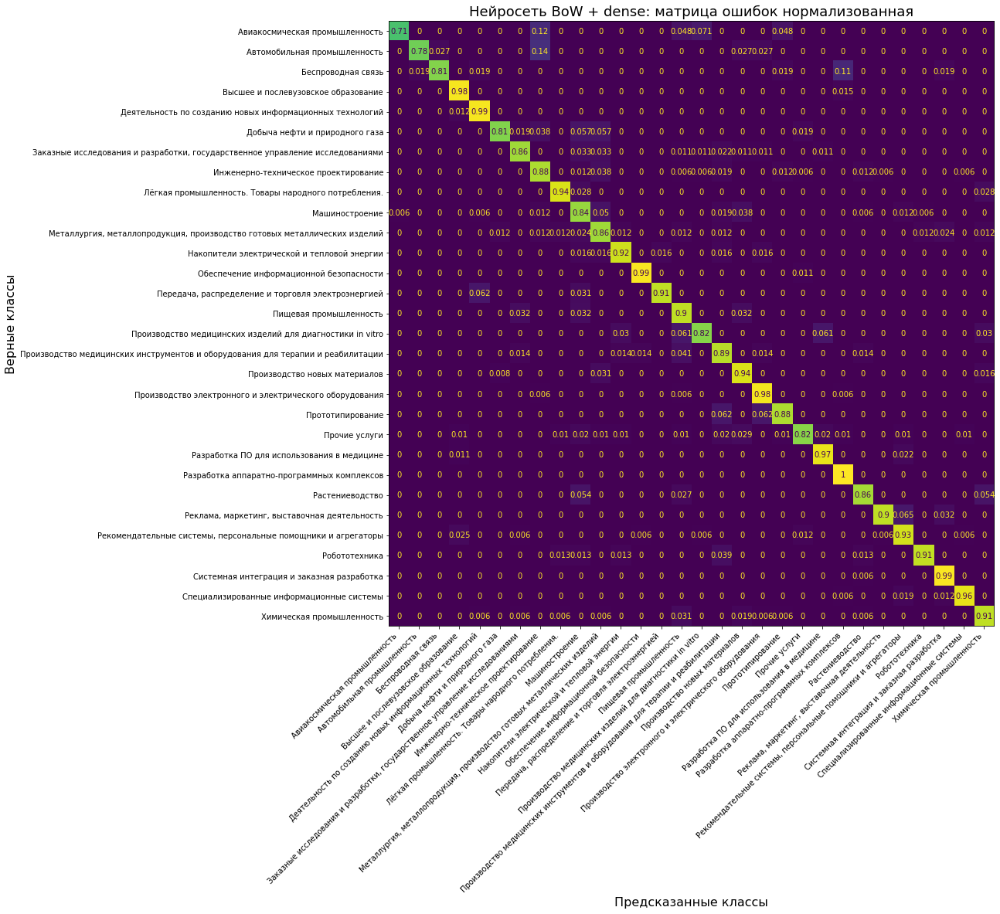

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность  71% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  78% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь    82% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование  98% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  99% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  81% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  86% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_text_bow_dense = Sequential()
# Входной полносвязный слой
model_text_bow_dense.add(Dense(100, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=30,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_22 (Dense)            (None, 100)               3000100   
                                                                 
 dropout_16 (Dropout)        (None, 100)               0         
                                                                 
 dense_23 (Dense)            (None, 100)               10100     
                                                                 
 dropout_17 (Dropout)        (None, 100)               0         
                                                                 
 dense_24 (Dense)            (None, 100)               10100     
                                                                 
 dropout_18 (Dropout)        (None, 100)               0         
                                                                 
 dense_25 (Dense)            (None, 30)               

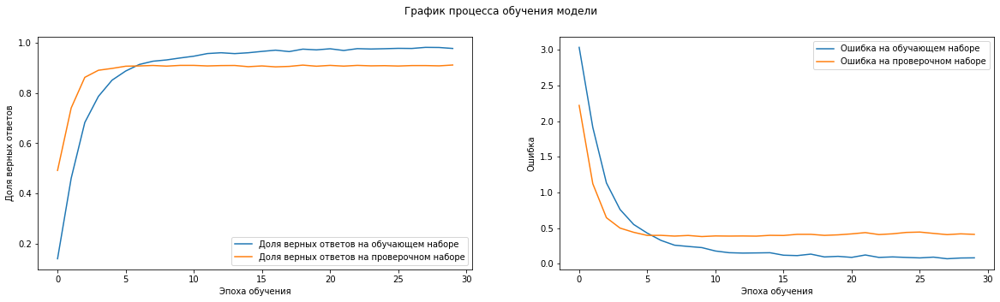

86/86 [==============================] - 0s 3ms/step


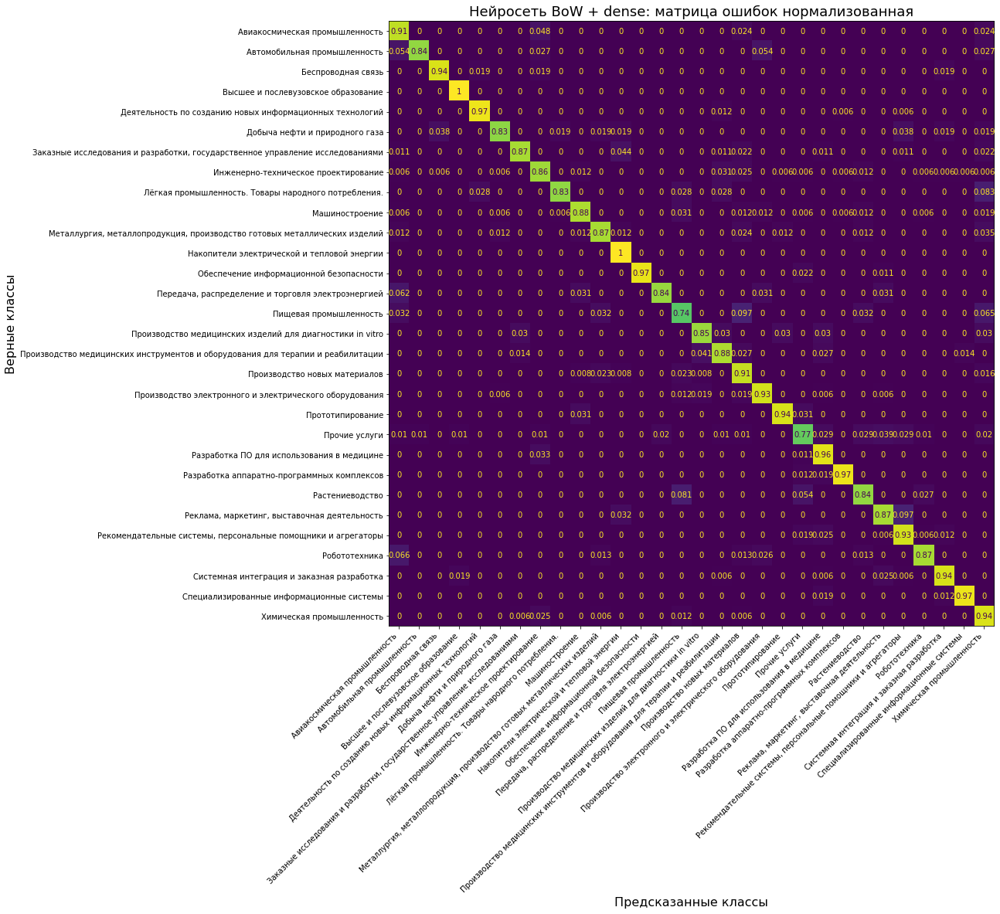

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность  90% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  84% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь    94% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  98% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  83% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  87% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_text_bow_dense = Sequential()
# Входной полносвязный слой
model_text_bow_dense.add(Dense(100, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=30,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

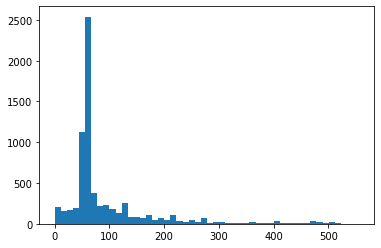

In [ ]:
# Построение гистограммы распределения длин текстов в словах основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Снижение размерности входных данных:
# ограничение длины последовательностей до разумного предела
seq_max_len = 400
x_train_clip = pad_sequences(x_train, maxlen=seq_max_len)
x_test_clip = pad_sequences(x_test, maxlen=seq_max_len)

# Проверка формы результата
print(x_train_clip.shape, x_test_clip.shape)

(4141, 200) (2762, 200)


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 200, 50)           2500000   
                                                                 
 spatial_dropout1d_2 (Spatia  (None, 200, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_2 (Flatten)         (None, 10000)             0         
                                                                 
 batch_normalization_4 (Batc  (None, 10000)            40000     
 hNormalization)                                                 
                                                                 
 dense_16 (Dense)            (None, 64)                640064    
                                                                 
 dropout_11 (Dropout)        (None, 64)               

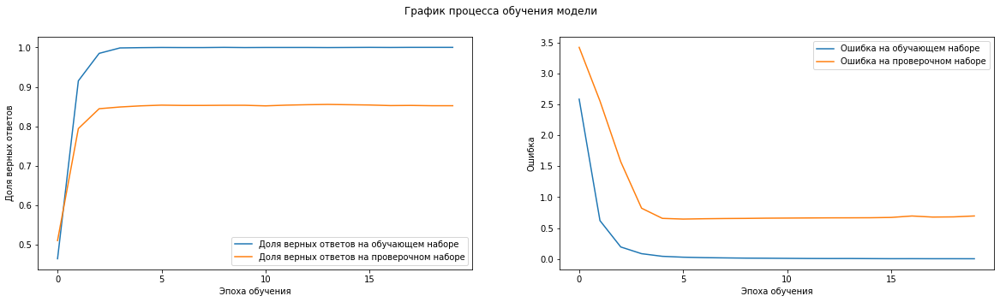

87/87 [==============================] - 0s 2ms/step


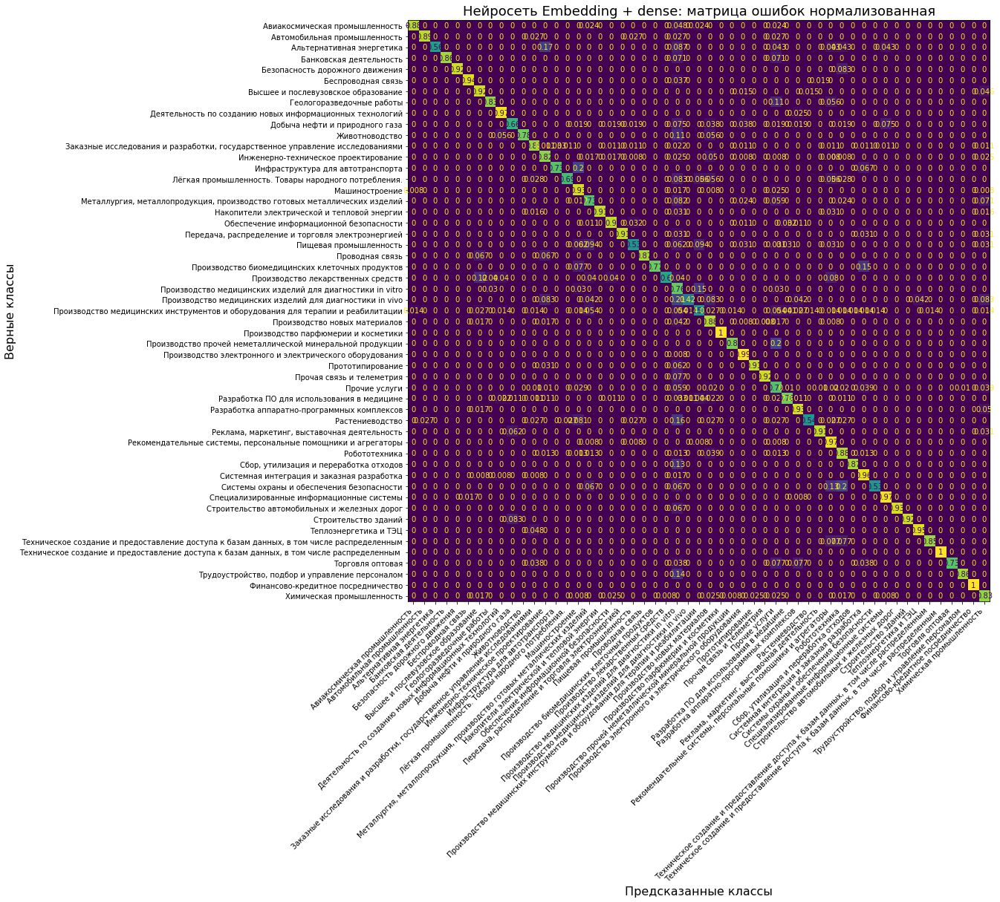

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность  88% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  89% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Альтернативная энергетика  56% сеть отнесла к классу Альтернативная энергетика - ВЕРНО :-)
Класс: Банковская деятельность  86% сеть отнесла к классу Банковская деятельность - ВЕРНО :-)
Класс: Безопасность дорожного движения  92% сеть отнесла к классу Безопасность дорожного движения - ВЕРНО :-)
Класс: Беспроводная связь    94% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование  92% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Геологоразведочные работы  83% сеть отнесла к классу Геологоразведочные работы - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных

In [ ]:
# Последовательная модель
model_prod_otr_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_prod_otr_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_prod_otr_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_prod_otr_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_prod_otr_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_prod_otr_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_prod_otr_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_prod_otr_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_prod_otr_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_prod_otr_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 200, 50)           1500000   
                                                                 
 spatial_dropout1d_3 (Spatia  (None, 200, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_3 (Flatten)         (None, 10000)             0         
                                                                 
 batch_normalization_6 (Batc  (None, 10000)            40000     
 hNormalization)                                                 
                                                                 
 dense_42 (Dense)            (None, 64)                640064    
                                                                 
 dropout_30 (Dropout)        (None, 64)              

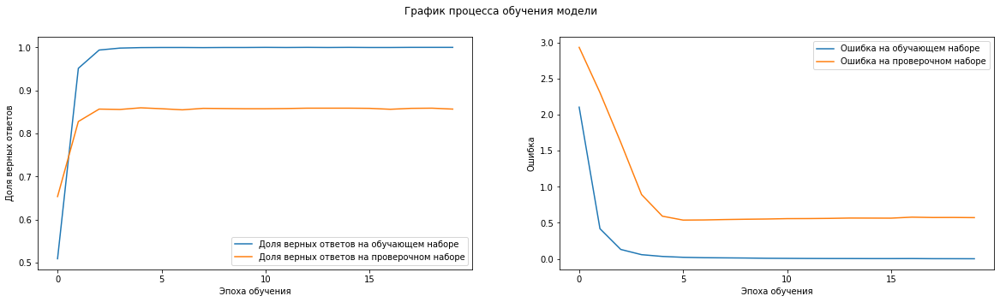

74/74 [==============================] - 0s 2ms/step


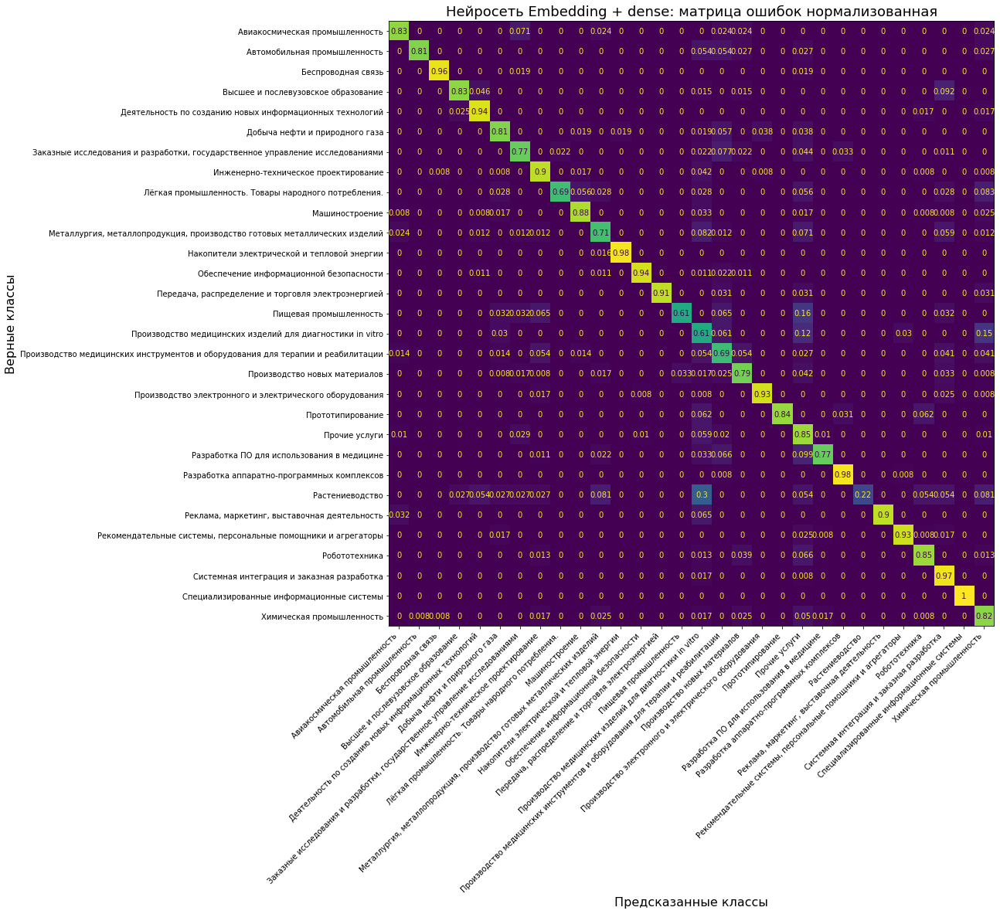

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность  83% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  81% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь    96% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование  83% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  94% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  81% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  77% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследова

In [ ]:
# Последовательная модель
model_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 200, 50)           1500000   
                                                                 
 spatial_dropout1d_2 (Spatia  (None, 200, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_2 (Flatten)         (None, 10000)             0         
                                                                 
 batch_normalization_4 (Batc  (None, 10000)            40000     
 hNormalization)                                                 
                                                                 
 dense_36 (Dense)            (None, 64)                640064    
                                                                 
 dropout_26 (Dropout)        (None, 64)              

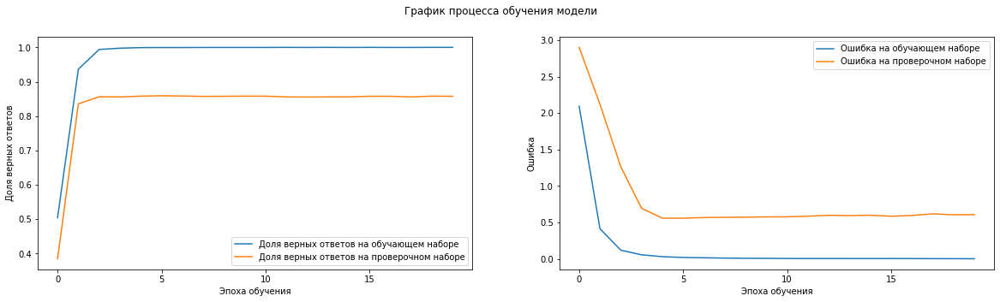

86/86 [==============================] - 0s 2ms/step


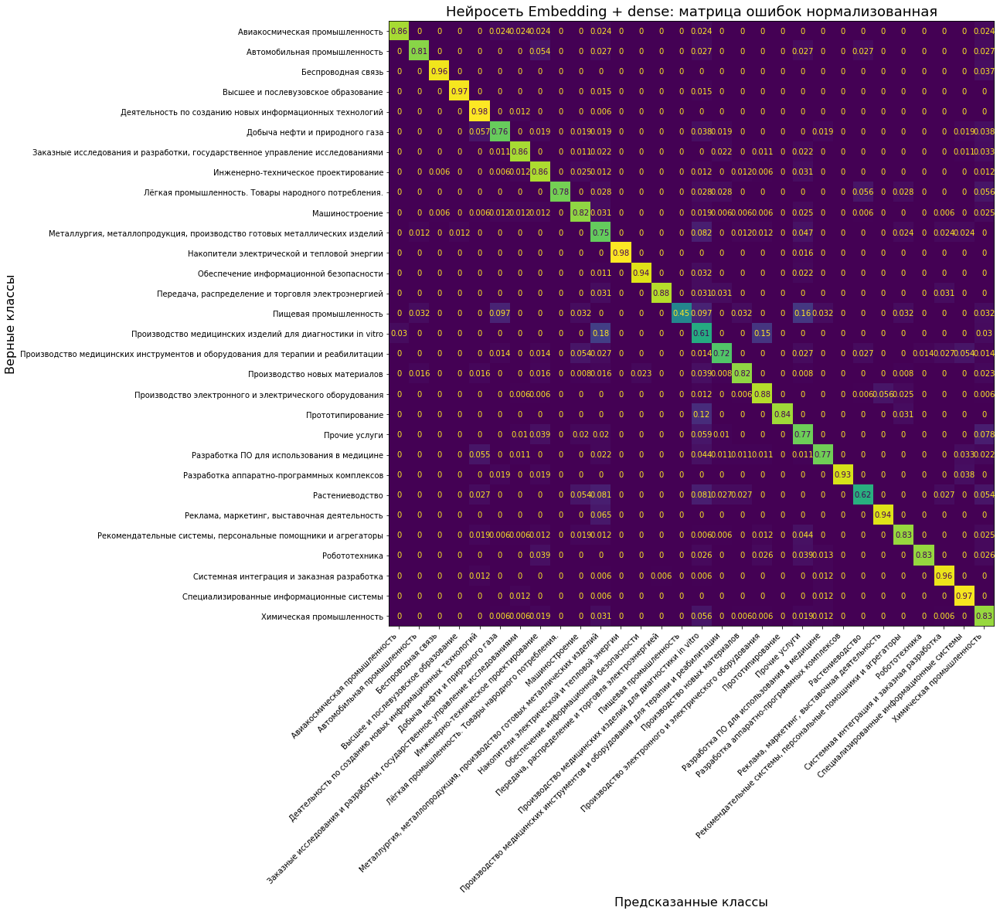

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность  86% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  81% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь    96% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование  97% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  98% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  76% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  86% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследова

In [ ]:
# Последовательная модель
model_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 200, 50)           1500000   
                                                                 
 spatial_dropout1d_1 (Spatia  (None, 200, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_1 (Flatten)         (None, 10000)             0         
                                                                 
 batch_normalization_2 (Batc  (None, 10000)            40000     
 hNormalization)                                                 
                                                                 
 dense_26 (Dense)            (None, 64)                640064    
                                                                 
 dropout_19 (Dropout)        (None, 64)               

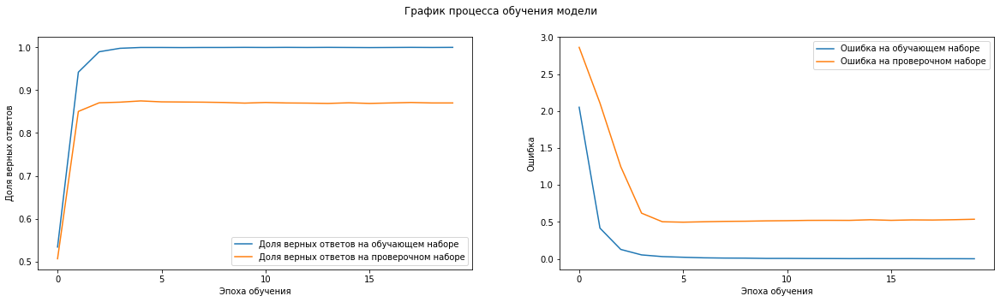

86/86 [==============================] - 0s 2ms/step


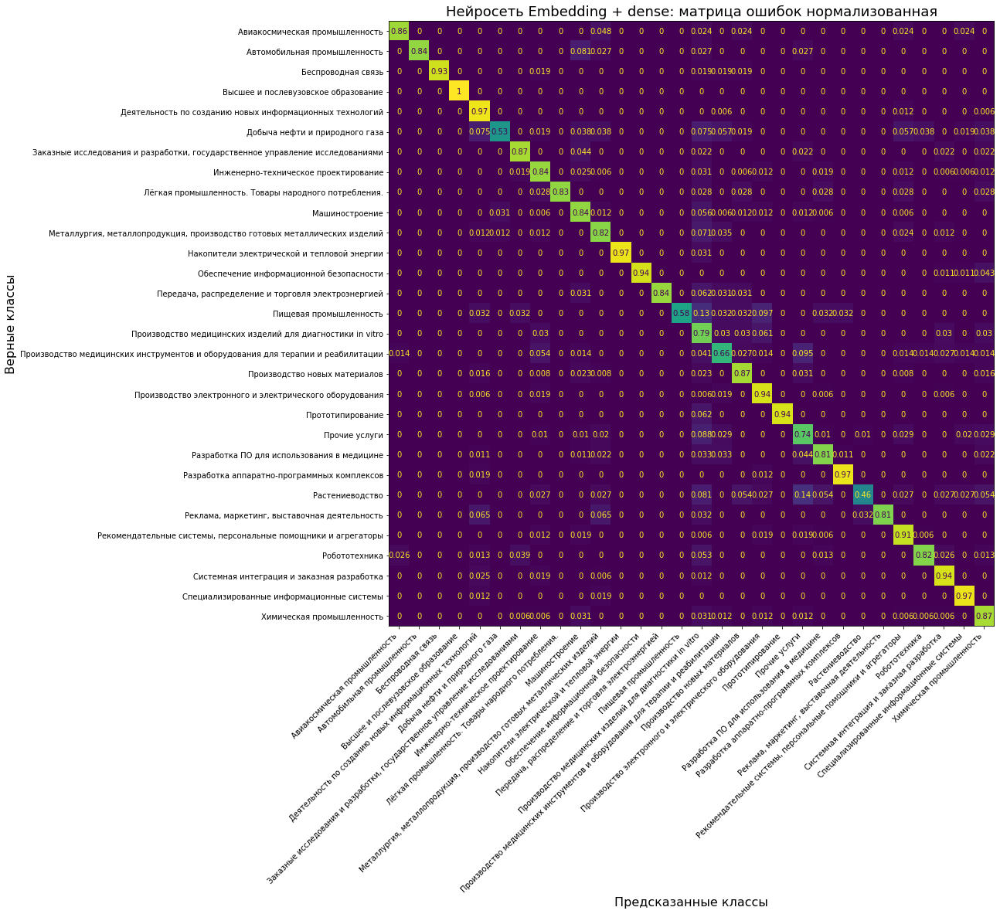

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность  86% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  84% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь    93% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  98% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  53% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  87% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследова

In [ ]:
# Последовательная модель
model_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

## **Модель Описание продукта технология 3 уровня**

In [ ]:
# Функция вывода сводки по распределению данных
def data_summary(df, Технология3):
    for cls in Технология3:
        print(f'Количество записей класса {cls}: {df[df.Технология3 == cls].shape[0]}')    

In [ ]:
# Сводка по распределению данных
data_summary(df, df.Технология3.unique())

Количество записей класса Технологии селекции растений: 7
Количество записей класса Обработка естественных языков (перевод, классификация, кластеризация и другое): 31
Количество записей класса Технологии сварки и пайки: 82
Количество записей класса Интерфейсы обмена большими данными: 117
Количество записей класса Синтез образовательного контента: 52
Количество записей класса Статистическая обработка данных: 127
Количество записей класса Системы промышленной безопасности: 56
Количество записей класса Регистрация и преобразование акустических сигналов: 52
Количество записей класса Моделирование химических процессов: 6
Количество записей класса Системы медицинской диагностики, лечения и реабилитации, включая телемедицинские системы: 72
Количество записей класса Технологии переработки неорганического сырья и отходов: 57
Количество записей класса Процессы органического синтеза: 25
Количество записей класса Новые технологии сепарации веществ и фракций, включая газо- и водоочистку: 24
Количес

In [ ]:
# Задание параметров преобразования
VOCAB_SIZE       = 30000                  # Объем словаря для токенизатора
TRAIN_TEST_RATIO = 0.2                    # Доля проверочной выборки в основном наборе

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание продукта (с указанием конкретных характеристик)'].tolist()
class_data = df.Технология3.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 36278
Список классов: ['Аддитивные технологии' 'Акустомеханические воздействия'
 'Аппаратно-программные комплексы для интеллектуальных электрических сетей (smart grid, microgrid)'
 'Биоинформатика' 'Биотехнологические процессы' 'Биотехнология вирусов'
 'Биотехнология клеточных культур' 'Биотехнология микроорганизмов'
 'Биотехнология растений' 'Биохимическое воздействие'
 'Вакуумная, компрессорная техника и пневмосистемы'
 'Воздействие ионизирующим излучением'
 'Генераторы плазмы и системы на их основе' 'Генная инженерия'
 'Геоданные и геоинформационные технологии'
 'Гидравлические машины, гидропневмоагрегаты' 'Граничные вычисления'
 'Детонационные методы обработки материалов'
 'Другие технологии накопления энергии'
 'Защита каналов передачи информации, криптография (Cryptography)'
 'Зеленая химия' 'Игровой искусственный интеллект (стратегия, тактика)'
 'Изменение объемных свойств' 'Изменение объемных свойств '
 'Изменение поверхностных свойств' 'Изменение поверхностных 

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(6903,)
[26990, 4316, 18748, 6, 26991, 2974, 18749, 2, 12214, 26992, 12, 1968, 200, 182, 26993, 6608, 3, 18, 34, 751]
(6903, 30000)
[0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0.]
(6903, 192)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
# Функция компиляции и обучения модели нейронной сети
def compile_train_model(model, 
                        x_train,
                        y_train,
                        x_val,
                        y_val,
                        optimizer='adam',
                        epochs=50,
                        batch_size=128,
                        figsize=(20, 5)):

    # Компиляция модели
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

    # Вывод сводки
    model.summary()

    # Обучение модели с заданными параметрами
    history = model.fit(x_train,
                        y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(x_val, y_val))

    # Вывод графиков точности и ошибки
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle('График процесса обучения модели')
    ax1.plot(history.history['accuracy'], 
               label='Доля верных ответов на обучающем наборе')
    ax1.plot(history.history['val_accuracy'], 
               label='Доля верных ответов на проверочном наборе')
    ax1.xaxis.get_major_locator().set_params(integer=True)
    ax1.set_xlabel('Эпоха обучения')
    ax1.set_ylabel('Доля верных ответов')
    ax1.legend()

    ax2.plot(history.history['loss'], 
               label='Ошибка на обучающем наборе')
    ax2.plot(history.history['val_loss'], 
               label='Ошибка на проверочном наборе')
    ax2.xaxis.get_major_locator().set_params(integer=True)
    ax2.set_xlabel('Эпоха обучения')
    ax2.set_ylabel('Ошибка')
    ax2.legend()
    plt.show()


# Функция вывода результатов оценки модели на заданных данных
def eval_model(model, x, y_true,
               class_labels=[],
               cm_round=3,
               title='',
               figsize=(10, 10)):
    # Вычисление предсказания сети
    y_pred = model.predict(x)
    # Построение матрицы ошибок
    cm = confusion_matrix(np.argmax(y_true, axis=1),
                          np.argmax(y_pred, axis=1),
                          normalize='true')
    # Округление значений матрицы ошибок
    cm = np.around(cm, cm_round)

    # Отрисовка матрицы ошибок
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(f'Нейросеть {title}: матрица ошибок нормализованная', fontsize=18)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax)
    plt.gca().images[-1].colorbar.remove()  # Стирание ненужной цветовой шкалы
    plt.xlabel('Предсказанные классы', fontsize=16)
    plt.ylabel('Верные классы', fontsize=16)
    fig.autofmt_xdate(rotation=45)          # Наклон меток горизонтальной оси при необходимости
    plt.show()    

    print('-'*100)
    print(f'Нейросеть: {title}')

    # Для каждого класса:
    for cls in range(len(class_labels)):
        # Определяется индекс класса с максимальным значением предсказания (уверенности)
        cls_pred = np.argmax(cm[cls])
        # Формируется сообщение о верности или неверности предсказания
        msg = 'ВЕРНО :-)' if cls_pred == cls else 'НЕВЕРНО :-('
        # Выводится текстовая информация о предсказанном классе и значении уверенности
        print('Класс: {:<20} {:3.0f}% сеть отнесла к классу {:<20} - {}'.format(class_labels[cls],
                                                                               100. * cm[cls, cls_pred],
                                                                               class_labels[cls_pred],
                                                                               msg))

    # Средняя точность распознавания определяется как среднее диагональных элементов матрицы ошибок
    print('\nСредняя точность распознавания: {:3.0f}%'.format(100. * cm.diagonal().mean()))


# Совместная функция обучения и оценки модели нейронной сети
def compile_train_eval_model(model, 
                             x_train,
                             y_train,
                             x_test,
                             y_test,
                             class_labels=CLASS_LIST,
                             title='',
                             optimizer='adam',
                             epochs=50,
                             batch_size=128,
                             graph_size=(20, 5),
                             cm_size=(10, 10)):

    # Компиляция и обучение модели на заданных параметрах
    # В качестве проверочных используются тестовые данные
    compile_train_model(model, 
                        x_train, y_train,
                        x_test, y_test,
                        optimizer=optimizer,
                        epochs=epochs,
                        batch_size=batch_size,
                        figsize=graph_size)

    # Вывод результатов оценки работы модели на тестовых данных
    eval_model(model, x_test, y_test, 
               class_labels=class_labels, 
               title=title,
               figsize=cm_size)

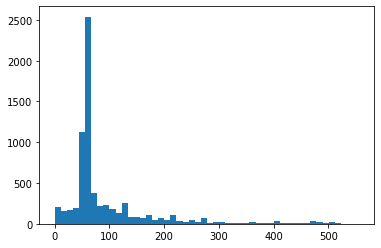

In [ ]:
# Построение гистограммы распределения длин текстов основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Назначение интервала допустимого количества текстов по классу
text_count_interval = [5, 200]

# Фильтрация данных - отбрасываются все данные без категории
# и все классы объемом менее нижней границы разрешенного интервала
# class_to_drop = ['нет данных']
for cls in df.Технология3.unique():
    if df[df.Технология3 == cls].shape[0] < text_count_interval[0]:
        class_to_drop.append(cls)

print(f'Удаляются классы: {class_to_drop}')

del_mask = df.Технология3.isin(class_to_drop)
df = df[~del_mask]

# По всем оставшимся классам количество примеров ограничивается не более
# верхней границы разрешенного интервала
for cls in df.Технология3.unique():
    df = df.drop(df[df.Технология3 == cls].index[text_count_interval[1]:])

Удаляются классы: ['нет данных', 'Интегральные фотонные схемы', 'Моделирование биологических систем', 'Технологии захвата движений в VR/АR и фотограмметрии', 'Электромагнитная обработка  материалов и изделий', 'Технологии селекции животных', 'Технологии использования низкопотенциальной энергии, включая технологии\n геотермальной энергетики', 'Биотехнология вирусов', 'Нейростимуляция и нейросенсинг', 'Технологии топливных элементов', 'Технологии организации и синхронизации данных', 'Технологии наработки радиоактивных и стабильных изотопов', 'Технологии передачи электроэнергии на постоянном токе HVDC', 'Технологии основного оборудования ТЭС (в т.ч. ПГУ, ГТУ, суперсверкритика, внутрицикловая газификация и т.д.)', 'Создание искусственных органов', 'Акустомеханические воздействия', 'Термоэлектрические и пьезоэлектрические технологии генерации энергии', 'Моделирование экологических систем (экология, климат, и др.) и влияния человека', 'Технологии использования низкопотенциальной энергии, вкл

In [ ]:
data_summary(df, df.Подотрасль.unique())

Количество записей класса Растениеводство: 0
Количество записей класса Деятельность по созданию новых информационных технологий: 0
Количество записей класса Металлургия, металлопродукция, производство готовых металлических изделий: 0
Количество записей класса Разработка аппаратно-программных комплексов: 0
Количество записей класса Специализированные информационные системы: 0
Количество записей класса Системы охраны и обеспечения безопасности: 0
Количество записей класса Техническое создание и предоставление доступа к базам данных, в том числе распределенным : 0
Количество записей класса Инженерно-техническое проектирование: 0
Количество записей класса Добыча нефти и природного газа: 0
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 0
Количество записей класса Альтернативная энергетика: 0
Количество записей класса Химическая промышленность: 0
Количество записей класса Производство новых материалов: 0
Количество записей класса Реко

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание продукта (с указанием конкретных характеристик)'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 34848
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Альтернативная энергетика' 'Банковская деятельность'
 'Безопасность дорожного движения' 'Беспроводная связь'
 'Высшее и послевузовское образование' 'Геологоразведочные работы'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа' 'Животноводство'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование'
 'Инфраструктура для автотранспорта'
 'Лёгкая промышленность. Товары народного потребления.' 'Машиностроение'
 'Металлургия, металлопродукция, производство готовых металлических изделий'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Передача, распределение и торговля электроэнергией'
 'Пищевая промышленность' 'Проводная связь'
 'Производство биомедицинских клеточных продуктов'
 'Производство лекарственных средств'
 'Производство медицинс

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(6665,)
[25967, 4135, 18148, 6, 25968, 2841, 18149, 2, 11881, 25969, 12, 1878, 194, 192, 25970, 7134, 3, 17, 34, 721]
(6665, 30000)
[0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1.]
(6665, 53)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0.]


In [ ]:
# Получение индексов разделения основного набора на обучающую и тестовую выборки
idx_train, idx_test = train_test_split(list(range(len(x_data))),
                                       stratify=y_data,
                                       test_size=TRAIN_TEST_RATIO)

# Разделение в соответствии с полученными индексами
x_train, x_test = x_data[idx_train], x_data[idx_test]
x_train_01, x_test_01 = x_data_01[idx_train], x_data_01[idx_test]
y_train, y_test = y_data[idx_train], y_data[idx_test]

# Проверка результата
print(x_train.shape, x_test.shape)
print(x_train_01.shape, x_test_01.shape)
print(y_train.shape, y_test.shape)

(5332,) (1333,)
(5332, 30000) (1333, 30000)
(5332, 53) (1333, 53)


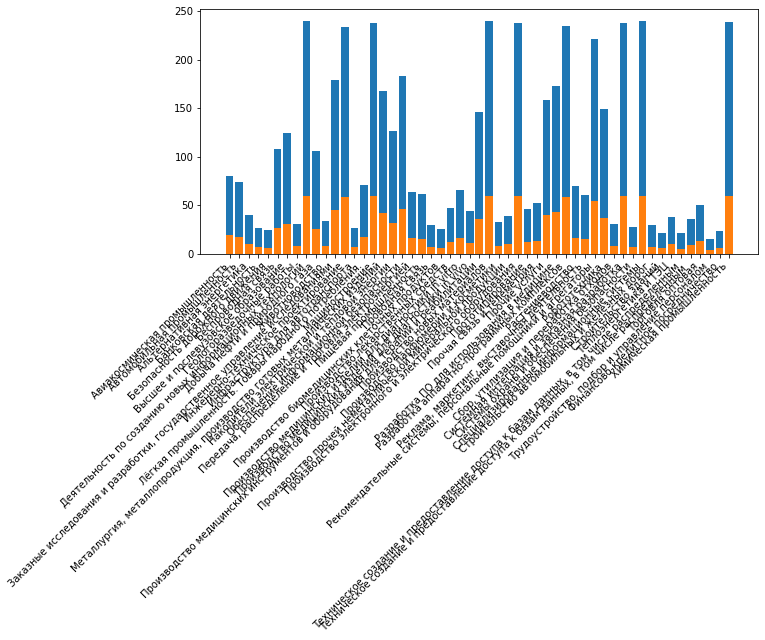

In [ ]:
# Проверка сбалансированности выборок по классам
fig = plt.figure(figsize=(10, 5))
c_train = np.bincount(np.argmax(y_train, axis=1))
c_test = np.bincount(np.argmax(y_test, axis=1))
plt.bar(CLASS_LIST, c_train)
plt.bar(CLASS_LIST, c_test)
fig.autofmt_xdate(rotation=45)
plt.show()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_22 (Dense)            (None, 100)               3000100   
                                                                 
 dropout_15 (Dropout)        (None, 100)               0         
                                                                 
 dense_23 (Dense)            (None, 100)               10100     
                                                                 
 dropout_16 (Dropout)        (None, 100)               0         
                                                                 
 dense_24 (Dense)            (None, 100)               10100     
                                                                 
 dropout_17 (Dropout)        (None, 100)               0         
                                                                 
 dense_25 (Dense)            (None, 53)               

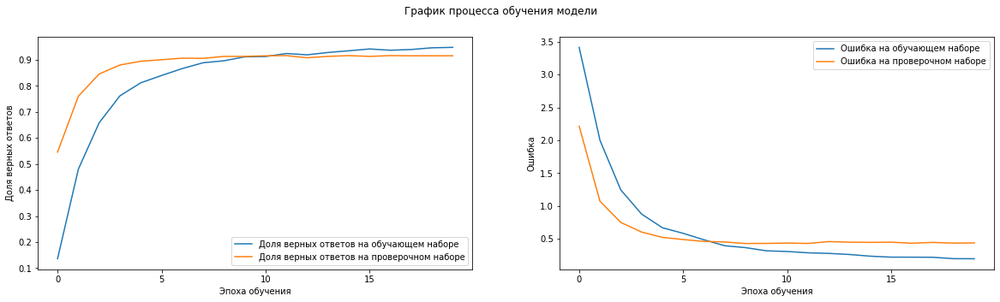

42/42 [==============================] - 0s 3ms/step


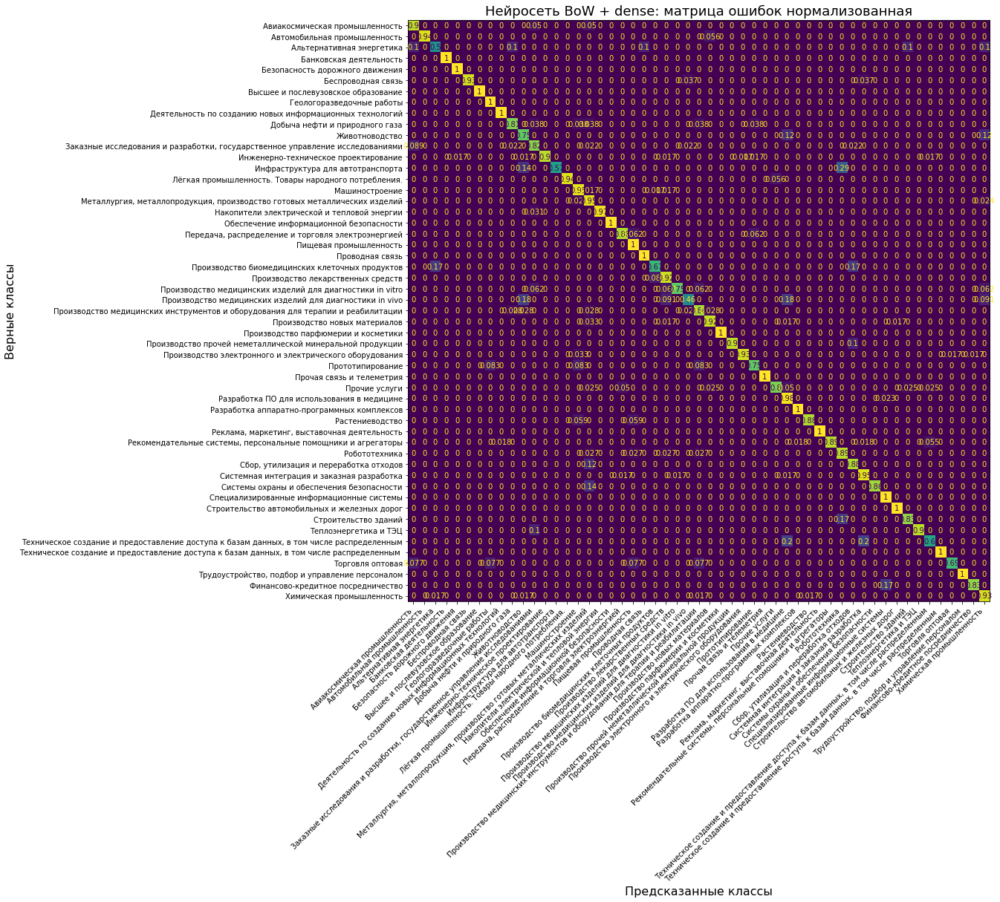

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность  90% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  94% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Альтернативная энергетика  50% сеть отнесла к классу Альтернативная энергетика - ВЕРНО :-)
Класс: Банковская деятельность 100% сеть отнесла к классу Банковская деятельность - ВЕРНО :-)
Класс: Безопасность дорожного движения 100% сеть отнесла к классу Безопасность дорожного движения - ВЕРНО :-)
Класс: Беспроводная связь    93% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Геологоразведочные работы 100% сеть отнесла к классу Геологоразведочные работы - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных техно

In [ ]:
# Последовательная модель
model_prod_tech3_text_bow_dense = Sequential()
# Входной полносвязный слой
model_prod_tech3_text_bow_dense.add(Dense(100, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_prod_tech3_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_prod_tech3_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_prod_tech3_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_prod_tech3_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_prod_tech3_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_prod_tech3_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_prod_tech3_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

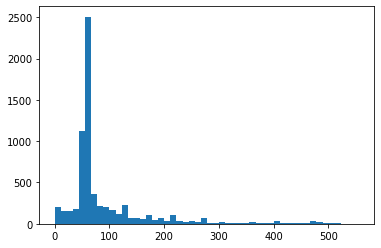

In [ ]:
# Построение гистограммы распределения длин текстов в словах основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Снижение размерности входных данных:
# ограничение длины последовательностей до разумного предела
seq_max_len = 400
x_train_clip = pad_sequences(x_train, maxlen=seq_max_len)
x_test_clip = pad_sequences(x_test, maxlen=seq_max_len)

# Проверка формы результата
print(x_train_clip.shape, x_test_clip.shape)

(5332, 400) (1333, 400)


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 400, 50)           1500000   
                                                                 
 spatial_dropout1d_3 (Spatia  (None, 400, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_3 (Flatten)         (None, 20000)             0         
                                                                 
 batch_normalization_6 (Batc  (None, 20000)            80000     
 hNormalization)                                                 
                                                                 
 dense_26 (Dense)            (None, 64)                1280064   
                                                                 
 dropout_18 (Dropout)        (None, 64)               

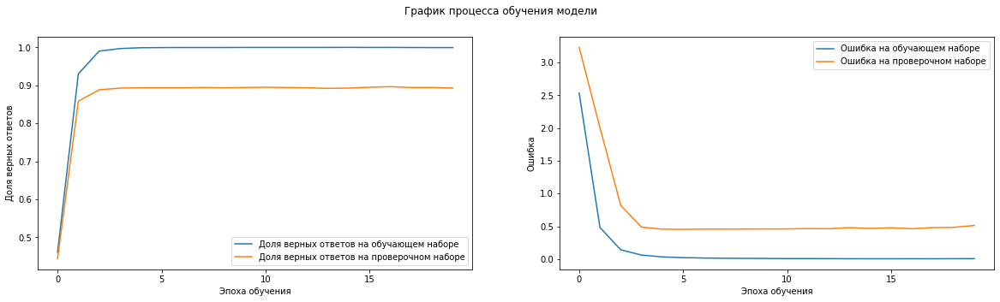

42/42 [==============================] - 0s 2ms/step


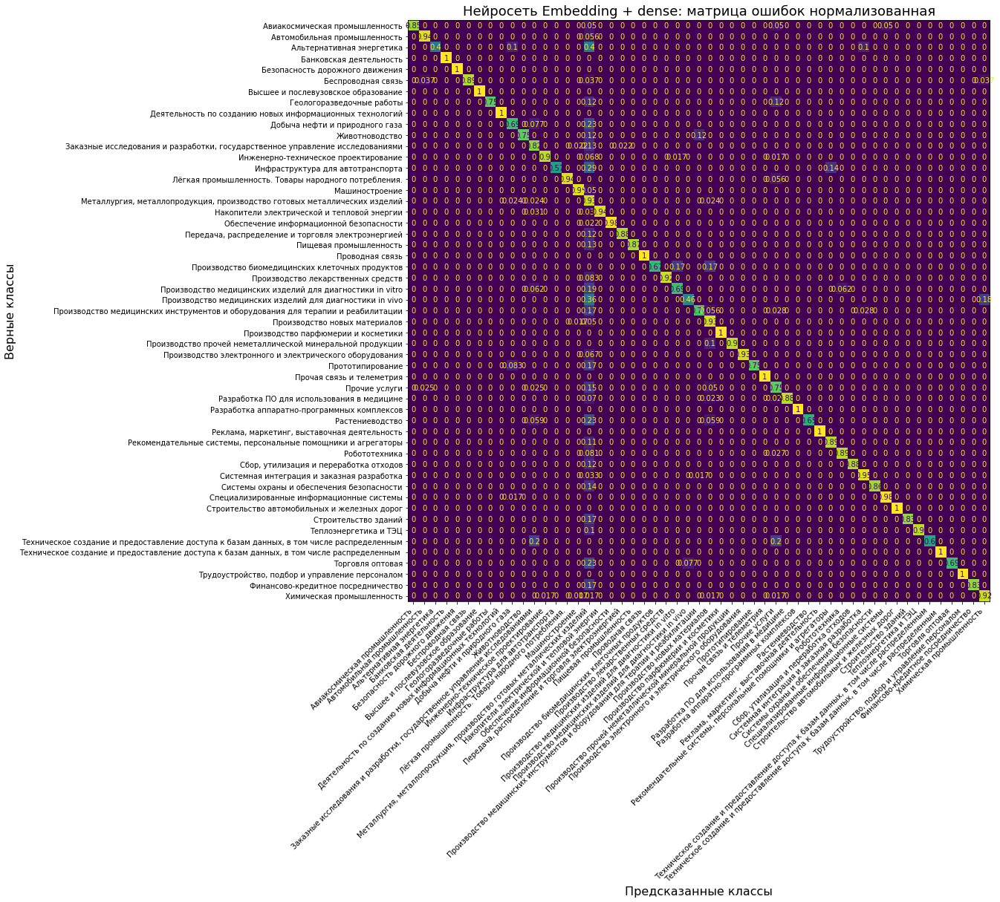

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность  85% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  94% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Альтернативная энергетика  40% сеть отнесла к классу Альтернативная энергетика - ВЕРНО :-)
Класс: Банковская деятельность 100% сеть отнесла к классу Банковская деятельность - ВЕРНО :-)
Класс: Безопасность дорожного движения 100% сеть отнесла к классу Безопасность дорожного движения - ВЕРНО :-)
Класс: Беспроводная связь    89% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Геологоразведочные работы  75% сеть отнесла к классу Геологоразведочные работы - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных

In [ ]:
# Последовательная модель
model_prod_tech3_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_prod_tech3_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_prod_tech3_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_prod_tech3_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_prod_tech3_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_prod_tech3_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_prod_tech3_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_prod_tech3_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_prod_tech3_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_prod_tech3_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

## **Модель Описание продукта ОКПД**

In [ ]:
# Функция вывода сводки по распределению данных
def data_summary(df, ВидОКПД2):
    for cls in ВидОКПД2:
        print(f'Количество записей класса {cls}: {df[df.Подотрасль == cls].shape[0]}')  

In [ ]:
# Сводка по распределению данных
data_summary(df, df.КатегорияОКПД2.unique())

Количество записей класса 63.11.19.000. Услуги прочие по размещению и предоставлению инфраструктуры информационных технологий: 0
Количество записей класса 62.01.11.000. Услуги по проектированию и разработке информационных технологий для прикладных задач и тестированию программного обеспечения: 0
Количество записей класса 85.12.11.000. Услуги в области дистанционного общего начального образования в информационно-коммуникационной сети Интернет: 0
Количество записей класса 62.03.11.000. Услуги по управлению сетями: 0
Количество записей класса 27.51.24.190. Приборы электронагревательные бытовые прочие, не включенные в другие группировки: 0
Количество записей класса 09.10.12.190. Услуги, связанные с добычей нефти, газового конденсата и горючего природного газа, прочие: 0
Количество записей класса 72.19.50.000. Работы оригинальные научных исследований и экспериментальных разработок в области естественных и технических наук, кроме биотехнологии: 0
Количество записей класса 59.12.11.000. Услуг

In [ ]:
# Задание параметров преобразования
VOCAB_SIZE       = 30000                  # Объем словаря для токенизатора
TRAIN_TEST_RATIO = 0.2                    # Доля проверочной выборки в основном наборе

In [ ]:
# Назначение интервала допустимого количества текстов по классу
text_count_interval = [5, 300]

# Фильтрация данных - отбрасываются все данные без категории
# и все классы объемом менее нижней границы разрешенного интервала
class_to_drop = ['нет данных']
for cls in df.КатегорияОКПД2.unique():
    if df[df.КатегорияОКПД2 == cls].shape[0] < text_count_interval[0]:
        class_to_drop.append(cls)

print(f'Удаляются классы: {class_to_drop}')

del_mask = df.КатегорияОКПД2.isin(class_to_drop)
df = df[~del_mask]

# По всем оставшимся классам количество примеров ограничивается не более
# верхней границы разрешенного интервала
for cls in df.КатегорияОКПД2.unique():
    df = df.drop(df[df.Подотрасль == cls].index[text_count_interval[1]:])

Удаляются классы: ['нет данных', '20.59.42.120. Присадки к топливу', '26.11.22.200. Светодиоды, светодиодные модули и их части', '80.20.10.000. Услуги систем обеспечения безопасности', '71.12.31.000. Услуги геологические и геофизические консультативные', '26.30.50.110. Приборы и аппаратура для систем охранной сигнализации', '53.20.11.190. Услуги по курьерской доставке различными видами транспорта прочие', '20.30.22.110. Материалы лакокрасочные для нанесения покрытий прочие', '30.92.30.120. Комплектующие (запасные части) инвалидных колясок, не имеющие самостоятельных группировок', '72.19.16.000. Услуги, связанные с научными исследованиями и экспериментальными разработками в области биологических наук', '32.99.53.120. Тренажеры для профессионального обучения', '69.20.21.000. Услуги по ведению (восстановлению) бухгалтерского учета', '20.14.63.130. Эпоксиды', '63.99.10.190. Услуги информационные автоматизированные компьютерные прочие, не включенные в другие группировки', '73.11.13.000. Усл

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание продукта (с указанием конкретных характеристик)'].tolist()
class_data = df.КатегорияОКПД2.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 27822
Список классов: ['01.30.10.130. Культуры плодовые и ягодные, включая черенки и отводки'
 '01.49.19.470. Животные прочие, не включенные в другие группировки'
 '01.49.28.900. Продукты животного происхождения, не пригодные для употребления в пищу, не включенные в другие группировки, прочие'
 '01.61.10.290. Услуги, связанные с выращиванием сельскохозяйственных культур прочие, не включенные в другие группировки'
 '01.63.10.000. Услуги в области растениеводства, предоставляемые после сбора урожая'
 '02.10.11.100. Сеянцы деревьев и кустарников'
 '09.10.11.140. Услуги геолого-разведочные, связанные с добычей нефти и газа'
 '09.10.12.190. Услуги, связанные с добычей нефти, газового конденсата и горючего природного газа, прочие'
 '10.89.13.110. Дрожжи (активные и неактивные)'
 '13.20.20.120. Ткани хлопчатобумажные смешанные бытовые'
 '13.95.10.110. Материалы нетканые, кроме ватинов'
 '13.96.14.120. Ткани, пропитанные полиуретановой композицией, или с покрытием из полиуретан

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(5981,)
[4445, 81, 182, 200, 4, 110, 2248, 8060, 43, 4, 110, 2, 314, 4247, 8061, 8062, 57, 182, 200, 39]
(5981, 30000)
[0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
(5981, 303)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 

In [ ]:
# Функция компиляции и обучения модели нейронной сети
def compile_train_model(model, 
                        x_train,
                        y_train,
                        x_val,
                        y_val,
                        optimizer='adam',
                        epochs=50,
                        batch_size=128,
                        figsize=(20, 5)):

    # Компиляция модели
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

    # Вывод сводки
    model.summary()

    # Обучение модели с заданными параметрами
    history = model.fit(x_train,
                        y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(x_val, y_val))

    # Вывод графиков точности и ошибки
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle('График процесса обучения модели')
    ax1.plot(history.history['accuracy'], 
               label='Доля верных ответов на обучающем наборе')
    ax1.plot(history.history['val_accuracy'], 
               label='Доля верных ответов на проверочном наборе')
    ax1.xaxis.get_major_locator().set_params(integer=True)
    ax1.set_xlabel('Эпоха обучения')
    ax1.set_ylabel('Доля верных ответов')
    ax1.legend()

    ax2.plot(history.history['loss'], 
               label='Ошибка на обучающем наборе')
    ax2.plot(history.history['val_loss'], 
               label='Ошибка на проверочном наборе')
    ax2.xaxis.get_major_locator().set_params(integer=True)
    ax2.set_xlabel('Эпоха обучения')
    ax2.set_ylabel('Ошибка')
    ax2.legend()
    plt.show()


# Функция вывода результатов оценки модели на заданных данных
def eval_model(model, x, y_true,
               class_labels=[],
               cm_round=3,
               title='',
               figsize=(10, 10)):
    # Вычисление предсказания сети
    y_pred = model.predict(x)
    # Построение матрицы ошибок
    cm = confusion_matrix(np.argmax(y_true, axis=1),
                          np.argmax(y_pred, axis=1),
                          normalize='true')
    # Округление значений матрицы ошибок
    cm = np.around(cm, cm_round)

    # Отрисовка матрицы ошибок
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(f'Нейросеть {title}: матрица ошибок нормализованная', fontsize=18)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax)
    plt.gca().images[-1].colorbar.remove()  # Стирание ненужной цветовой шкалы
    plt.xlabel('Предсказанные классы', fontsize=16)
    plt.ylabel('Верные классы', fontsize=16)
    fig.autofmt_xdate(rotation=45)          # Наклон меток горизонтальной оси при необходимости
    plt.show()    

    print('-'*100)
    print(f'Нейросеть: {title}')

    # Для каждого класса:
    for cls in range(len(class_labels)):
        # Определяется индекс класса с максимальным значением предсказания (уверенности)
        cls_pred = np.argmax(cm[cls])
        # Формируется сообщение о верности или неверности предсказания
        msg = 'ВЕРНО :-)' if cls_pred == cls else 'НЕВЕРНО :-('
        # Выводится текстовая информация о предсказанном классе и значении уверенности
        print('Класс: {:<20} {:3.0f}% сеть отнесла к классу {:<20} - {}'.format(class_labels[cls],
                                                                               100. * cm[cls, cls_pred],
                                                                               class_labels[cls_pred],
                                                                               msg))

    # Средняя точность распознавания определяется как среднее диагональных элементов матрицы ошибок
    print('\nСредняя точность распознавания: {:3.0f}%'.format(100. * cm.diagonal().mean()))


# Совместная функция обучения и оценки модели нейронной сети
def compile_train_eval_model(model, 
                             x_train,
                             y_train,
                             x_test,
                             y_test,
                             class_labels=CLASS_LIST,
                             title='',
                             optimizer='adam',
                             epochs=50,
                             batch_size=128,
                             graph_size=(20, 5),
                             cm_size=(10, 10)):

    # Компиляция и обучение модели на заданных параметрах
    # В качестве проверочных используются тестовые данные
    compile_train_model(model, 
                        x_train, y_train,
                        x_test, y_test,
                        optimizer=optimizer,
                        epochs=epochs,
                        batch_size=batch_size,
                        figsize=graph_size)

    # Вывод результатов оценки работы модели на тестовых данных
    eval_model(model, x_test, y_test, 
               class_labels=class_labels, 
               title=title,
               figsize=cm_size)

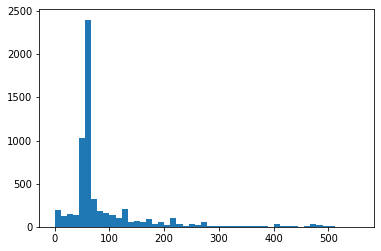

In [ ]:
# Построение гистограммы распределения длин текстов основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
data_summary(df, df.Подотрасль.unique())

Количество записей класса Деятельность по созданию новых информационных технологий: 297
Количество записей класса Металлургия, металлопродукция, производство готовых металлических изделий: 135
Количество записей класса Разработка аппаратно-программных комплексов: 291
Количество записей класса Специализированные информационные системы: 295
Количество записей класса Техническое создание и предоставление доступа к базам данных, в том числе распределенным : 45
Количество записей класса Инженерно-техническое проектирование: 258
Количество записей класса Добыча нефти и природного газа: 112
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 196
Количество записей класса Химическая промышленность: 259
Количество записей класса Производство новых материалов: 253
Количество записей класса Рекомендательные системы, персональные помощники и агрегаторы: 270
Количество записей класса Машиностроение: 265
Количество записей класса Производство лека

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание продукта (с указанием конкретных характеристик)'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 27822
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Альтернативная энергетика' 'Банковская деятельность'
 'Безопасность дорожного движения' 'Беспроводная связь'
 'Высшее и послевузовское образование' 'Геологоразведочные работы'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа' 'Животноводство'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование'
 'Инфраструктура для автотранспорта'
 'Лёгкая промышленность. Товары народного потребления.' 'Машиностроение'
 'Металлургия, металлопродукция, производство готовых металлических изделий'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Передача, распределение и торговля электроэнергией'
 'Пищевая промышленность' 'Проводная связь'
 'Производство биомедицинских клеточных продуктов'
 'Производство лекарственных средств'
 'Производство медицинс

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(5981,)
[4445, 81, 182, 200, 4, 110, 2248, 8060, 43, 4, 110, 2, 314, 4247, 8061, 8062, 57, 182, 200, 39]
(5981, 30000)
[0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
(5981, 53)
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0.]


In [ ]:
# Получение индексов разделения основного набора на обучающую и тестовую выборки
idx_train, idx_test = train_test_split(list(range(len(x_data))),
                                       stratify=y_data,
                                       test_size=TRAIN_TEST_RATIO)

# Разделение в соответствии с полученными индексами
x_train, x_test = x_data[idx_train], x_data[idx_test]
x_train_01, x_test_01 = x_data_01[idx_train], x_data_01[idx_test]
y_train, y_test = y_data[idx_train], y_data[idx_test]

# Проверка результата
print(x_train.shape, x_test.shape)
print(x_train_01.shape, x_test_01.shape)
print(y_train.shape, y_test.shape)

(4784,) (1197,)
(4784, 30000) (1197, 30000)
(4784, 53) (1197, 53)


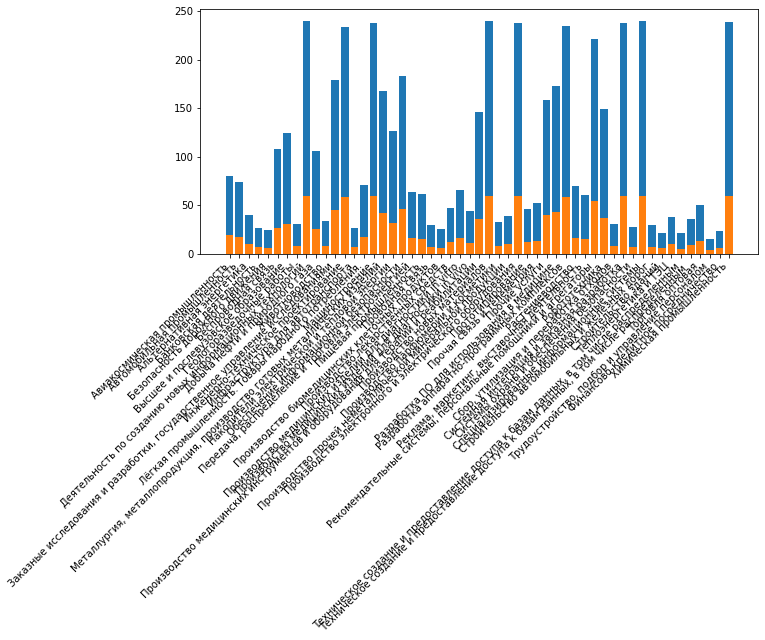

In [ ]:
# Проверка сбалансированности выборок по классам
fig = plt.figure(figsize=(10, 5))
c_train = np.bincount(np.argmax(y_train, axis=1))
c_test = np.bincount(np.argmax(y_test, axis=1))
plt.bar(CLASS_LIST, c_train)
plt.bar(CLASS_LIST, c_test)
fig.autofmt_xdate(rotation=45)
plt.show()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 256)               7680256   
                                                                 
 dropout_19 (Dropout)        (None, 256)               0         
                                                                 
 dense_29 (Dense)            (None, 128)               32896     
                                                                 
 dropout_20 (Dropout)        (None, 128)               0         
                                                                 
 dense_30 (Dense)            (None, 64)                8256      
                                                                 
 dropout_21 (Dropout)        (None, 64)                0         
                                                                 
 dense_31 (Dense)            (None, 53)               

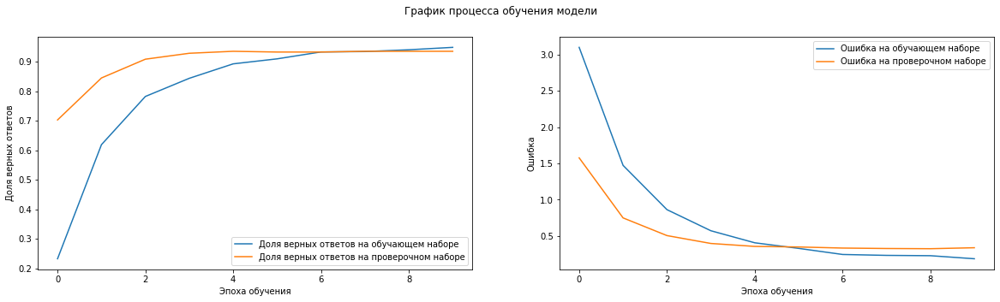

38/38 [==============================] - 0s 3ms/step


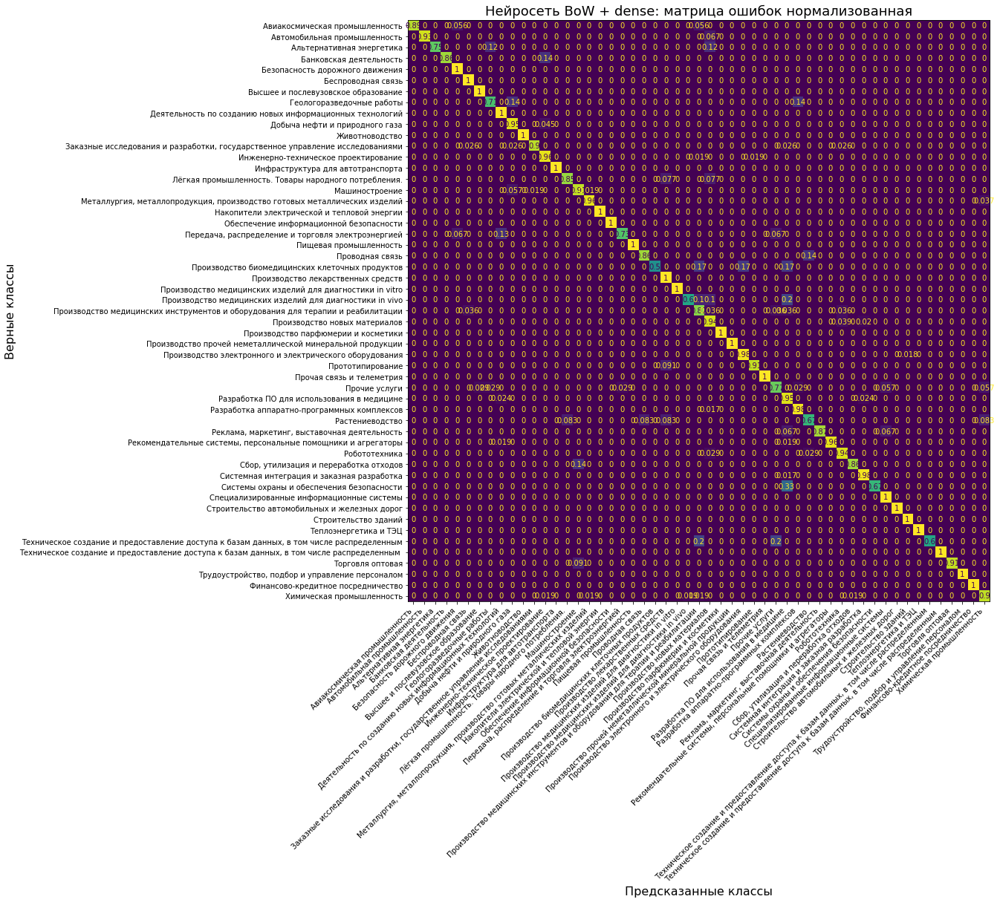

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность  89% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  93% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Альтернативная энергетика  75% сеть отнесла к классу Альтернативная энергетика - ВЕРНО :-)
Класс: Банковская деятельность  86% сеть отнесла к классу Банковская деятельность - ВЕРНО :-)
Класс: Безопасность дорожного движения 100% сеть отнесла к классу Безопасность дорожного движения - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Геологоразведочные работы  71% сеть отнесла к классу Геологоразведочные работы - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных техно

In [ ]:
# Последовательная модель
model_prod_okpd_text_bow_dense = Sequential()
# Входной полносвязный слой
model_prod_okpd_text_bow_dense.add(Dense(256, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_prod_okpd_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_prod_okpd_text_bow_dense.add(Dense(128, activation='relu'))
# Слой регуляризации Dropout
model_prod_okpd_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_prod_okpd_text_bow_dense.add(Dense(64, activation='relu'))
# Слой регуляризации Dropout
model_prod_okpd_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_prod_okpd_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_prod_okpd_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=10,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

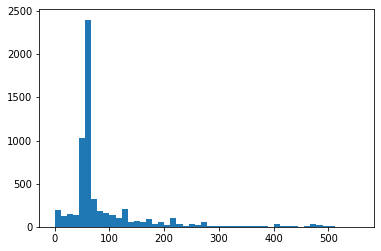

In [ ]:
# Построение гистограммы распределения длин текстов в словах основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Снижение размерности входных данных:
# ограничение длины последовательностей до разумного предела
seq_max_len = 400
x_train_clip = pad_sequences(x_train, maxlen=seq_max_len)
x_test_clip = pad_sequences(x_test, maxlen=seq_max_len)

# Проверка формы результата
print(x_train_clip.shape, x_test_clip.shape)

(4784, 400) (1197, 400)


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 400, 50)           1500000   
                                                                 
 spatial_dropout1d_4 (Spatia  (None, 400, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_4 (Flatten)         (None, 20000)             0         
                                                                 
 batch_normalization_8 (Batc  (None, 20000)            80000     
 hNormalization)                                                 
                                                                 
 dense_32 (Dense)            (None, 64)                1280064   
                                                                 
 dropout_22 (Dropout)        (None, 64)              

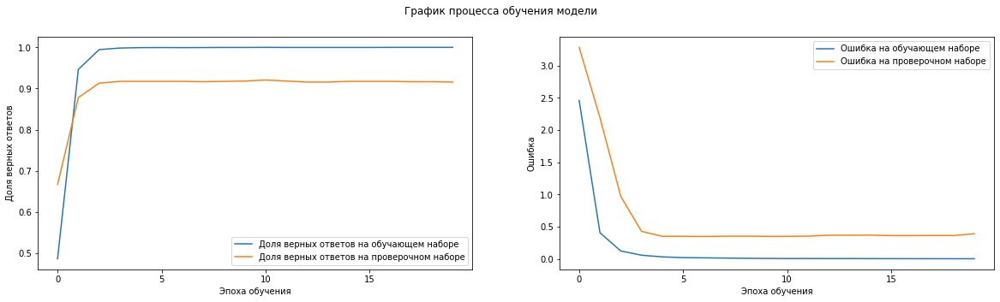

38/38 [==============================] - 0s 2ms/step


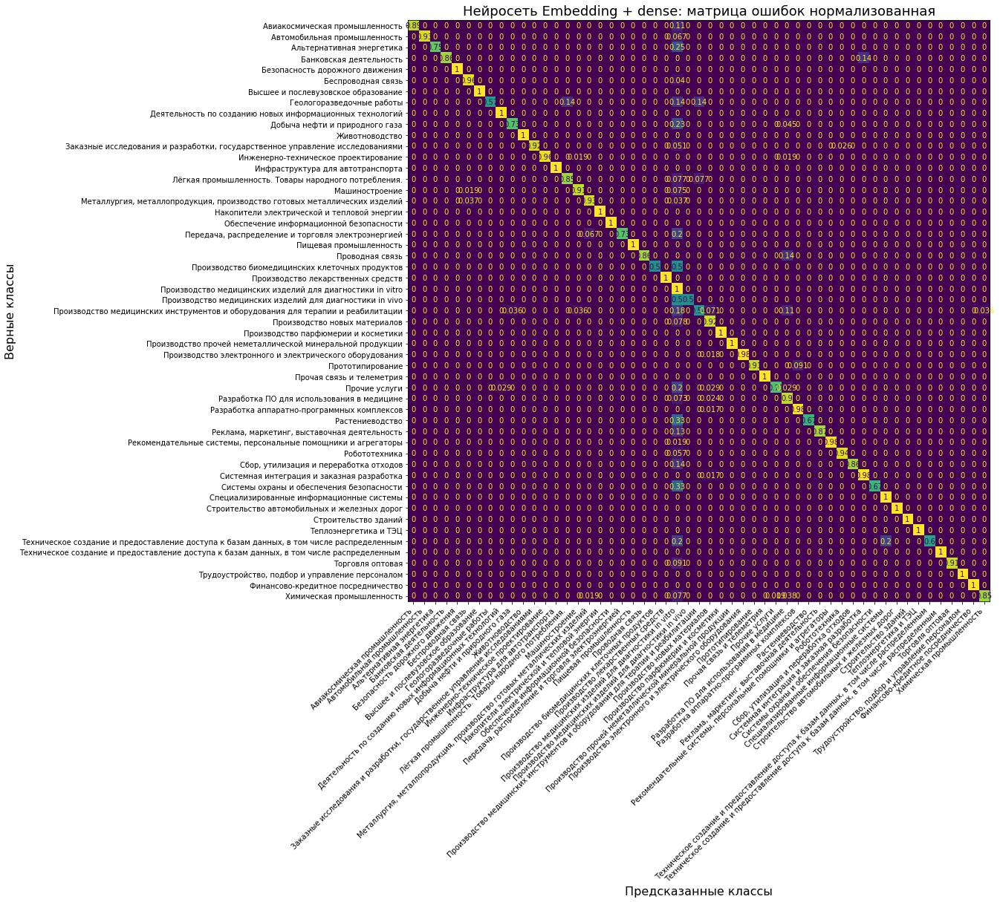

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность  89% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность  93% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Альтернативная энергетика  75% сеть отнесла к классу Альтернативная энергетика - ВЕРНО :-)
Класс: Банковская деятельность  86% сеть отнесла к классу Банковская деятельность - ВЕРНО :-)
Класс: Безопасность дорожного движения 100% сеть отнесла к классу Безопасность дорожного движения - ВЕРНО :-)
Класс: Беспроводная связь    96% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Геологоразведочные работы  57% сеть отнесла к классу Геологоразведочные работы - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных

In [ ]:
# Последовательная модель
model_prod_okpd_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_prod_okpd_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_prod_okpd_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_prod_okpd_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_prod_okpd_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_prod_okpd_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_prod_okpd_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_prod_okpd_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_prod_okpd_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_prod_okpd_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

## Модель Описание компании - подотрасли

In [ ]:
# Функция вывода сводки по распределению данных
def data_summary(df, Подотрасль):
    for cls in Подотрасль:
        print(f'Количество записей класса {cls}: {df[df.Подотрасль == cls].shape[0]}')    

In [ ]:
# Сводка по распределению данных
data_summary(df, df.Подотрасль.unique())

Количество записей класса Растениеводство: 7
Количество записей класса Деятельность по созданию новых информационных технологий: 285
Количество записей класса Металлургия, металлопродукция, производство готовых металлических изделий: 21
Количество записей класса Разработка аппаратно-программных комплексов: 432
Количество записей класса Специализированные информационные системы: 413
Количество записей класса Системы охраны и обеспечения безопасности: 10
Количество записей класса Техническое создание и предоставление доступа к базам данных, в том числе распределенным : 18
Количество записей класса Инженерно-техническое проектирование: 129
Количество записей класса Добыча нефти и природного газа: 58
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 73
Количество записей класса Альтернативная энергетика: 16
Количество записей класса Химическая промышленность: 91
Количество записей класса Производство новых материалов: 70
Количество зап

In [ ]:
# Задание параметров преобразования
VOCAB_SIZE       = 10000                  # Объем словаря для токенизатора
TRAIN_TEST_RATIO = 0.2                    # Доля проверочной выборки в основном наборе

In [ ]:
# Назначение интервала допустимого количества текстов по классу
text_count_interval = [2, 200]

# Фильтрация данных - отбрасываются все данные без категории
# и все классы объемом менее нижней границы разрешенного интервала
class_to_drop = ['нет данных']
for cls in df.Подотрасль.unique():
    if df[df.Подотрасль == cls].shape[0] < text_count_interval[0]:
        class_to_drop.append(cls)

print(f'Удаляются классы: {class_to_drop}')

del_mask = df.Подотрасль.isin(class_to_drop)
df = df[~del_mask]

# По всем оставшимся классам количество примеров ограничивается не более
# верхней границы разрешенного интервала
for cls in df.Подотрасль.unique():
    df = df.drop(df[df.Подотрасль == cls].index[text_count_interval[1]:])

Удаляются классы: ['нет данных']


In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание компании'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
text_data

['"Лаборатория Наносемантика" — ведущий российский разработчик технологий искусственного интеллекта. Компания специализируется на интернет-технологиях и решениях для качественного обслуживания клиентов и разрабатывает виртуальных консультантов, способных имитировать естественную речь. Чат-боты позволяют автоматизировать основную часть взаимодействия с клиентами, привлечь и удержать их внимание, выйти на новую аудиторию и достичь высоких показателей клиентского сервиса. В 2018 году компания запусти',
 '"Лаборатория Наносемантика" — ведущий российский разработчик технологий искусственного интеллекта. Компания специализируется на интернет-технологиях и решениях для качественного обслуживания клиентов и разрабатывает виртуальных консультантов, способных имитировать естественную речь. Чат-боты позволяют автоматизировать основную часть взаимодействия с клиентами, привлечь и удержать их внимание, выйти на новую аудиторию и достичь высоких показателей клиентского сервиса. В 2018 году компания 

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 6338
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Беспроводная связь' 'Высшее и послевузовское образование'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование' 'Машиностроение'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Производство лекарственных средств'
 'Производство медицинских изделий для диагностики in vitro'
 'Производство медицинских инструментов и оборудования для терапии и реабилитации'
 'Производство новых материалов'
 'Производство электронного и электрического оборудования'
 'Разработка ПО для использования в медицине'
 'Разработка аппаратно-программных комплексов'
 'Реклама, маркетинг, выставочная деятельность'
 'Рекомендательные системы, персональные помощники и агрегаторы'
 'Системная интеграция и заказная ра

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(1948,)
[249, 1940, 451, 417, 75, 28, 323, 324, 7, 144, 5, 64, 956, 2, 701, 4, 1941, 233, 57, 2]
(1948, 30000)
[0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
(1948, 23)
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
# Функция компиляции и обучения модели нейронной сети
def compile_train_model(model, 
                        x_train,
                        y_train,
                        x_val,
                        y_val,
                        optimizer='adam',
                        epochs=50,
                        batch_size=128,
                        figsize=(20, 5)):

    # Компиляция модели
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

    # Вывод сводки
    model.summary()

    # Обучение модели с заданными параметрами
    history = model.fit(x_train,
                        y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(x_val, y_val))

    # Вывод графиков точности и ошибки
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle('График процесса обучения модели')
    ax1.plot(history.history['accuracy'], 
               label='Доля верных ответов на обучающем наборе')
    ax1.plot(history.history['val_accuracy'], 
               label='Доля верных ответов на проверочном наборе')
    ax1.xaxis.get_major_locator().set_params(integer=True)
    ax1.set_xlabel('Эпоха обучения')
    ax1.set_ylabel('Доля верных ответов')
    ax1.legend()

    ax2.plot(history.history['loss'], 
               label='Ошибка на обучающем наборе')
    ax2.plot(history.history['val_loss'], 
               label='Ошибка на проверочном наборе')
    ax2.xaxis.get_major_locator().set_params(integer=True)
    ax2.set_xlabel('Эпоха обучения')
    ax2.set_ylabel('Ошибка')
    ax2.legend()
    plt.show()


# Функция вывода результатов оценки модели на заданных данных
def eval_model(model, x, y_true,
               class_labels=[],
               cm_round=3,
               title='',
               figsize=(10, 10)):
    # Вычисление предсказания сети
    y_pred = model.predict(x)
    # Построение матрицы ошибок
    cm = confusion_matrix(np.argmax(y_true, axis=1),
                          np.argmax(y_pred, axis=1),
                          normalize='true')
    # Округление значений матрицы ошибок
    cm = np.around(cm, cm_round)

    # Отрисовка матрицы ошибок
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(f'Нейросеть {title}: матрица ошибок нормализованная', fontsize=18)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax)
    plt.gca().images[-1].colorbar.remove()  # Стирание ненужной цветовой шкалы
    plt.xlabel('Предсказанные классы', fontsize=16)
    plt.ylabel('Верные классы', fontsize=16)
    fig.autofmt_xdate(rotation=45)          # Наклон меток горизонтальной оси при необходимости
    plt.show()    

    print('-'*100)
    print(f'Нейросеть: {title}')

    # Для каждого класса:
    for cls in range(len(class_labels)):
        # Определяется индекс класса с максимальным значением предсказания (уверенности)
        cls_pred = np.argmax(cm[cls])
        # Формируется сообщение о верности или неверности предсказания
        msg = 'ВЕРНО :-)' if cls_pred == cls else 'НЕВЕРНО :-('
        # Выводится текстовая информация о предсказанном классе и значении уверенности
        print('Класс: {:<20} {:3.0f}% сеть отнесла к классу {:<20} - {}'.format(class_labels[cls],
                                                                               100. * cm[cls, cls_pred],
                                                                               class_labels[cls_pred],
                                                                               msg))

    # Средняя точность распознавания определяется как среднее диагональных элементов матрицы ошибок
    print('\nСредняя точность распознавания: {:3.0f}%'.format(100. * cm.diagonal().mean()))


# Совместная функция обучения и оценки модели нейронной сети
def compile_train_eval_model(model, 
                             x_train,
                             y_train,
                             x_test,
                             y_test,
                             class_labels=CLASS_LIST,
                             title='',
                             optimizer='adam',
                             epochs=50,
                             batch_size=128,
                             graph_size=(20, 5),
                             cm_size=(10, 10)):

    # Компиляция и обучение модели на заданных параметрах
    # В качестве проверочных используются тестовые данные
    compile_train_model(model, 
                        x_train, y_train,
                        x_test, y_test,
                        optimizer=optimizer,
                        epochs=epochs,
                        batch_size=batch_size,
                        figsize=graph_size)

    # Вывод результатов оценки работы модели на тестовых данных
    eval_model(model, x_test, y_test, 
               class_labels=class_labels, 
               title=title,
               figsize=cm_size)

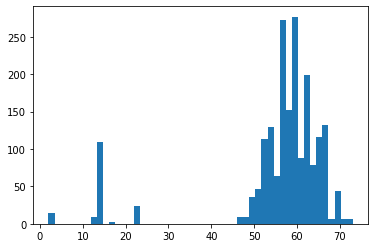

In [ ]:
# Построение гистограммы распределения длин текстов основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
data_summary(df, df.Подотрасль.unique())

Количество записей класса Деятельность по созданию новых информационных технологий: 200
Количество записей класса Разработка аппаратно-программных комплексов: 200
Количество записей класса Специализированные информационные системы: 200
Количество записей класса Инженерно-техническое проектирование: 123
Количество записей класса Добыча нефти и природного газа: 53
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 70
Количество записей класса Химическая промышленность: 84
Количество записей класса Производство новых материалов: 60
Количество записей класса Рекомендательные системы, персональные помощники и агрегаторы: 72
Количество записей класса Машиностроение: 84
Количество записей класса Производство лекарственных средств: 37
Количество записей класса Производство электронного и электрического оборудования: 124
Количество записей класса Беспроводная связь: 40
Количество записей класса Накопители электрической и тепловой энергии: 14

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание продукта (с указанием конкретных характеристик)'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 6595
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Беспроводная связь' 'Высшее и послевузовское образование'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование' 'Машиностроение'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Производство лекарственных средств'
 'Производство медицинских изделий для диагностики in vitro'
 'Производство медицинских инструментов и оборудования для терапии и реабилитации'
 'Производство новых материалов'
 'Производство электронного и электрического оборудования'
 'Разработка ПО для использования в медицине'
 'Разработка аппаратно-программных комплексов'
 'Реклама, маркетинг, выставочная деятельность'
 'Рекомендательные системы, персональные помощники и агрегаторы'
 'Системная интеграция и заказная ра

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(1948,)
[963, 62, 80, 81, 4, 63, 594, 1993, 13, 4, 63, 2, 395, 1375, 1994, 1995, 52, 80, 81, 14]
(1948, 30000)
[0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 0. 1.]
(1948, 23)
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
# Получение индексов разделения основного набора на обучающую и тестовую выборки
idx_train, idx_test = train_test_split(list(range(len(x_data))),
                                       stratify=y_data,
                                       test_size=TRAIN_TEST_RATIO)

# Разделение в соответствии с полученными индексами
x_train, x_test = x_data[idx_train], x_data[idx_test]
x_train_01, x_test_01 = x_data_01[idx_train], x_data_01[idx_test]
y_train, y_test = y_data[idx_train], y_data[idx_test]

# Проверка результата
print(x_train.shape, x_test.shape)
print(x_train_01.shape, x_test_01.shape)
print(y_train.shape, y_test.shape)

(1558,) (390,)
(1558, 30000) (390, 30000)
(1558, 23) (390, 23)


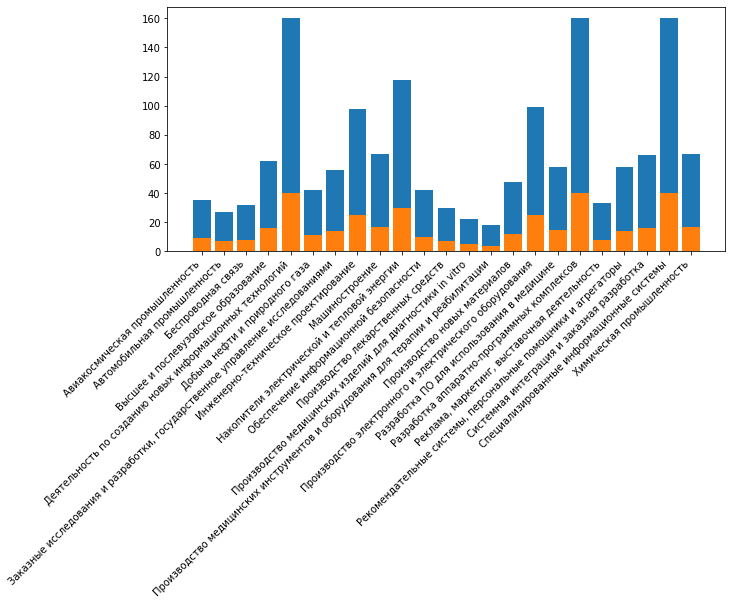

In [ ]:
# Проверка сбалансированности выборок по классам
fig = plt.figure(figsize=(10, 5))
c_train = np.bincount(np.argmax(y_train, axis=1))
c_test = np.bincount(np.argmax(y_test, axis=1))
plt.bar(CLASS_LIST, c_train)
plt.bar(CLASS_LIST, c_test)
fig.autofmt_xdate(rotation=45)
plt.show()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               7680256   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 23)                1

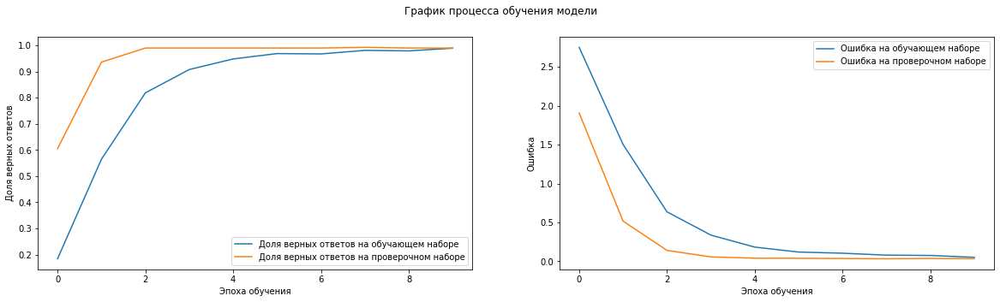

13/13 [==============================] - 0s 13ms/step


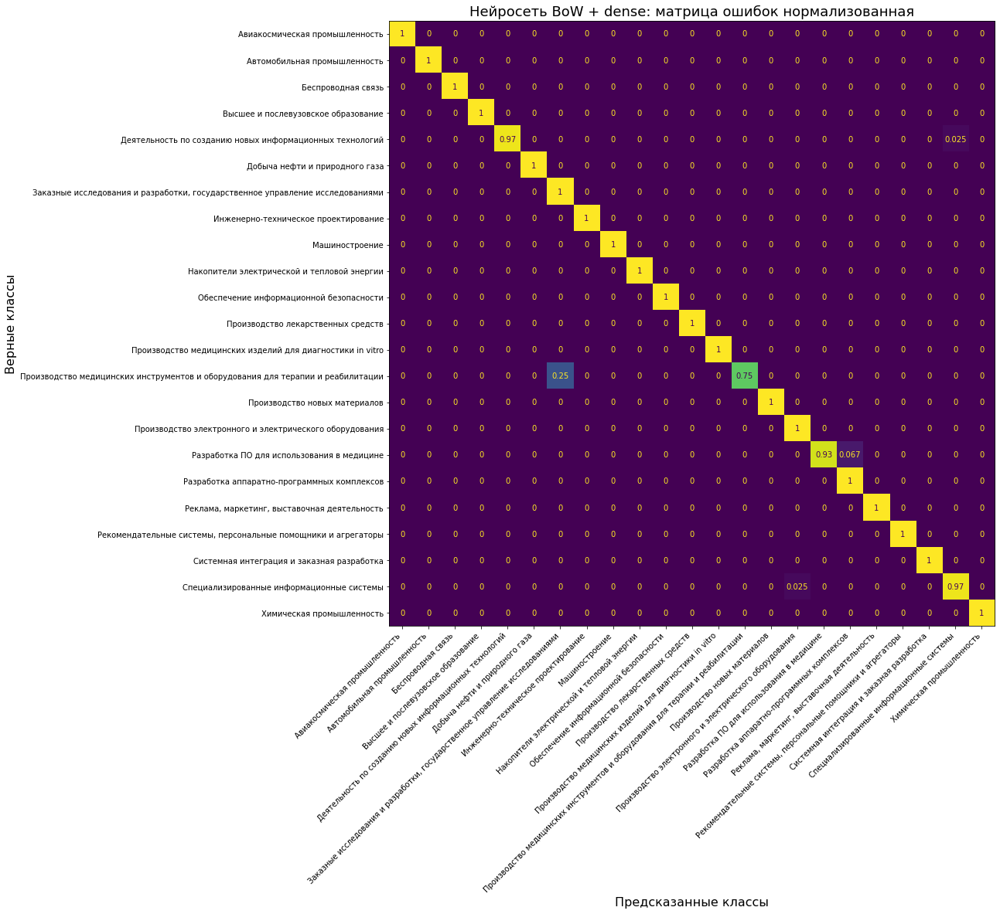

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность 100% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность 100% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  98% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа 100% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями 100% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_com_otr_text_bow_dense = Sequential()
# Входной полносвязный слой
model_com_otr_text_bow_dense.add(Dense(256, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_com_otr_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_com_otr_text_bow_dense.add(Dense(128, activation='relu'))
# Слой регуляризации Dropout
model_com_otr_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_com_otr_text_bow_dense.add(Dense(64, activation='relu'))
# Слой регуляризации Dropout
model_com_otr_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_com_otr_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_com_otr_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=10,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 256)               7680256   
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dropout_5 (Dropout)         (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 23)               

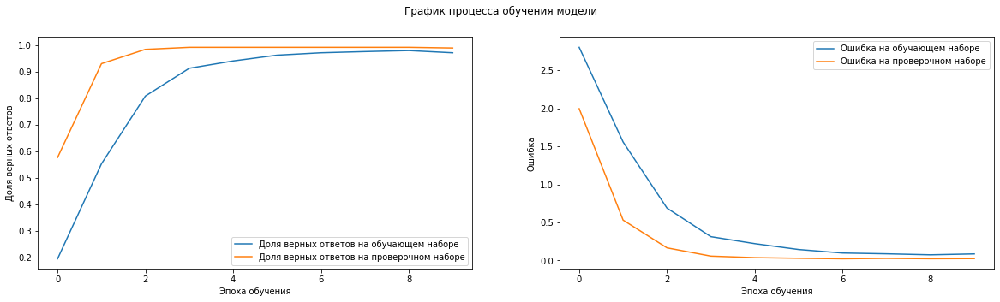

13/13 [==============================] - 0s 14ms/step


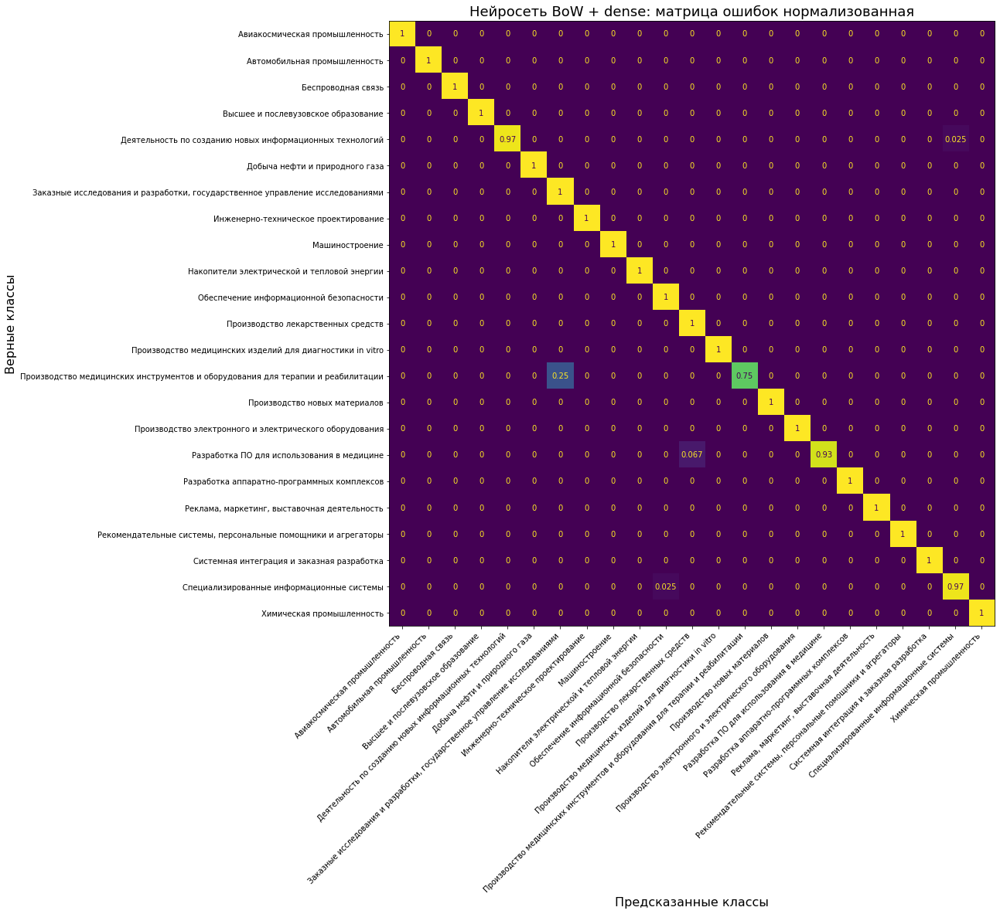

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность 100% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность 100% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий  98% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа 100% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями 100% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_com_otr_text_bow_dense = Sequential()
# Входной полносвязный слой
model_com_otr_text_bow_dense.add(Dense(256, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_com_otr_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_com_otr_text_bow_dense.add(Dense(128, activation='relu'))
# Слой регуляризации Dropout
model_com_otr_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_com_otr_text_bow_dense.add(Dense(64, activation='relu'))
# Слой регуляризации Dropout
model_com_otr_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_com_otr_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_com_otr_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=10,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

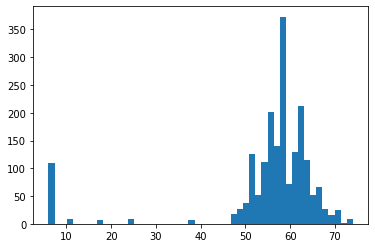

In [ ]:
# Построение гистограммы распределения длин текстов в словах основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Снижение размерности входных данных:
# ограничение длины последовательностей до разумного предела
seq_max_len = 400
x_train_clip = pad_sequences(x_train, maxlen=seq_max_len)
x_test_clip = pad_sequences(x_test, maxlen=seq_max_len)

# Проверка формы результата
print(x_train_clip.shape, x_test_clip.shape)

(1558, 400) (390, 400)


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 400, 50)           1500000   
                                                                 
 spatial_dropout1d (SpatialD  (None, 400, 50)          0         
 ropout1D)                                                       
                                                                 
 flatten (Flatten)           (None, 20000)             0         
                                                                 
 batch_normalization (BatchN  (None, 20000)            80000     
 ormalization)                                                   
                                                                 
 dense_8 (Dense)             (None, 64)                1280064   
                                                                 
 dropout_6 (Dropout)         (None, 64)               

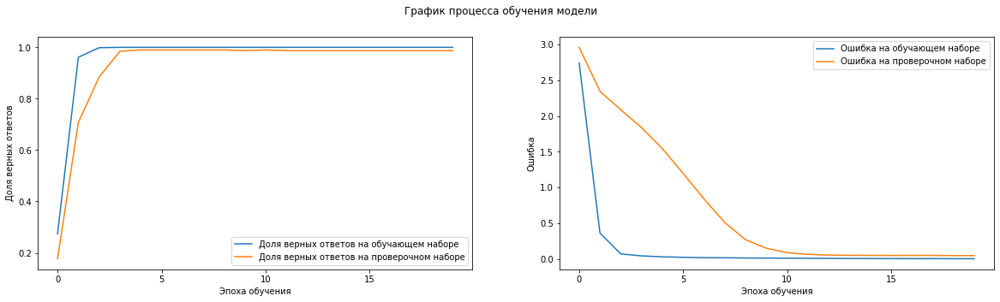

13/13 [==============================] - 0s 4ms/step


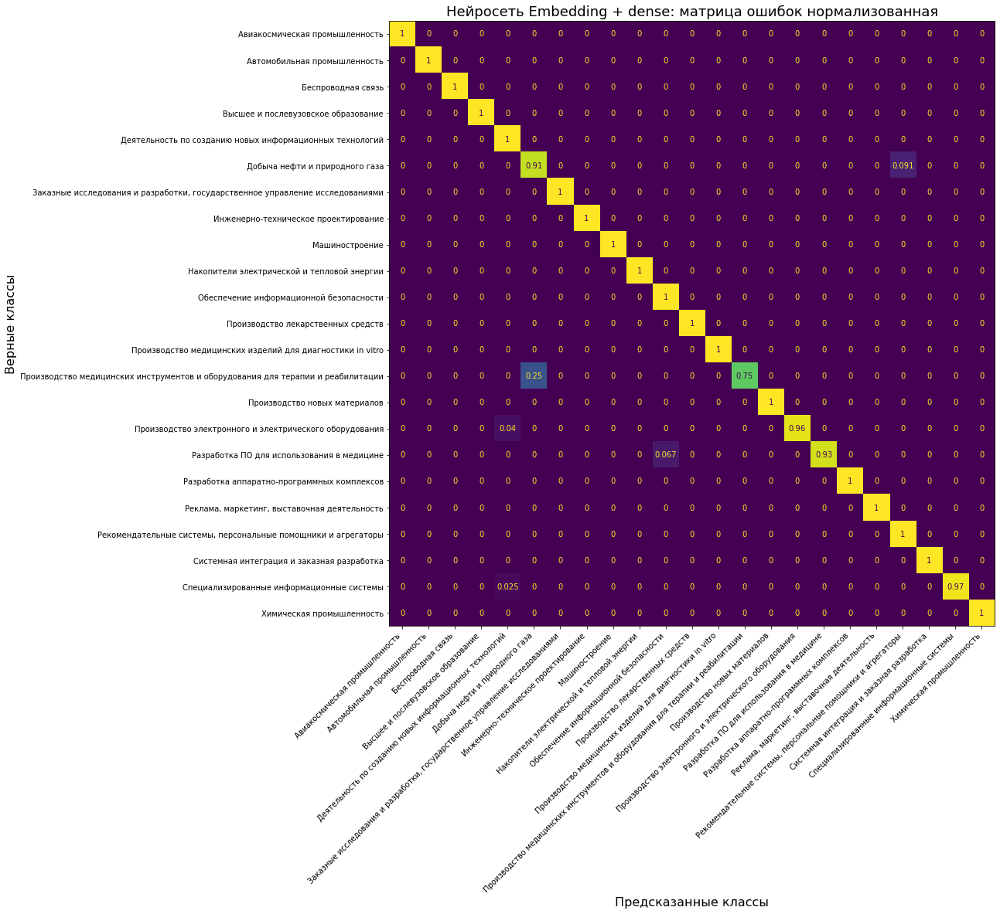

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность 100% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность 100% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий 100% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  91% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями 100% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследова

In [ ]:
# Последовательная модель
model_com_otr_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_com_otr_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_com_otr_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_com_otr_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_com_otr_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_com_otr_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_com_otr_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_com_otr_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_com_otr_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_com_otr_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

## **Модель описание компании технологии 3 уровня**

In [ ]:
# Функция вывода сводки по распределению данных
def data_summary(df, Технология3):
    for cls in Технология3:
        print(f'Количество записей класса {cls}: {df[df.Технология3 == cls].shape[0]}')    

In [ ]:
# Сводка по распределению данных
data_summary(df, df.Технология3.unique())

Количество записей класса Обработка естественных языков (перевод, классификация, кластеризация и другое): 15
Количество записей класса Интерфейсы обмена большими данными: 62
Количество записей класса Синтез образовательного контента: 21
Количество записей класса Статистическая обработка данных: 54
Количество записей класса Технологии сварки и пайки: 28
Количество записей класса Регистрация и преобразование акустических сигналов: 34
Количество записей класса Моделирование химических процессов: 6
Количество записей класса Системы медицинской диагностики, лечения и реабилитации, включая телемедицинские системы: 18
Количество записей класса Новые технологии сепарации веществ и фракций, включая газо- и водоочистку: 9
Количество записей класса Интегральные фотонные схемы: 3
Количество записей класса Совершенствование каталитических процессов: 9
Количество записей класса Регистрация и преобразование оптических сигналов: 39
Количество записей класса Создание новых веществ: 43
Количество записе

In [ ]:
# Задание параметров преобразования
VOCAB_SIZE       = 30000                  # Объем словаря для токенизатора
TRAIN_TEST_RATIO = 0.4                    # Доля проверочной выборки в основном наборе

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание компании'].tolist()
class_data = df.Технология3.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 6338
Список классов: ['Аппаратно-программные комплексы для интеллектуальных электрических сетей (smart grid, microgrid)'
 'Биоинформатика' 'Биотехнология клеточных культур'
 'Биохимическое воздействие'
 'Вакуумная, компрессорная техника и пневмосистемы'
 'Гидравлические машины, гидропневмоагрегаты'
 'Другие технологии накопления энергии'
 'Защита каналов передачи информации, криптография (Cryptography)'
 'Зеленая химия' 'Изменение объемных свойств '
 'Изменение поверхностных свойств ' 'Иммунологические методы'
 'Инструменты для взаимодействия программ (API)'
 'Интегральные схемы микро- и нано- электроники'
 'Интегральные фотонные схемы' 'Интерфейсы обмена большими данными'
 'Интерфейсы обратной связи'
 'Исследования на живых организмах при экстремальных условиях'
 'Исследования на клеточных культурах'
 'Исследования на модельных животных' 'Комплексные методы измерения'
 'Компьютерная логика и рассуждение, когнитивные вычисления'
 'Компьютерное зрение и обработка изображ

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(1948,)
[249, 1940, 451, 417, 75, 28, 323, 324, 7, 144, 5, 64, 956, 2, 701, 4, 1941, 233, 57, 2]
(1948, 30000)
[0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
(1948, 103)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
# Функция компиляции и обучения модели нейронной сети
def compile_train_model(model, 
                        x_train,
                        y_train,
                        x_val,
                        y_val,
                        optimizer='adam',
                        epochs=50,
                        batch_size=128,
                        figsize=(20, 5)):

    # Компиляция модели
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

    # Вывод сводки
    model.summary()

    # Обучение модели с заданными параметрами
    history = model.fit(x_train,
                        y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(x_val, y_val))

    # Вывод графиков точности и ошибки
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle('График процесса обучения модели')
    ax1.plot(history.history['accuracy'], 
               label='Доля верных ответов на обучающем наборе')
    ax1.plot(history.history['val_accuracy'], 
               label='Доля верных ответов на проверочном наборе')
    ax1.xaxis.get_major_locator().set_params(integer=True)
    ax1.set_xlabel('Эпоха обучения')
    ax1.set_ylabel('Доля верных ответов')
    ax1.legend()

    ax2.plot(history.history['loss'], 
               label='Ошибка на обучающем наборе')
    ax2.plot(history.history['val_loss'], 
               label='Ошибка на проверочном наборе')
    ax2.xaxis.get_major_locator().set_params(integer=True)
    ax2.set_xlabel('Эпоха обучения')
    ax2.set_ylabel('Ошибка')
    ax2.legend()
    plt.show()


# Функция вывода результатов оценки модели на заданных данных
def eval_model(model, x, y_true,
               class_labels=[],
               cm_round=3,
               title='',
               figsize=(10, 10)):
    # Вычисление предсказания сети
    y_pred = model.predict(x)
    # Построение матрицы ошибок
    cm = confusion_matrix(np.argmax(y_true, axis=1),
                          np.argmax(y_pred, axis=1),
                          normalize='true')
    # Округление значений матрицы ошибок
    cm = np.around(cm, cm_round)

    # Отрисовка матрицы ошибок
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_title(f'Нейросеть {title}: матрица ошибок нормализованная', fontsize=18)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax)
    plt.gca().images[-1].colorbar.remove()  # Стирание ненужной цветовой шкалы
    plt.xlabel('Предсказанные классы', fontsize=16)
    plt.ylabel('Верные классы', fontsize=16)
    fig.autofmt_xdate(rotation=45)          # Наклон меток горизонтальной оси при необходимости
    plt.show()    

    print('-'*100)
    print(f'Нейросеть: {title}')

    # Для каждого класса:
    for cls in range(len(class_labels)):
        # Определяется индекс класса с максимальным значением предсказания (уверенности)
        cls_pred = np.argmax(cm[cls])
        # Формируется сообщение о верности или неверности предсказания
        msg = 'ВЕРНО :-)' if cls_pred == cls else 'НЕВЕРНО :-('
        # Выводится текстовая информация о предсказанном классе и значении уверенности
        print('Класс: {:<20} {:3.0f}% сеть отнесла к классу {:<20} - {}'.format(class_labels[cls],
                                                                               100. * cm[cls, cls_pred],
                                                                               class_labels[cls_pred],
                                                                               msg))

    # Средняя точность распознавания определяется как среднее диагональных элементов матрицы ошибок
    print('\nСредняя точность распознавания: {:3.0f}%'.format(100. * cm.diagonal().mean()))


# Совместная функция обучения и оценки модели нейронной сети
def compile_train_eval_model(model, 
                             x_train,
                             y_train,
                             x_test,
                             y_test,
                             class_labels=CLASS_LIST,
                             title='',
                             optimizer='adam',
                             epochs=50,
                             batch_size=128,
                             graph_size=(20, 5),
                             cm_size=(10, 10)):

    # Компиляция и обучение модели на заданных параметрах
    # В качестве проверочных используются тестовые данные
    compile_train_model(model, 
                        x_train, y_train,
                        x_test, y_test,
                        optimizer=optimizer,
                        epochs=epochs,
                        batch_size=batch_size,
                        figsize=graph_size)

    # Вывод результатов оценки работы модели на тестовых данных
    eval_model(model, x_test, y_test, 
               class_labels=class_labels, 
               title=title,
               figsize=cm_size)

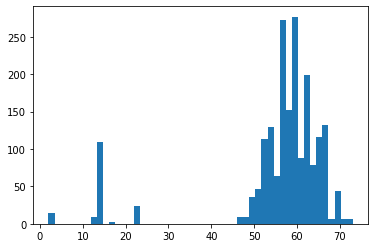

In [ ]:
# Построение гистограммы распределения длин текстов основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Назначение интервала допустимого количества текстов по классу
text_count_interval = [5, 200]

# Фильтрация данных - отбрасываются все данные без категории
# и все классы объемом менее нижней границы разрешенного интервала
# class_to_drop = ['нет данных']
for cls in df.Технология3.unique():
    if df[df.Технология3 == cls].shape[0] < text_count_interval[0]:
        class_to_drop.append(cls)

print(f'Удаляются классы: {class_to_drop}')

del_mask = df.Технология3.isin(class_to_drop)
df = df[~del_mask]

# По всем оставшимся классам количество примеров ограничивается не более
# верхней границы разрешенного интервала
for cls in df.Технология3.unique():
    df = df.drop(df[df.Технология3 == cls].index[text_count_interval[1]:])

Удаляются классы: ['нет данных', 'Интегральные фотонные схемы', 'Биотехнология клеточных культур', 'Моделирование биологических систем', 'Технологии сетевой безопасности (Network security)', 'Технологии передачи сигналов в мозг', 'Технологии захвата движений в VR/АR и фотограмметрии', 'Технологии нефтепереработки и нефтехимии', 'Формирование карт, дашбордов и иных комплексных представлений информации', 'Процессы органического синтеза', 'Механические воздействия', 'Лазеры и мазеры, и системы на их основе', 'Электромагнитная обработка  материалов и изделий', 'Сельскохозяйственный инжиниринг', 'Синтез графической и мультимедийной информации']


In [ ]:
data_summary(df, df.Подотрасль.unique())

Количество записей класса Деятельность по созданию новых информационных технологий: 0
Количество записей класса Разработка аппаратно-программных комплексов: 0
Количество записей класса Специализированные информационные системы: 0
Количество записей класса Инженерно-техническое проектирование: 0
Количество записей класса Добыча нефти и природного газа: 0
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 0
Количество записей класса Химическая промышленность: 0
Количество записей класса Производство новых материалов: 0
Количество записей класса Рекомендательные системы, персональные помощники и агрегаторы: 0
Количество записей класса Машиностроение: 0
Количество записей класса Производство лекарственных средств: 0
Количество записей класса Производство электронного и электрического оборудования: 0
Количество записей класса Беспроводная связь: 0
Количество записей класса Накопители электрической и тепловой энергии: 0
Количество записей

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание компании'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 6055
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Беспроводная связь' 'Высшее и послевузовское образование'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование' 'Машиностроение'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Производство лекарственных средств'
 'Производство медицинских изделий для диагностики in vitro'
 'Производство медицинских инструментов и оборудования для терапии и реабилитации'
 'Производство новых материалов'
 'Производство электронного и электрического оборудования'
 'Разработка ПО для использования в медицине'
 'Разработка аппаратно-программных комплексов'
 'Реклама, маркетинг, выставочная деятельность'
 'Рекомендательные системы, персональные помощники и агрегаторы'
 'Системная интеграция и заказная ра

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(1912,)
[246, 1897, 497, 416, 79, 26, 315, 316, 7, 146, 5, 62, 938, 2, 681, 4, 1898, 228, 55, 2]
(1912, 30000)
[0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
(1912, 23)
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
# Получение индексов разделения основного набора на обучающую и тестовую выборки
idx_train, idx_test = train_test_split(list(range(len(x_data))),
                                       stratify=y_data,
                                       test_size=TRAIN_TEST_RATIO)

# Разделение в соответствии с полученными индексами
x_train, x_test = x_data[idx_train], x_data[idx_test]
x_train_01, x_test_01 = x_data_01[idx_train], x_data_01[idx_test]
y_train, y_test = y_data[idx_train], y_data[idx_test]

# Проверка результата
print(x_train.shape, x_test.shape)
print(x_train_01.shape, x_test_01.shape)
print(y_train.shape, y_test.shape)

(1147,) (765,)
(1147, 30000) (765, 30000)
(1147, 23) (765, 23)


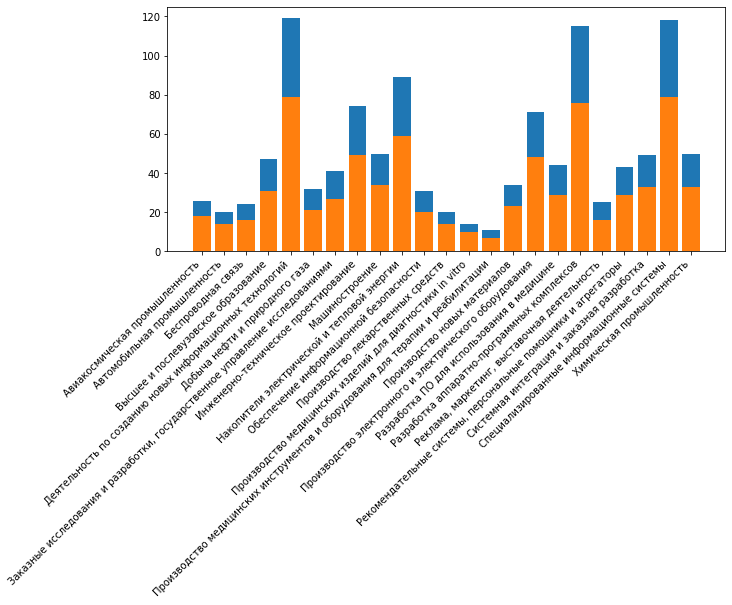

In [ ]:
# Проверка сбалансированности выборок по классам
fig = plt.figure(figsize=(10, 5))
c_train = np.bincount(np.argmax(y_train, axis=1))
c_test = np.bincount(np.argmax(y_test, axis=1))
plt.bar(CLASS_LIST, c_train)
plt.bar(CLASS_LIST, c_test)
fig.autofmt_xdate(rotation=45)
plt.show()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 100)               3000100   
                                                                 
 dropout_7 (Dropout)         (None, 100)               0         
                                                                 
 dense_11 (Dense)            (None, 100)               10100     
                                                                 
 dropout_8 (Dropout)         (None, 100)               0         
                                                                 
 dense_12 (Dense)            (None, 100)               10100     
                                                                 
 dropout_9 (Dropout)         (None, 100)               0         
                                                                 
 dense_13 (Dense)            (None, 23)               

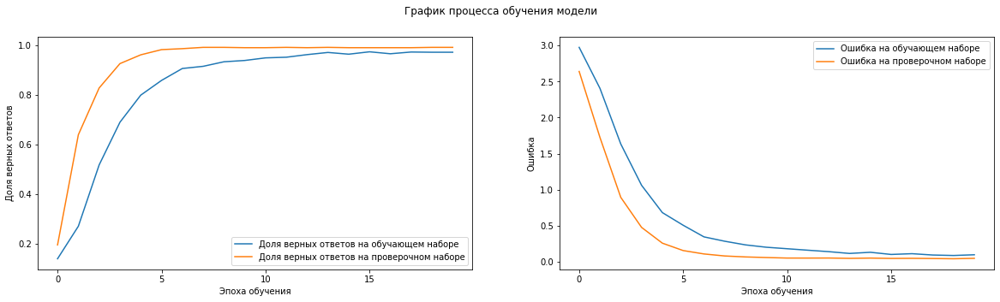

24/24 [==============================] - 0s 9ms/step


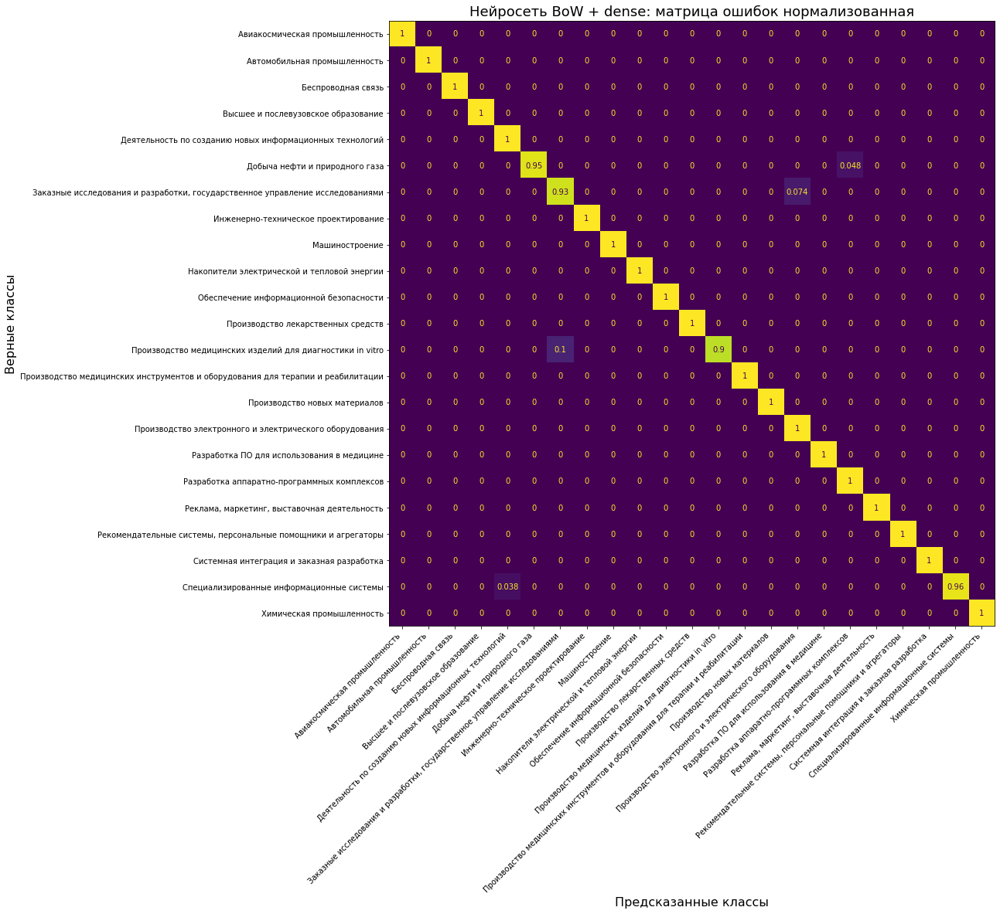

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность 100% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность 100% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий 100% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  95% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  93% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_com_tech3_text_bow_dense = Sequential()
# Входной полносвязный слой
model_com_tech3_text_bow_dense.add(Dense(100, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_com_tech3_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_com_tech3_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_com_tech3_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_com_tech3_text_bow_dense.add(Dense(100, activation='relu'))
# Слой регуляризации Dropout
model_com_tech3_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_com_tech3_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_com_tech3_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

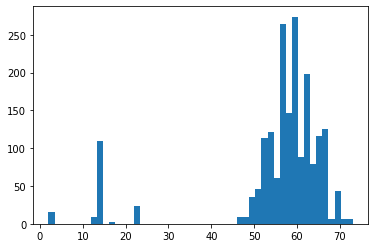

In [ ]:
# Построение гистограммы распределения длин текстов в словах основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Снижение размерности входных данных:
# ограничение длины последовательностей до разумного предела
seq_max_len = 200
x_train_clip = pad_sequences(x_train, maxlen=seq_max_len)
x_test_clip = pad_sequences(x_test, maxlen=seq_max_len)

# Проверка формы результата
print(x_train_clip.shape, x_test_clip.shape)

(1147, 200) (765, 200)


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 200, 50)           1500000   
                                                                 
 spatial_dropout1d_1 (Spatia  (None, 200, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_1 (Flatten)         (None, 10000)             0         
                                                                 
 batch_normalization_2 (Batc  (None, 10000)            40000     
 hNormalization)                                                 
                                                                 
 dense_14 (Dense)            (None, 64)                640064    
                                                                 
 dropout_10 (Dropout)        (None, 64)               

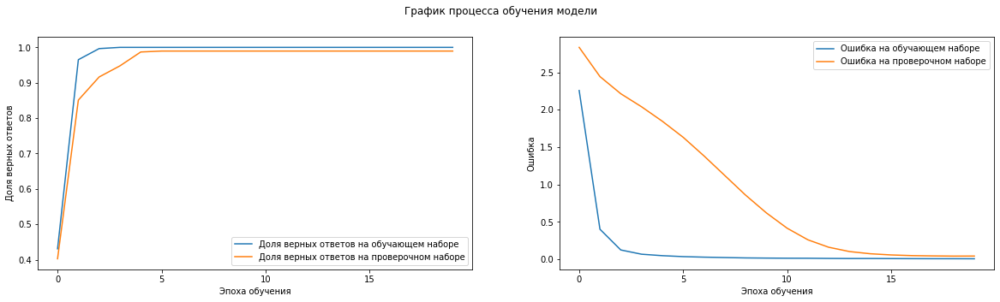

24/24 [==============================] - 0s 4ms/step


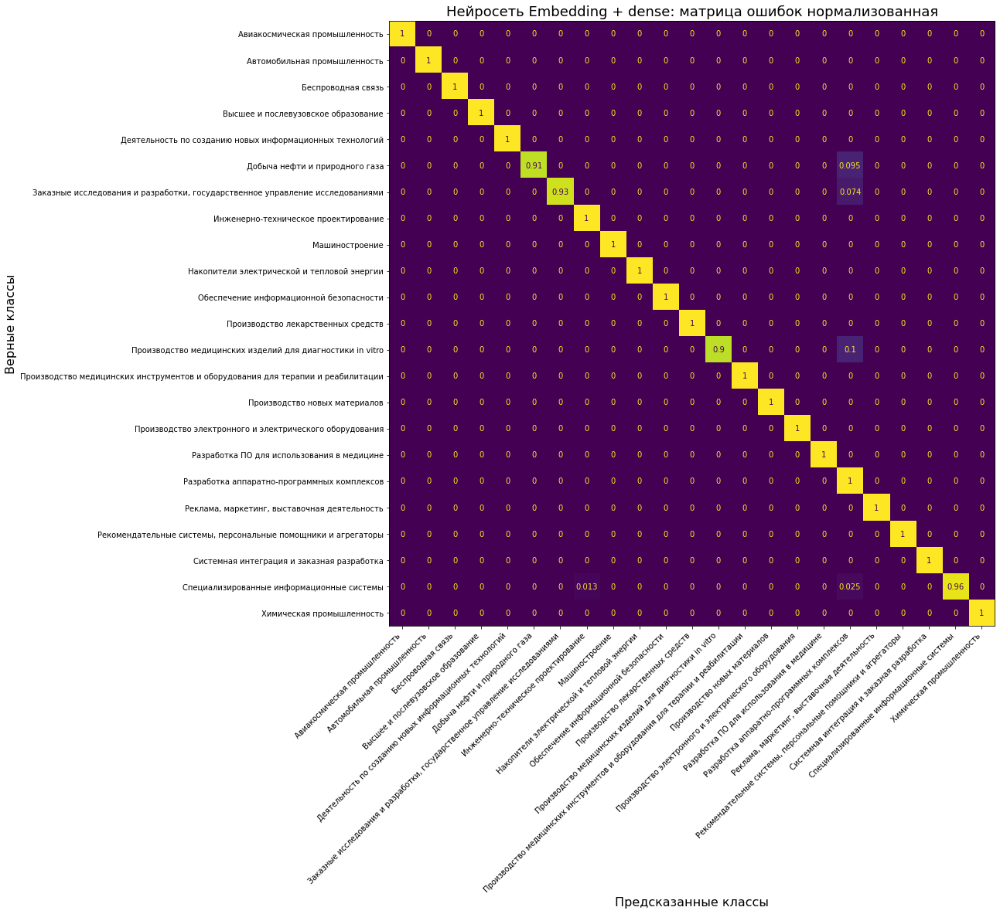

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность 100% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность 100% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий 100% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа  90% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями  93% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследова

In [ ]:
# Последовательная модель
model_com_tech3_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_com_tech3_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_com_tech3_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_com_tech3_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_com_tech3_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_com_tech3_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_com_tech3_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_com_tech3_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_com_tech3_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_com_tech3_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')

## **Модель описание компании ОКПД**

In [ ]:
# Функция вывода сводки по распределению данных
def data_summary(df, ВидОКПД2):
    for cls in ВидОКПД2:
        print(f'Количество записей класса {cls}: {df[df.Подотрасль == cls].shape[0]}')  


In [ ]:
# Сводка по распределению данных
data_summary(df, df.КатегорияОКПД2.unique())

Количество записей класса 63.11.19.000. Услуги прочие по размещению и предоставлению инфраструктуры информационных технологий: 0
Количество записей класса 62.01.11.000. Услуги по проектированию и разработке информационных технологий для прикладных задач и тестированию программного обеспечения: 0
Количество записей класса 85.12.11.000. Услуги в области дистанционного общего начального образования в информационно-коммуникационной сети Интернет: 0
Количество записей класса 62.03.11.000. Услуги по управлению сетями: 0
Количество записей класса 27.51.24.190. Приборы электронагревательные бытовые прочие, не включенные в другие группировки: 0
Количество записей класса 09.10.12.190. Услуги, связанные с добычей нефти, газового конденсата и горючего природного газа, прочие: 0
Количество записей класса 72.19.50.000. Работы оригинальные научных исследований и экспериментальных разработок в области естественных и технических наук, кроме биотехнологии: 0
Количество записей класса 59.12.11.000. Услуг

In [ ]:
# Задание параметров преобразования
VOCAB_SIZE       = 30000                  # Объем словаря для токенизатора
TRAIN_TEST_RATIO = 0.2                    # Доля проверочной выборки в основном наборе

In [ ]:
# Назначение интервала допустимого количества текстов по классу
text_count_interval = [5, 300]

# Фильтрация данных - отбрасываются все данные без категории
# и все классы объемом менее нижней границы разрешенного интервала
class_to_drop = ['нет данных']
for cls in df.КатегорияОКПД2.unique():
    if df[df.КатегорияОКПД2 == cls].shape[0] < text_count_interval[0]:
        class_to_drop.append(cls)

print(f'Удаляются классы: {class_to_drop}')

del_mask = df.КатегорияОКПД2.isin(class_to_drop)
df = df[~del_mask]

# По всем оставшимся классам количество примеров ограничивается не более
# верхней границы разрешенного интервала
for cls in df.КатегорияОКПД2.unique():
    df = df.drop(df[df.Подотрасль == cls].index[text_count_interval[1]:])

Удаляются классы: ['нет данных', '26.60.13.190. Оборудование для электротерапии прочее, не включенное в другие группировки', '62.01.29.000. Оригиналы программного обеспечения прочие']


In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание компании'].tolist()
class_data = df.КатегорияОКПД2.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 6027
Список классов: ['09.10.11.140. Услуги геолого-разведочные, связанные с добычей нефти и газа'
 '09.10.12.190. Услуги, связанные с добычей нефти, газового конденсата и горючего природного газа, прочие'
 '10.89.13.110. Дрожжи (активные и неактивные)' '20.16.10.110. Полиэтилен'
 '20.16.40.130. Смолы эпоксидные в первичных формах'
 '20.16.57.130. Эластомеры кремнийорганические (каучуки)'
 '20.41.31.210. Вещества органические поверхностно-активные и средства, используемые в качестве мыла'
 '20.41.32.110. Средства моющие'
 '20.42.17.120. Средства для волос прочие, не включенные в другие группировки'
 '20.59.41.000. Материалы смазочные'
 '20.59.52.190. Реагенты сложные диагностические или лабораторные, не включенные в другие группировки'
 '20.59.53.120. Соединения химические легированные, используемые в электронике'
 '20.59.59.900. Продукты разные химические прочие, не включенные в другие группировки'
 '21.20.23.110. Реагенты диагностические'
 '21.20.23.190. Препараты фар

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(1906,)
[245, 1891, 496, 415, 79, 26, 315, 316, 7, 145, 5, 62, 934, 2, 679, 4, 1892, 227, 55, 2]
(1906, 30000)
[0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
(1906, 129)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0.]


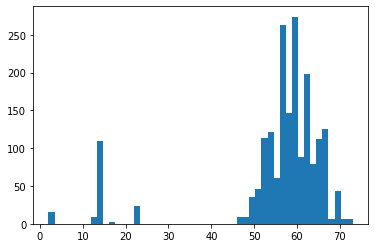

In [ ]:
# Построение гистограммы распределения длин текстов основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
data_summary(df, df.Подотрасль.unique())

Количество записей класса Деятельность по созданию новых информационных технологий: 198
Количество записей класса Разработка аппаратно-программных комплексов: 191
Количество записей класса Специализированные информационные системы: 197
Количество записей класса Инженерно-техническое проектирование: 123
Количество записей класса Добыча нефти и природного газа: 53
Количество записей класса Заказные исследования и разработки, государственное управление исследованиями: 68
Количество записей класса Химическая промышленность: 83
Количество записей класса Производство новых материалов: 57
Количество записей класса Рекомендательные системы, персональные помощники и агрегаторы: 72
Количество записей класса Машиностроение: 84
Количество записей класса Производство лекарственных средств: 34
Количество записей класса Производство электронного и электрического оборудования: 119
Количество записей класса Беспроводная связь: 40
Количество записей класса Накопители электрической и тепловой энергии: 14

In [ ]:
# Извлечение всех записей-текстов обращений и их меток классов
text_data = df['Описание компании'].tolist()
class_data = df.Подотрасль.tolist()

In [ ]:
# Токенизация и построение частотного словаря по обучающим текстам
# Используется встроенный в Keras токенизатор для разбиения текста и построения частотного словаря
tokenizer = Tokenizer(num_words=VOCAB_SIZE, filters='!"#$%&()*+,-–—./…:;<=>?@[\\]^_`{|}~«»\t\n\xa0\ufeff', lower=True, split=' ', oov_token='неизвестное_слово', char_level=False)

# Использованы параметры:
# num_words   - объем словаря
# filters     - убираемые из текста ненужные символы
# lower       - приведение слов к нижнему регистру
# split       - разделитель слов
# char_level  - указание разделять по словам, а не по единичным символам
# oov_token   - токен для слов, которые не вошли в словарь

# Построение частотного словаря по обучающим текстам
tokenizer.fit_on_texts(text_data)

# Построение словаря в виде пар слово - индекс
items = list(tokenizer.word_index.items())

In [ ]:
# Кодирование меток классов индексами (числами)
encoder = LabelEncoder()
class_labels = encoder.fit_transform(class_data)

CLASS_LIST = encoder.classes_
CLASS_COUNT = len(CLASS_LIST)

print(f'Размер словаря: {len(items)}')
print(f'Список классов: {CLASS_LIST}')
print(f'Всего классов: {CLASS_COUNT}')
print(f'Форма выходных данных: {class_labels.shape}')
print(f'Пример числовых меток классов: {class_labels[:10]}')

Размер словаря: 6027
Список классов: ['Авиакосмическая промышленность' 'Автомобильная промышленность'
 'Беспроводная связь' 'Высшее и послевузовское образование'
 'Деятельность по созданию новых информационных технологий'
 'Добыча нефти и природного газа'
 'Заказные исследования и разработки, государственное управление исследованиями'
 'Инженерно-техническое проектирование' 'Машиностроение'
 'Накопители электрической и тепловой энергии'
 'Обеспечение информационной безопасности'
 'Производство лекарственных средств'
 'Производство медицинских изделий для диагностики in vitro'
 'Производство медицинских инструментов и оборудования для терапии и реабилитации'
 'Производство новых материалов'
 'Производство электронного и электрического оборудования'
 'Разработка ПО для использования в медицине'
 'Разработка аппаратно-программных комплексов'
 'Реклама, маркетинг, выставочная деятельность'
 'Рекомендательные системы, персональные помощники и агрегаторы'
 'Системная интеграция и заказная ра

In [ ]:
# Преобразование входных текстов в последовательности индексов (для архитектур с embedding)
# Применено приведение к массиву объектов для дальнейшего разделения на выборки
x_data = np.array(tokenizer.texts_to_sequences(text_data), dtype=object)
# Вывод формы и примера данных
print(x_data.shape) 
print(x_data[0][:20])

# Преобразование входных текстов в разреженную матрицу из векторов Bag of Words
x_data_01 = tokenizer.texts_to_matrix(text_data)
# Вывод формы и примера данных
print(x_data_01.shape) 
print(x_data_01[0, :20])

# Преобразование меток класса к векторам one hot encoding
y_data = utils.to_categorical(class_labels, CLASS_COUNT)
# Вывод формы и примера данных
print(y_data.shape)
print(y_data[0])

(1906,)
[245, 1891, 496, 415, 79, 26, 315, 316, 7, 145, 5, 62, 934, 2, 679, 4, 1892, 227, 55, 2]
(1906, 30000)
[0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
(1906, 23)
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
# Получение индексов разделения основного набора на обучающую и тестовую выборки
idx_train, idx_test = train_test_split(list(range(len(x_data))),
                                       stratify=y_data,
                                       test_size=TRAIN_TEST_RATIO)

# Разделение в соответствии с полученными индексами
x_train, x_test = x_data[idx_train], x_data[idx_test]
x_train_01, x_test_01 = x_data_01[idx_train], x_data_01[idx_test]
y_train, y_test = y_data[idx_train], y_data[idx_test]

# Проверка результата
print(x_train.shape, x_test.shape)
print(x_train_01.shape, x_test_01.shape)
print(y_train.shape, y_test.shape)

(1524,) (382,)
(1524, 30000) (382, 30000)
(1524, 23) (382, 23)


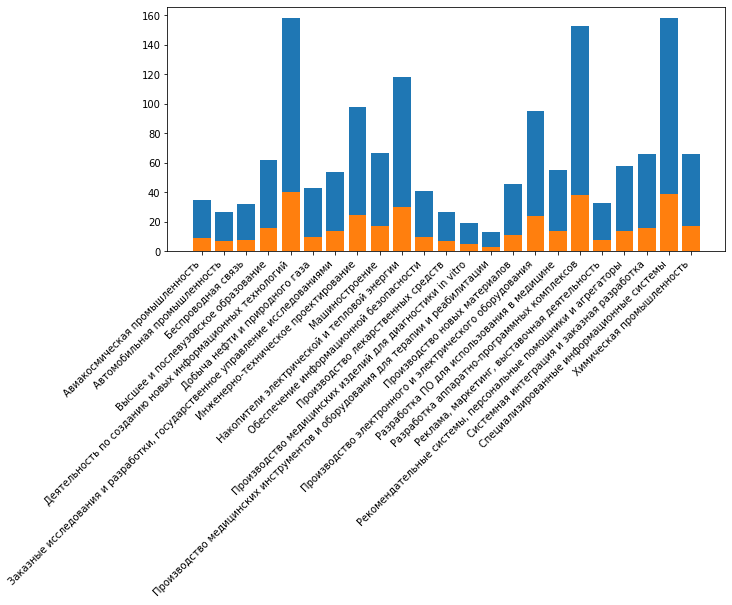

In [ ]:
# Проверка сбалансированности выборок по классам
fig = plt.figure(figsize=(10, 5))
c_train = np.bincount(np.argmax(y_train, axis=1))
c_test = np.bincount(np.argmax(y_test, axis=1))
plt.bar(CLASS_LIST, c_train)
plt.bar(CLASS_LIST, c_test)
fig.autofmt_xdate(rotation=45)
plt.show()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 256)               7680256   
                                                                 
 dropout_11 (Dropout)        (None, 256)               0         
                                                                 
 dense_17 (Dense)            (None, 128)               32896     
                                                                 
 dropout_12 (Dropout)        (None, 128)               0         
                                                                 
 dense_18 (Dense)            (None, 64)                8256      
                                                                 
 dropout_13 (Dropout)        (None, 64)                0         
                                                                 
 dense_19 (Dense)            (None, 23)               

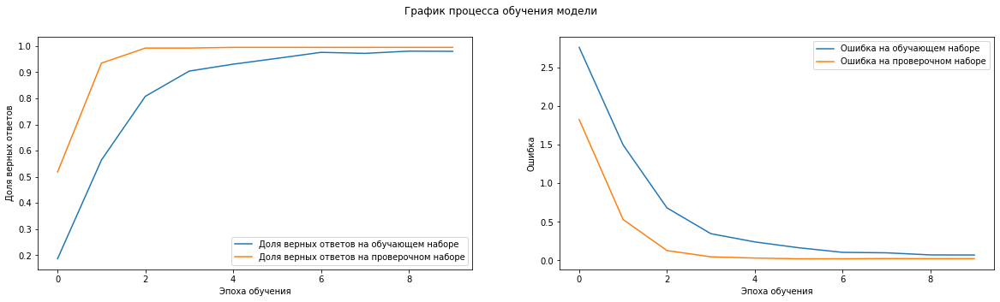

12/12 [==============================] - 0s 14ms/step


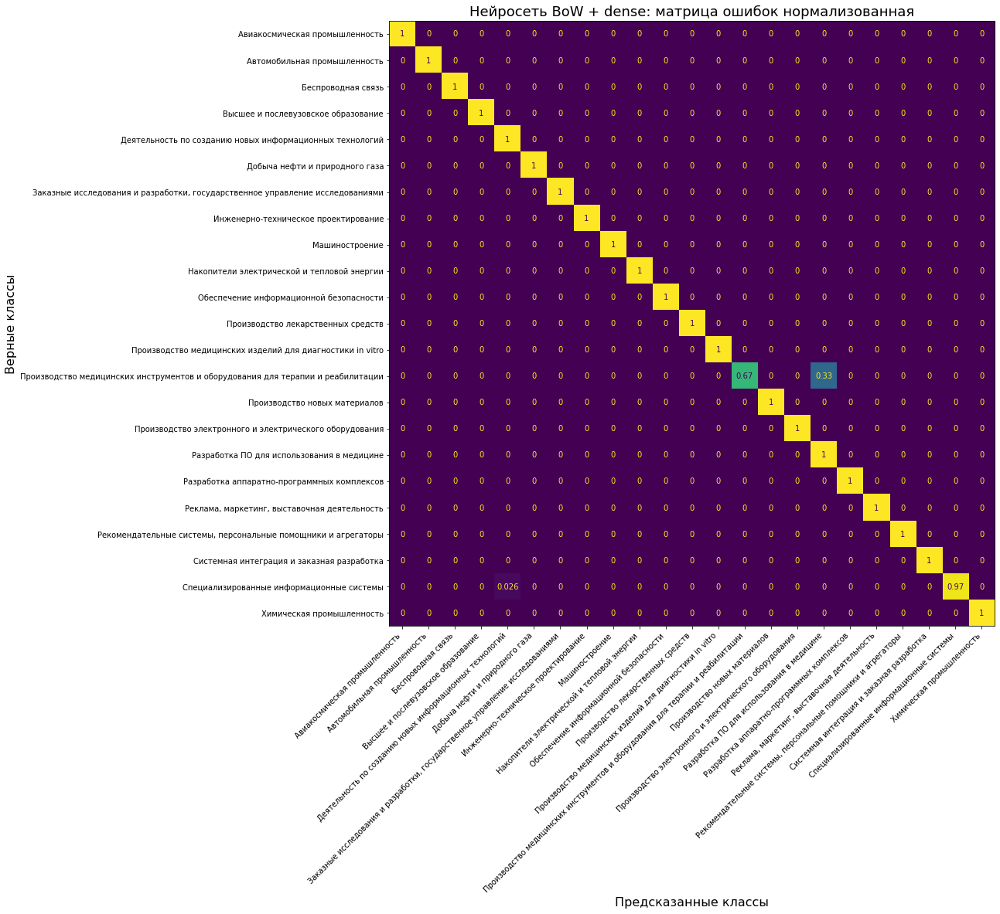

----------------------------------------------------------------------------------------------------
Нейросеть: BoW + dense
Класс: Авиакосмическая промышленность 100% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность 100% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий 100% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа 100% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями 100% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследованиями 

In [ ]:
# Последовательная модель
model_com_okpd_text_bow_dense = Sequential()
# Входной полносвязный слой
model_com_okpd_text_bow_dense.add(Dense(256, input_dim=VOCAB_SIZE, activation="relu"))
# Слой регуляризации Dropout
model_com_okpd_text_bow_dense.add(Dropout(0.4))
# Второй полносвязный слой
model_com_okpd_text_bow_dense.add(Dense(128, activation='relu'))
# Слой регуляризации Dropout
model_com_okpd_text_bow_dense.add(Dropout(0.4))
# Третий полносвязный слой
model_com_okpd_text_bow_dense.add(Dense(64, activation='relu'))
# Слой регуляризации Dropout
model_com_okpd_text_bow_dense.add(Dropout(0.4))
# Выходной полносвязный слой
model_com_okpd_text_bow_dense.add(Dense(CLASS_COUNT, activation='softmax'))

# Входные данные подаются в виде векторов bag of words
compile_train_eval_model(model_com_okpd_text_bow_dense,
                         x_train_01, y_train,
                         x_test_01, y_test,
                         epochs=10,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='BoW + dense')

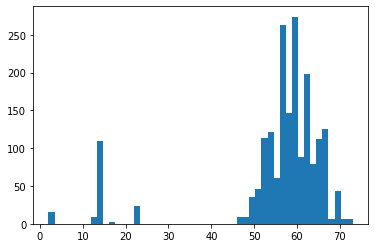

In [ ]:
# Построение гистограммы распределения длин текстов в словах основного набора
seq_len = [len(x) for x in x_data]
plt.hist(seq_len, 50)
plt.show()

In [ ]:
# Снижение размерности входных данных:
# ограничение длины последовательностей до разумного предела
seq_max_len = 400
x_train_clip = pad_sequences(x_train, maxlen=seq_max_len)
x_test_clip = pad_sequences(x_test, maxlen=seq_max_len)

# Проверка формы результата
print(x_train_clip.shape, x_test_clip.shape)

(1524, 400) (382, 400)


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 400, 50)           1500000   
                                                                 
 spatial_dropout1d_2 (Spatia  (None, 400, 50)          0         
 lDropout1D)                                                     
                                                                 
 flatten_2 (Flatten)         (None, 20000)             0         
                                                                 
 batch_normalization_4 (Batc  (None, 20000)            80000     
 hNormalization)                                                 
                                                                 
 dense_20 (Dense)            (None, 64)                1280064   
                                                                 
 dropout_14 (Dropout)        (None, 64)               

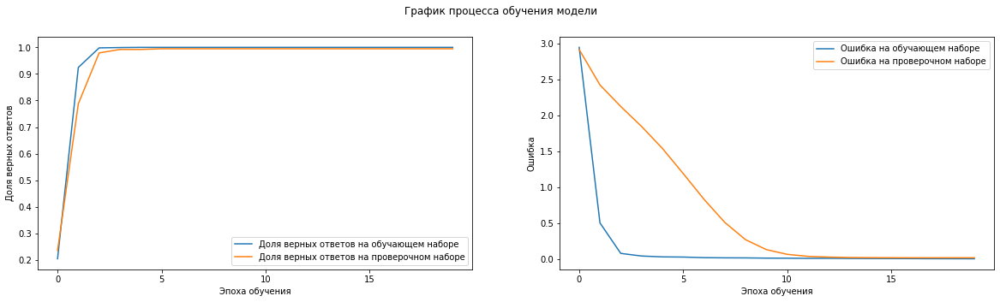

12/12 [==============================] - 0s 5ms/step


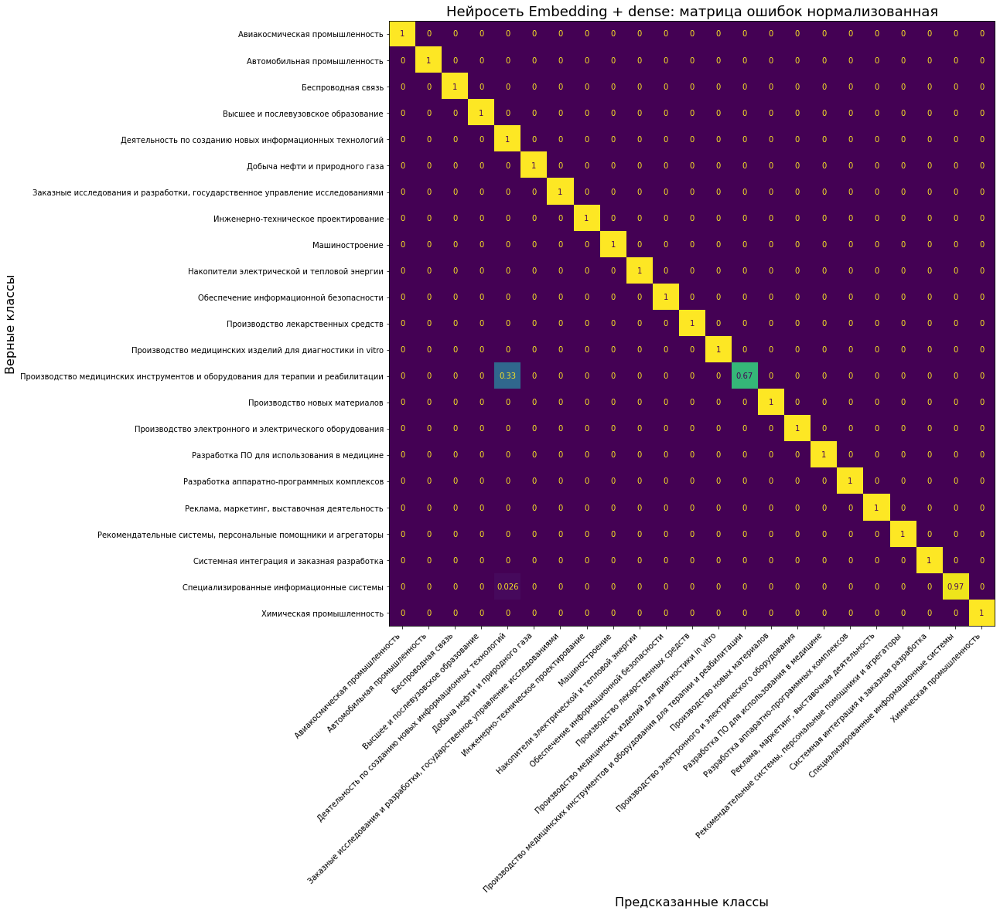

----------------------------------------------------------------------------------------------------
Нейросеть: Embedding + dense
Класс: Авиакосмическая промышленность 100% сеть отнесла к классу Авиакосмическая промышленность - ВЕРНО :-)
Класс: Автомобильная промышленность 100% сеть отнесла к классу Автомобильная промышленность - ВЕРНО :-)
Класс: Беспроводная связь   100% сеть отнесла к классу Беспроводная связь   - ВЕРНО :-)
Класс: Высшее и послевузовское образование 100% сеть отнесла к классу Высшее и послевузовское образование - ВЕРНО :-)
Класс: Деятельность по созданию новых информационных технологий 100% сеть отнесла к классу Деятельность по созданию новых информационных технологий - ВЕРНО :-)
Класс: Добыча нефти и природного газа 100% сеть отнесла к классу Добыча нефти и природного газа - ВЕРНО :-)
Класс: Заказные исследования и разработки, государственное управление исследованиями 100% сеть отнесла к классу Заказные исследования и разработки, государственное управление исследова

In [ ]:
# Последовательная модель
model_com_okpd_text_emb_dense = Sequential()
# Cлой эмбеддингов
model_com_okpd_text_emb_dense.add(Embedding(VOCAB_SIZE, 50, input_length=seq_max_len))
# Слой регуляризации Dropout
model_com_okpd_text_emb_dense.add(SpatialDropout1D(0.2))
# Cлой преобразования многомерных данных в одномерные
model_com_okpd_text_emb_dense.add(Flatten())
# Слой пакетной нормализации
model_com_okpd_text_emb_dense.add(BatchNormalization())
# Полносвязный слой
model_com_okpd_text_emb_dense.add(Dense(64, activation="relu"))
# Слой регуляризации Dropout
model_com_okpd_text_emb_dense.add(Dropout(0.2))
# Слой пакетной нормализации
model_com_okpd_text_emb_dense.add(BatchNormalization())
# Выходной полносвязный слой
model_com_okpd_text_emb_dense.add(Dense(CLASS_COUNT, activation='softmax'))

compile_train_eval_model(model_com_okpd_text_emb_dense,
                         x_train_clip, y_train,
                         x_test_clip, y_test,
                         epochs=20,
                         batch_size=32,
                         cm_size=(16, 16),
                         class_labels=CLASS_LIST,
                         title='Embedding + dense')